# SVM with quantum kernels

### Kernel quality framework

Applied to the `breast_cancer` dataset

In this Notebook, we use the tools developed and made available in the `qsvm_utils.py` module, to apply the proposed grid/random search framework for the systematic evaluation of quantum feature map proposals.

We use the `breast_cancer` dataset, which is a real dataset, very common as a benchmark dataset in ML. Given that it is a quite large dataset, we'll work with 2-dimensional data and only 60 observations, which is necessary for the framework to yield meaningful results in a reasonable time.

Finaly, refer to the pdf file `good_quantum_kernel_details` in the repository for details on the procedure and reasoning behind the framework.

__________

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import itertools

import time

from qsvm_utils import *

________

**Reading the data**

In [3]:
df = pd.read_csv("breast_cancer.csv")

X = df.drop(columns=["id", "diagnosis"])
y = df["diagnosis"]

**Pre-processing**
 

In [4]:
X_train, X_test, y_train, y_test, feature_dim = pre_process_data(X, y, dpp=True, n_rows=60, n_cols=None, pca=True, n_pcs=2)

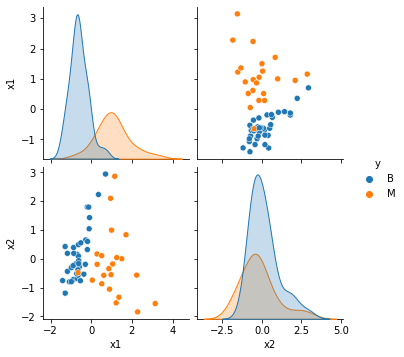

In [5]:
X_ = pd.concat([X_train, X_test])
y_ = pd.concat([y_train, y_test])

df = pd.concat([X_, y_], axis=1)

df.columns = [f"x{i+1}" for i in range(feature_dim)] + ["y"]

sns.pairplot(df, hue="y")

plt.show()

### Quantum kernels


_____________

Some fast experiments - testing functions outside of the full grid

In [6]:
reps = 1
paulis = ["X", "Z"]
entanglement = "linear"


Feature map:


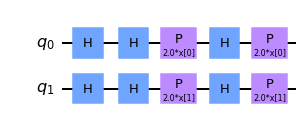

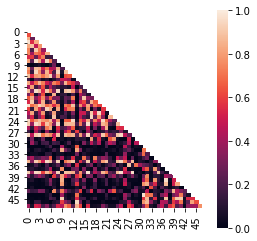

In [7]:
train_qkernel = construct_quantum_gram(reps, paulis, entanglement, X_train, None)

plot_gram(train_qkernel)


Feature map:


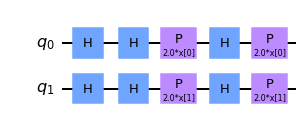


Quantum kernel matrices:



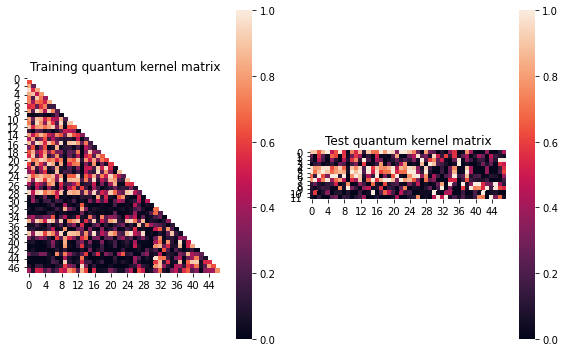


SVM with quantum kernel trained!


Test set performance:


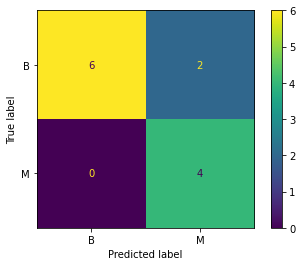

              precision    recall  f1-score   support

           B       1.00      0.75      0.86         8
           M       0.67      1.00      0.80         4

    accuracy                           0.83        12
   macro avg       0.83      0.88      0.83        12
weighted avg       0.89      0.83      0.84        12



(array([[1.   , 0.623, 0.832, ..., 0.013, 0.08 , 0.39 ],
        [0.628, 1.   , 0.264, ..., 0.021, 0.   , 0.057],
        [0.839, 0.263, 1.   , ..., 0.008, 0.136, 0.519],
        ...,
        [0.006, 0.013, 0.002, ..., 1.   , 0.634, 0.389],
        [0.081, 0.   , 0.137, ..., 0.633, 1.   , 0.759],
        [0.401, 0.065, 0.528, ..., 0.401, 0.77 , 1.   ]]),
 {'B': {'precision': 1.0,
   'recall': 0.75,
   'f1-score': 0.8571428571428571,
   'support': 8},
  'M': {'precision': 0.6666666666666666,
   'recall': 1.0,
   'f1-score': 0.8,
   'support': 4},
  'accuracy': 0.8333333333333334,
  'macro avg': {'precision': 0.8333333333333333,
   'recall': 0.875,
   'f1-score': 0.8285714285714285,
   'support': 12},
  'weighted avg': {'precision': 0.8888888888888888,
   'recall': 0.8333333333333334,
   'f1-score': 0.8380952380952381,
   'support': 12}})

In [8]:
qsvm(X_train, y_train, X_test, y_test, reps, paulis, entanglement)

_______________

Now, running the full grid!

In [9]:
# params to be varied in the grid
params = {"reps_list" : [1, 2, 3],
          "paulis_list" : combs_sub_lists(cart_product_string("XYZ", feature_dim)),
          # not considering "sca"; see notebook "architecture_study" for details
          "entanglement_list" : "linear circular full".split()}

# let's do a random search this time, with 200 combinations
param_grid, range_list = calc_param_grid(params, feature_dim, random_search=True, n_random=200)

Initial number of combinations: 1404
Number of combinations after dropping redundancies: 468
Number of random combinations chosen: 200


In [10]:
results = []



Combination 1/200
(Current range: 1/20)
			 reps : 2
			 paulis : ['XY', 'YZ']
			 entanglement : linear

Feature map:


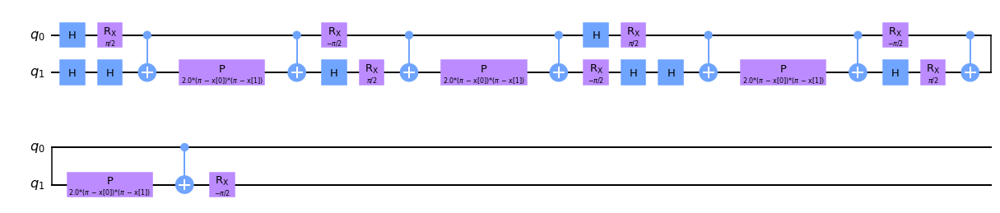


Quantum kernel matrices:



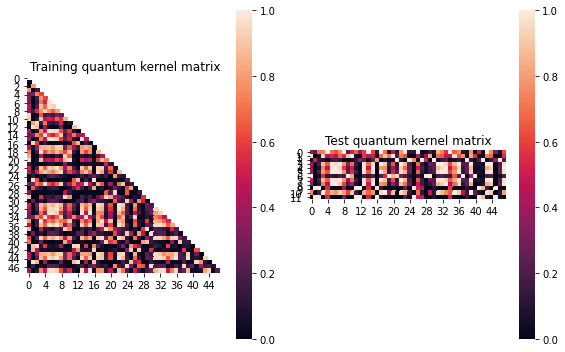


SVM with quantum kernel trained!


Test set performance:


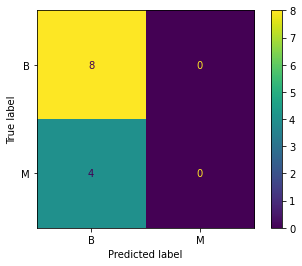

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.004941804309897491
metric(s) 2: (00, 10, 11) = (0.3882678447405788, 0.38528458886425504, 0.37241772436813636)
metric 3: -0.0


----> Kernel construction duration: 00:02:17


Combination 2/200
(Current range: 2/20)
			 reps : 3
			 paulis : ['YZ', 'YY']
			 entanglement : linear

Feature map:


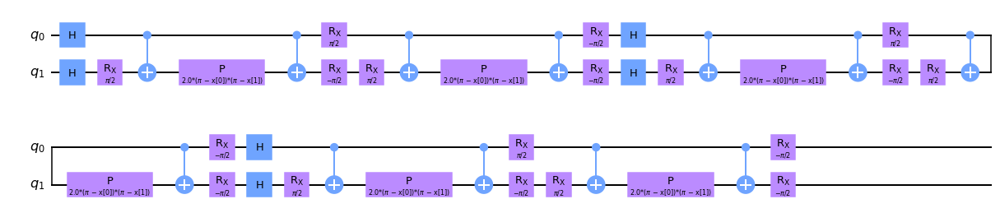


Quantum kernel matrices:



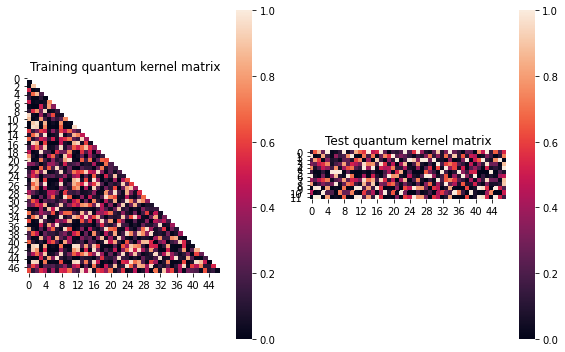


SVM with quantum kernel trained!


Test set performance:


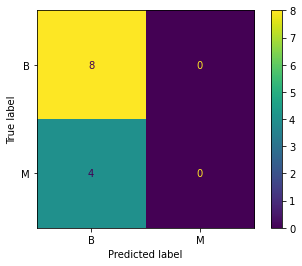

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01403791776747837
metric(s) 2: (00, 10, 11) = (0.350920814128598, 0.3327942061785643, 0.34274343376348737)
metric 3: 5.04115376233203e-310


----> Kernel construction duration: 00:03:11


Combination 3/200
(Current range: 3/20)
			 reps : 3
			 paulis : ['XY', 'X']
			 entanglement : linear

Feature map:


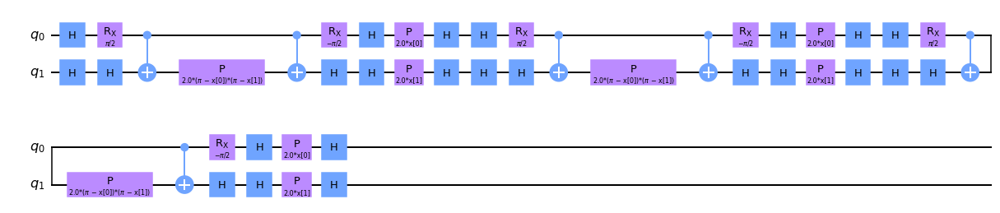


Quantum kernel matrices:



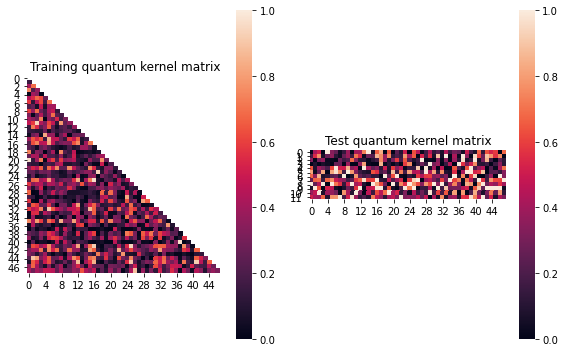


SVM with quantum kernel trained!


Test set performance:


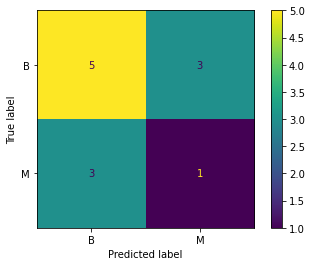

              precision    recall  f1-score   support

           B       0.62      0.62      0.62         8
           M       0.25      0.25      0.25         4

    accuracy                           0.50        12
   macro avg       0.44      0.44      0.44        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.018816343251140788
metric(s) 2: (00, 10, 11) = (0.30980490015326545, 0.28740151693065386, 0.30263082021032384)
metric 3: -3.9566530440435963e-256


----> Kernel construction duration: 00:02:15


Combination 4/200
(Current range: 4/20)
			 reps : 1
			 paulis : ['XY', 'YX']
			 entanglement : linear

Feature map:


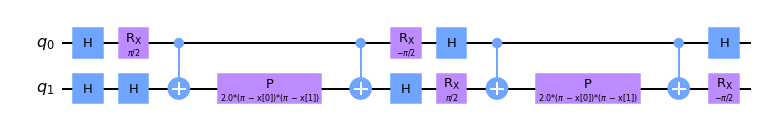


Quantum kernel matrices:



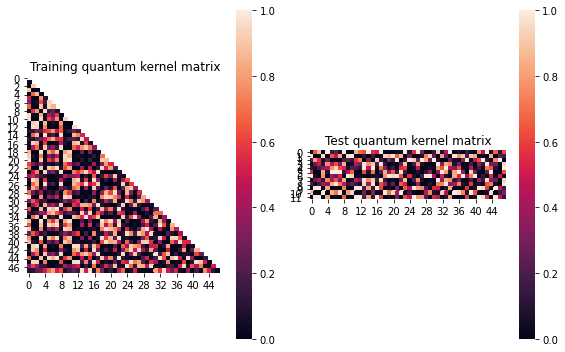


SVM with quantum kernel trained!


Test set performance:


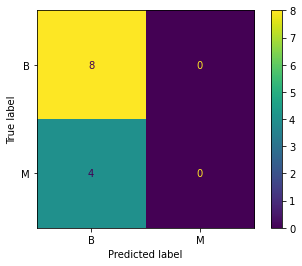

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 5/200
(Current range: 5/20)
			 reps : 1
			 paulis : ['YZ', 'X']
			 entanglement : linear

Feature map:


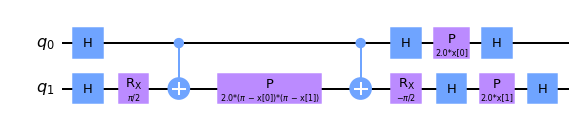


Quantum kernel matrices:



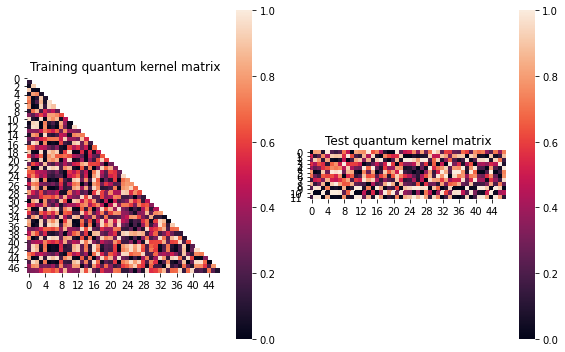


SVM with quantum kernel trained!


Test set performance:


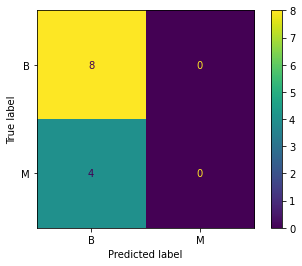

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.007097003157847559
metric(s) 2: (00, 10, 11) = (0.4746397801522789, 0.4750345271028863, 0.48962328036918873)
metric 3: 0.0


----> Kernel construction duration: 00:01:07


Combination 6/200
(Current range: 6/20)
			 reps : 2
			 paulis : ['XY', 'ZX']
			 entanglement : linear

Feature map:


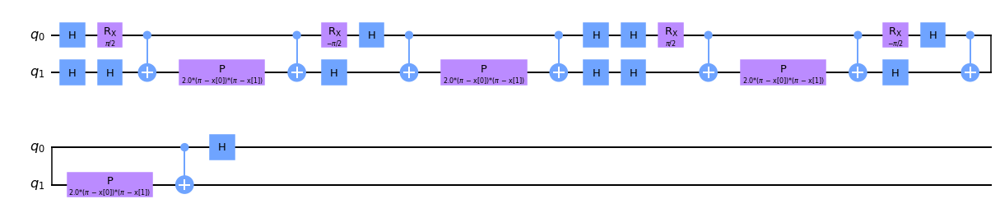


Quantum kernel matrices:



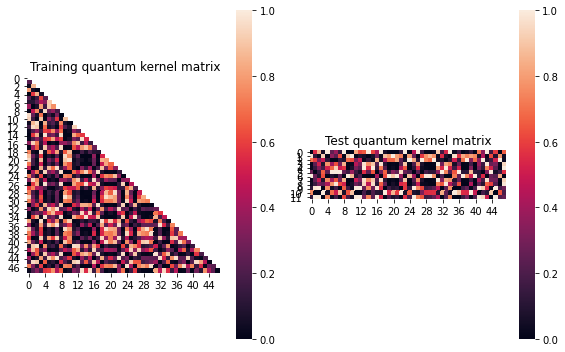


SVM with quantum kernel trained!


Test set performance:


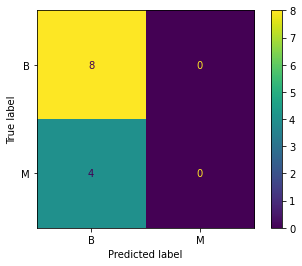

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.016072961211323122
metric(s) 2: (00, 10, 11) = (0.38381905364176955, 0.3744257662515197, 0.39717840128391607)
metric 3: 3e-323


----> Kernel construction duration: 00:02:05


Combination 7/200
(Current range: 7/20)
			 reps : 1
			 paulis : ['YZ', 'Y']
			 entanglement : linear

Feature map:


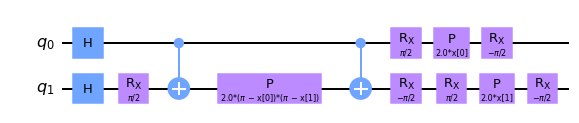


Quantum kernel matrices:



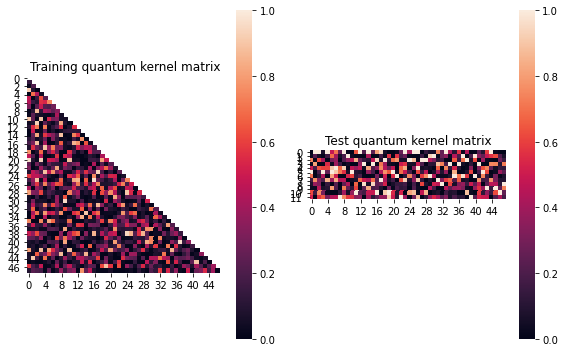


SVM with quantum kernel trained!


Test set performance:


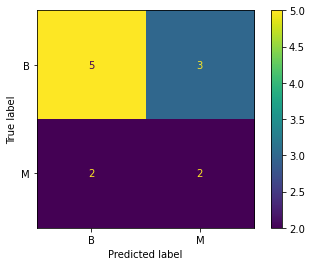

              precision    recall  f1-score   support

           B       0.71      0.62      0.67         8
           M       0.40      0.50      0.44         4

    accuracy                           0.58        12
   macro avg       0.56      0.56      0.56        12
weighted avg       0.61      0.58      0.59        12


metric 1: 0.05195175218529163
metric(s) 2: (00, 10, 11) = (0.2944161786010548, 0.22391522316224194, 0.2573177720940123)
metric 3: -6.736139999785563e-305


----> Kernel construction duration: 00:01:04


Combination 8/200
(Current range: 8/20)
			 reps : 3
			 paulis : ['XY', 'ZZ']
			 entanglement : linear

Feature map:


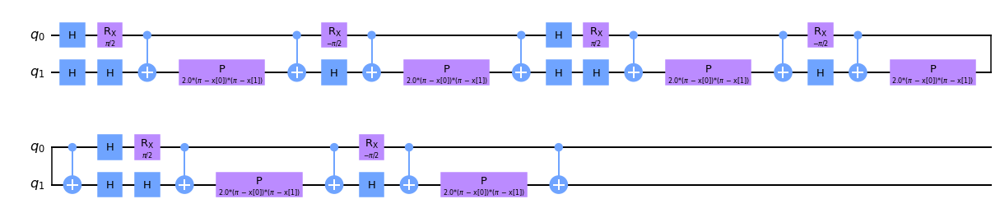


Quantum kernel matrices:



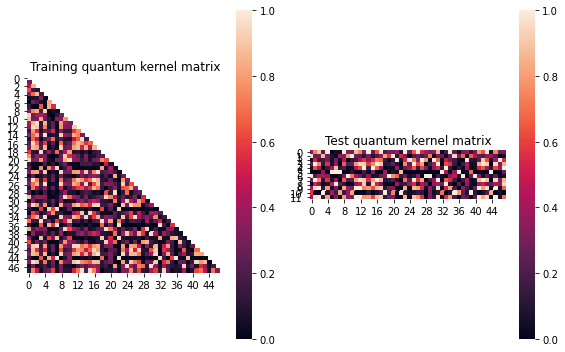


SVM with quantum kernel trained!


Test set performance:


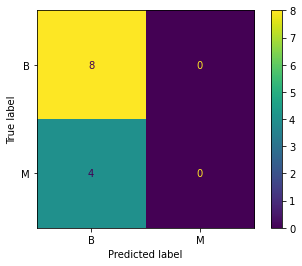

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013275432505387652
metric(s) 2: (00, 10, 11) = (0.3725043600483323, 0.3402326338242013, 0.3345117726108456)
metric 3: -1.2438398942688039e-306


----> Kernel construction duration: 00:03:03


Combination 9/200
(Current range: 9/20)
			 reps : 2
			 paulis : ['XY', 'Z']
			 entanglement : linear

Feature map:


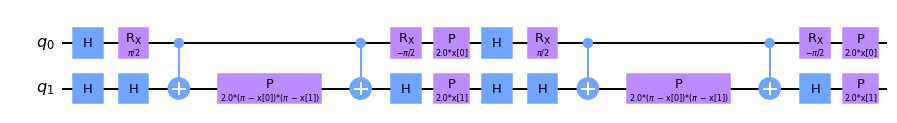


Quantum kernel matrices:



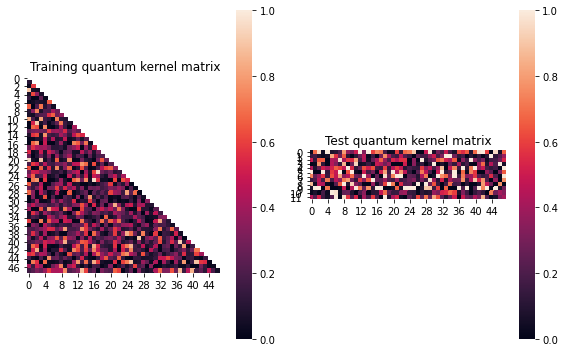


SVM with quantum kernel trained!


Test set performance:


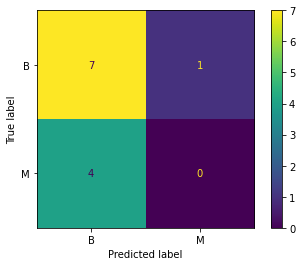

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: 0.009554385403997945
metric(s) 2: (00, 10, 11) = (0.2913555162554585, 0.27661519305402477, 0.28098364066058684)
metric 3: 8.611877766215311e-255


----> Kernel construction duration: 00:01:38


Combination 10/200
(Current range: 10/20)
			 reps : 3
			 paulis : ['XY', 'XZ']
			 entanglement : linear

Feature map:


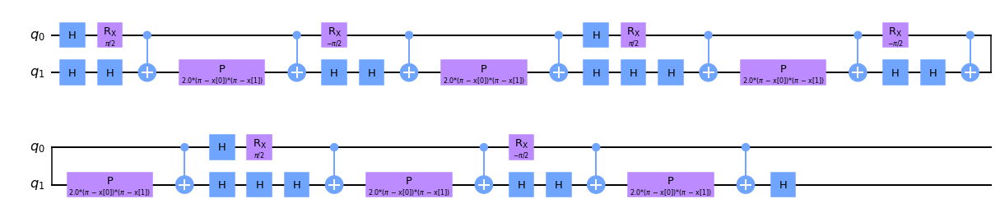


Quantum kernel matrices:



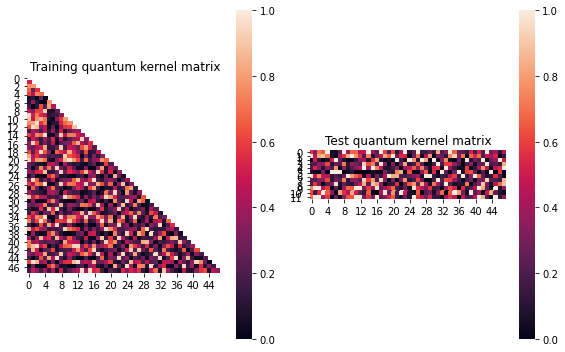


SVM with quantum kernel trained!


Test set performance:


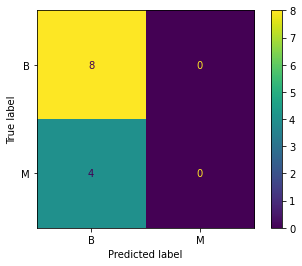

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.025590767139992143
metric(s) 2: (00, 10, 11) = (0.406857700243701, 0.36186341923954385, 0.368050672515371)
metric 3: 4.361423705169313e-291


----> Kernel construction duration: 00:02:51


Combination 11/200
(Current range: 11/20)
			 reps : 1
			 paulis : ['YX', 'Y']
			 entanglement : linear

Feature map:


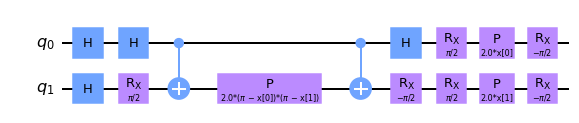


Quantum kernel matrices:



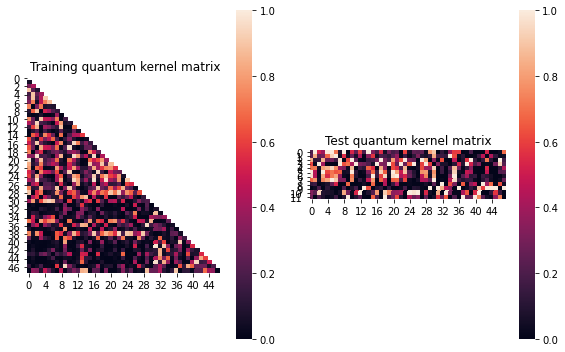


SVM with quantum kernel trained!


Test set performance:


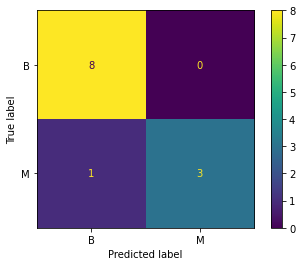

              precision    recall  f1-score   support

           B       0.89      1.00      0.94         8
           M       1.00      0.75      0.86         4

    accuracy                           0.92        12
   macro avg       0.94      0.88      0.90        12
weighted avg       0.93      0.92      0.91        12


metric 1: 0.1423917302860702
metric(s) 2: (00, 10, 11) = (0.3733515774831402, 0.17630273124323106, 0.2640373455754623)
metric 3: 0.0


----> Kernel construction duration: 00:00:53


Combination 12/200
(Current range: 12/20)
			 reps : 2
			 paulis : ['X', 'Y']
			 entanglement : linear

Feature map:


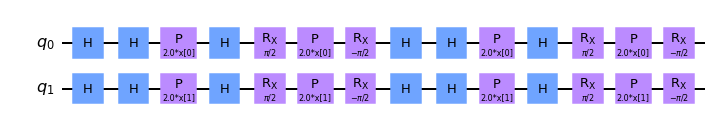


Quantum kernel matrices:



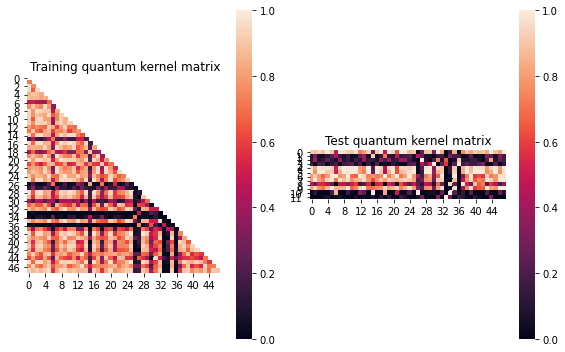


SVM with quantum kernel trained!


Test set performance:


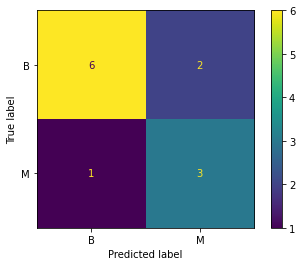

              precision    recall  f1-score   support

           B       0.86      0.75      0.80         8
           M       0.60      0.75      0.67         4

    accuracy                           0.75        12
   macro avg       0.73      0.75      0.73        12
weighted avg       0.77      0.75      0.76        12


metric 1: 0.03986455713524184
metric(s) 2: (00, 10, 11) = (0.6778331661847713, 0.5636648347363535, 0.5292256175584193)
metric 3: -3.2436115e-316


----> Kernel construction duration: 00:00:33


Combination 13/200
(Current range: 13/20)
			 reps : 1
			 paulis : ['YY', 'XY']
			 entanglement : linear

Feature map:


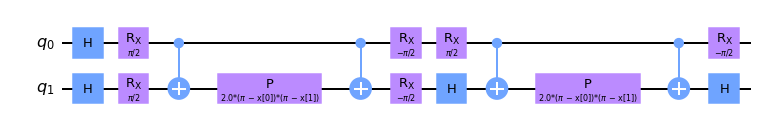


Quantum kernel matrices:



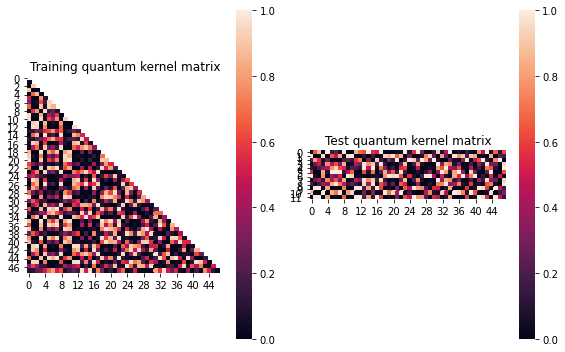


SVM with quantum kernel trained!


Test set performance:


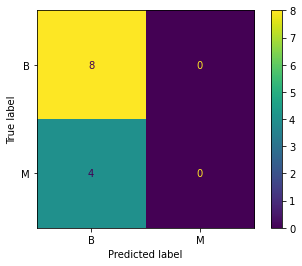

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 14/200
(Current range: 14/20)
			 reps : 2
			 paulis : ['YY', 'ZX']
			 entanglement : linear

Feature map:


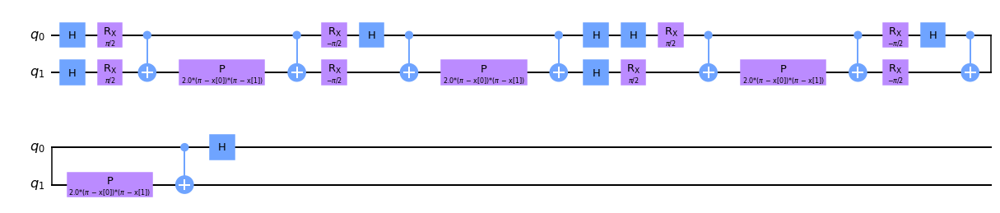


Quantum kernel matrices:



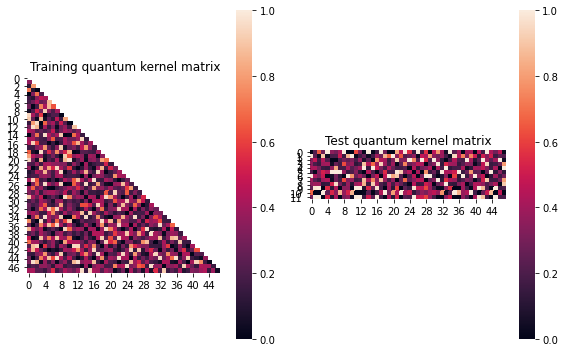


SVM with quantum kernel trained!


Test set performance:


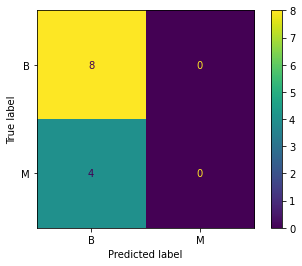

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013070220061843607
metric(s) 2: (00, 10, 11) = (0.3705810321458343, 0.35959226304475056, 0.374743934067354)
metric 3: -0.0


----> Kernel construction duration: 00:02:28


Combination 15/200
(Current range: 15/20)
			 reps : 1
			 paulis : ['ZY', 'YX']
			 entanglement : linear

Feature map:


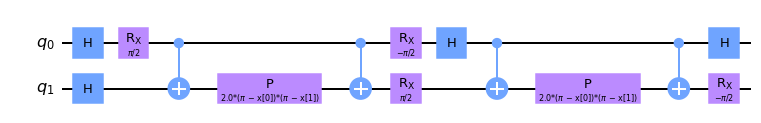


Quantum kernel matrices:



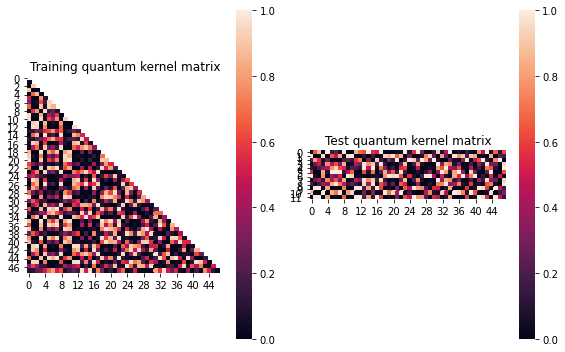


SVM with quantum kernel trained!


Test set performance:


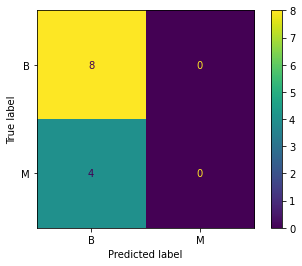

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:19


Combination 16/200
(Current range: 16/20)
			 reps : 2
			 paulis : ['YX', 'ZZ']
			 entanglement : linear

Feature map:


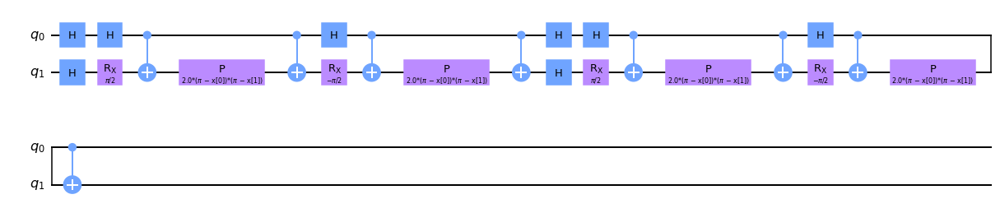


Quantum kernel matrices:



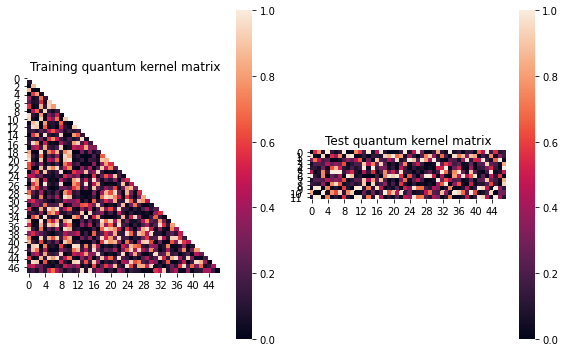


SVM with quantum kernel trained!


Test set performance:


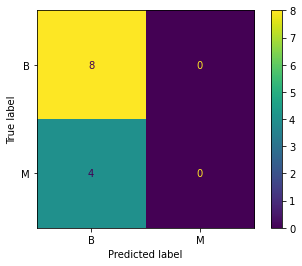

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.018277120843553207
metric(s) 2: (00, 10, 11) = (0.36039242300314844, 0.349558394713076, 0.37527860811011)
metric 3: 0.0


----> Kernel construction duration: 00:02:05


Combination 17/200
(Current range: 17/20)
			 reps : 2
			 paulis : ['YZ', 'YZ']
			 entanglement : linear

Feature map:


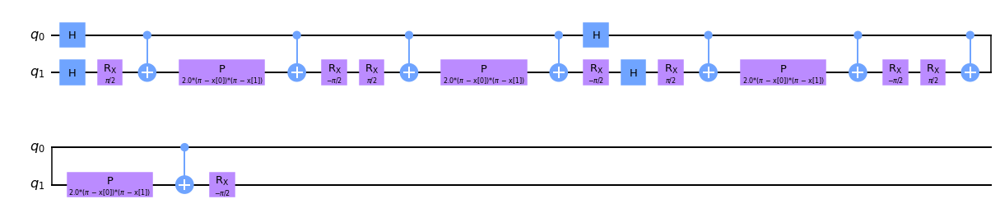


Quantum kernel matrices:



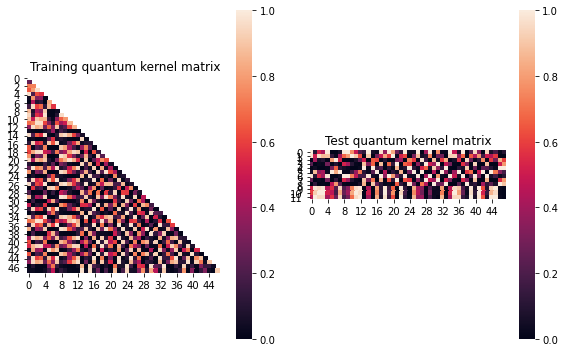


SVM with quantum kernel trained!


Test set performance:


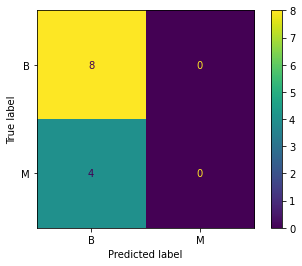

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.020892158097017832
metric(s) 2: (00, 10, 11) = (0.4112506262798868, 0.37125938362500255, 0.373052457164154)
metric 3: 0.0


----> Kernel construction duration: 00:01:26


Combination 18/200
(Current range: 18/20)
			 reps : 2
			 paulis : ['XZ', 'X']
			 entanglement : linear

Feature map:


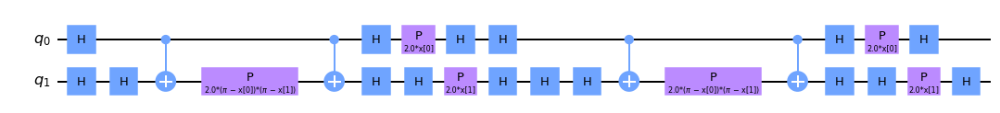


Quantum kernel matrices:



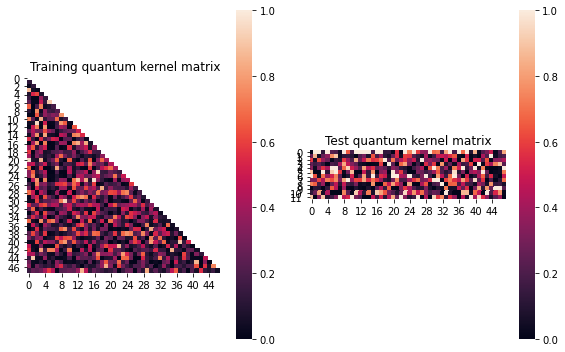


SVM with quantum kernel trained!


Test set performance:


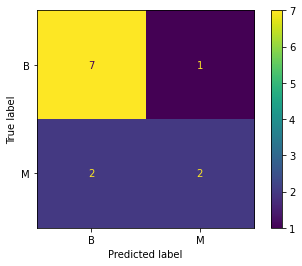

              precision    recall  f1-score   support

           B       0.78      0.88      0.82         8
           M       0.67      0.50      0.57         4

    accuracy                           0.75        12
   macro avg       0.72      0.69      0.70        12
weighted avg       0.74      0.75      0.74        12


metric 1: 0.03585252757727714
metric(s) 2: (00, 10, 11) = (0.31352266561401154, 0.2603854528233172, 0.27895329518717715)
metric 3: -2.099725728992306e-270


----> Kernel construction duration: 00:01:31


Combination 19/200
(Current range: 19/20)
			 reps : 2
			 paulis : ['XX', 'XY']
			 entanglement : linear

Feature map:


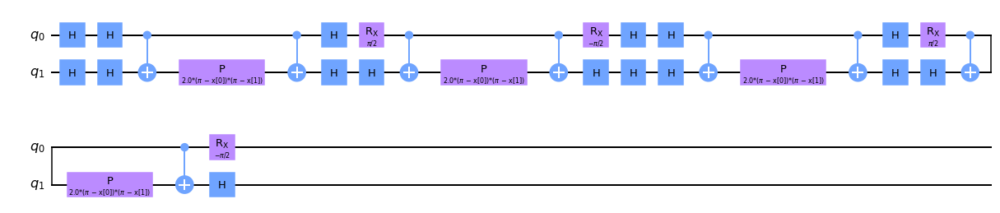


Quantum kernel matrices:



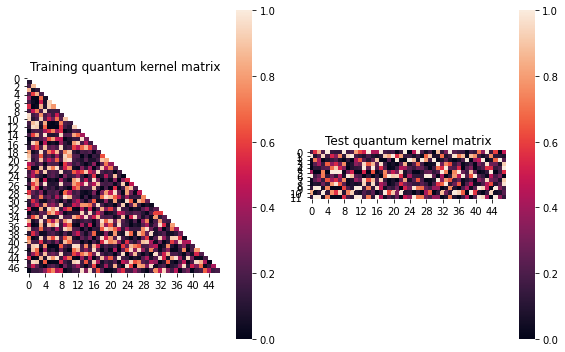


SVM with quantum kernel trained!


Test set performance:


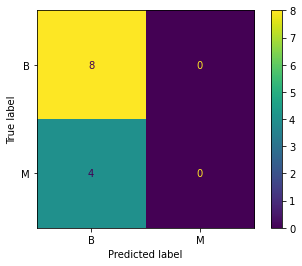

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.016994276134339736
metric(s) 2: (00, 10, 11) = (0.3799551264383179, 0.35825509813686274, 0.37054362210408703)
metric 3: 1e-323


----> Kernel construction duration: 00:01:43


Combination 20/200
(Current range: 20/20)
			 reps : 2
			 paulis : ['ZY', 'YZ']
			 entanglement : linear

Feature map:


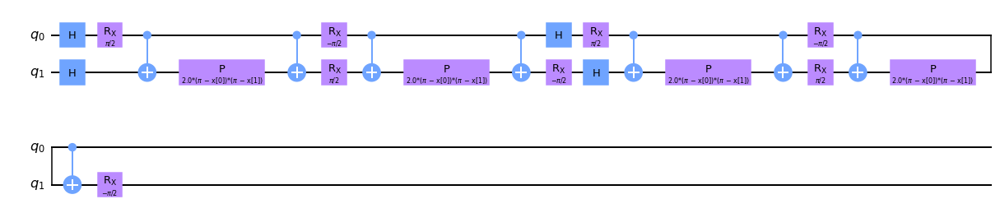


Quantum kernel matrices:



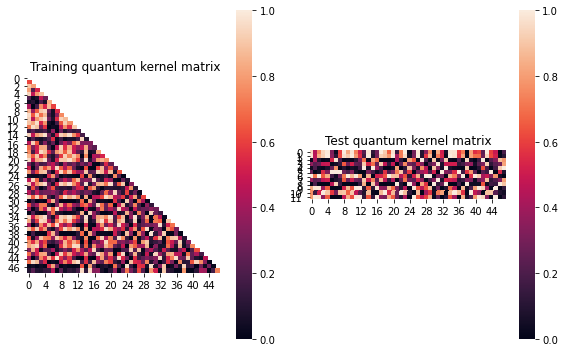


SVM with quantum kernel trained!


Test set performance:


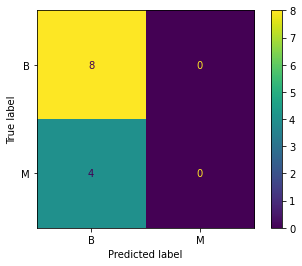

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.029860951745349917
metric(s) 2: (00, 10, 11) = (0.47061121199741746, 0.40922662134191407, 0.40756393417711057)
metric 3: -0.0


----> Kernel construction duration: 00:02:27


In [11]:
j=0
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 21/200
(Current range: 1/20)
			 reps : 2
			 paulis : ['YY', 'XY']
			 entanglement : linear

Feature map:


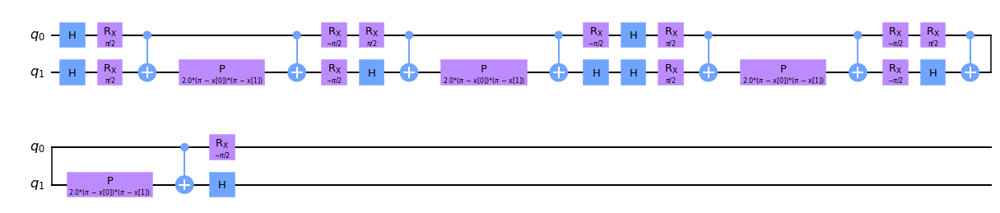


Quantum kernel matrices:



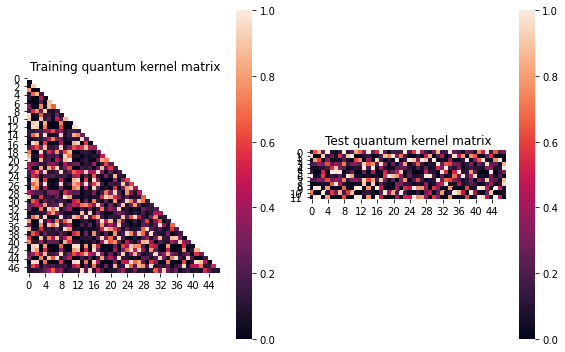


SVM with quantum kernel trained!


Test set performance:


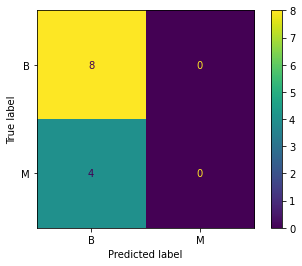

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01677691346510435
metric(s) 2: (00, 10, 11) = (0.34389127241310613, 0.3273988462699927, 0.34446024705708794)
metric 3: -5.805e-321


----> Kernel construction duration: 00:02:07


Combination 22/200
(Current range: 2/20)
			 reps : 3
			 paulis : ['YZ', 'Z']
			 entanglement : linear

Feature map:


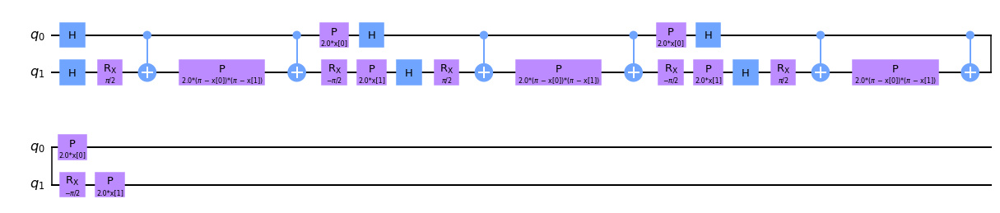


Quantum kernel matrices:



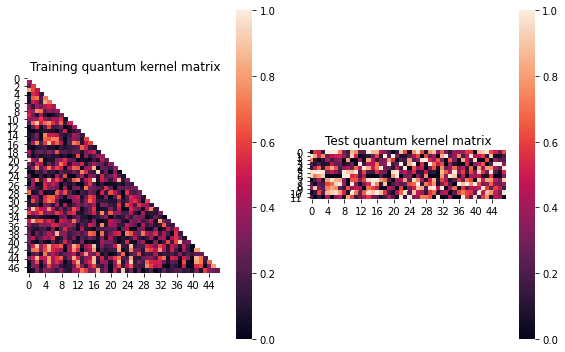


SVM with quantum kernel trained!


Test set performance:


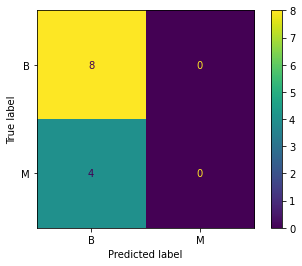

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.00842738447698127
metric(s) 2: (00, 10, 11) = (0.321771203644131, 0.3062619546733557, 0.307607474656543)
metric 3: 1.3380809564537925e-267


----> Kernel construction duration: 00:02:24


Combination 23/200
(Current range: 3/20)
			 reps : 1
			 paulis : ['ZX', 'YY']
			 entanglement : linear

Feature map:


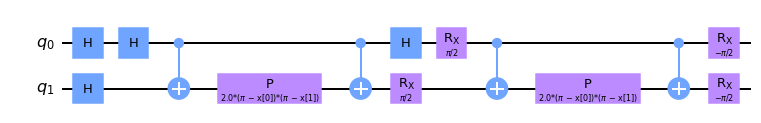


Quantum kernel matrices:



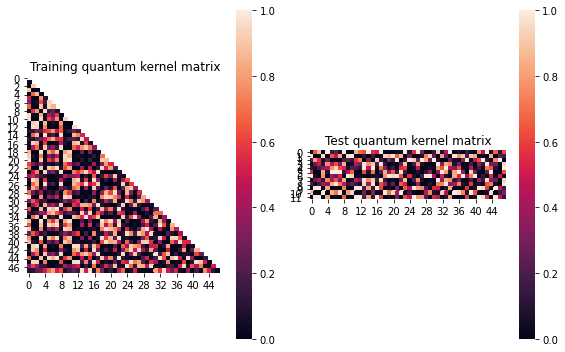


SVM with quantum kernel trained!


Test set performance:


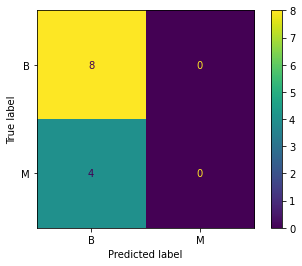

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:08


Combination 24/200
(Current range: 4/20)
			 reps : 2
			 paulis : ['YZ', 'Z']
			 entanglement : linear

Feature map:


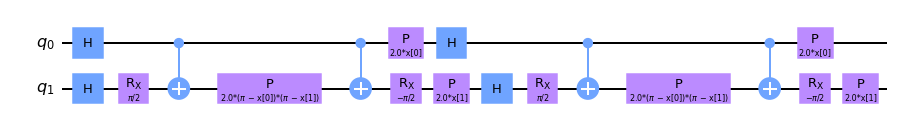


Quantum kernel matrices:



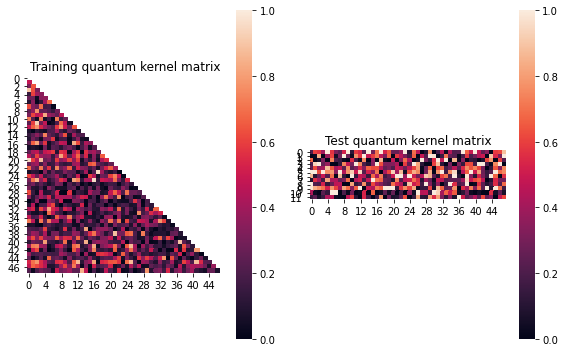


SVM with quantum kernel trained!


Test set performance:


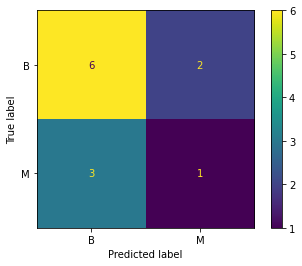

              precision    recall  f1-score   support

           B       0.67      0.75      0.71         8
           M       0.33      0.25      0.29         4

    accuracy                           0.58        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.56      0.58      0.57        12


metric 1: 0.031091433843796645
metric(s) 2: (00, 10, 11) = (0.32861607394868864, 0.2766708105617738, 0.28690841486245217)
metric 3: 1.9966372242368113e-257


----> Kernel construction duration: 00:01:44


Combination 25/200
(Current range: 5/20)
			 reps : 3
			 paulis : ['X']
			 entanglement : linear

Feature map:


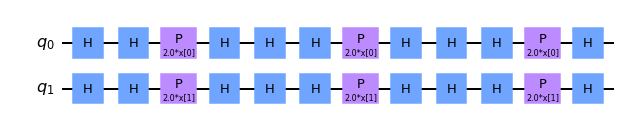


Quantum kernel matrices:



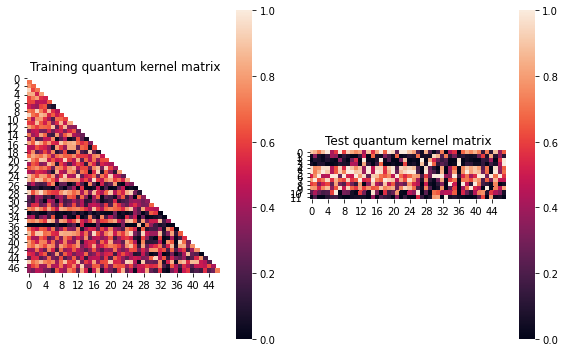


SVM with quantum kernel trained!


Test set performance:


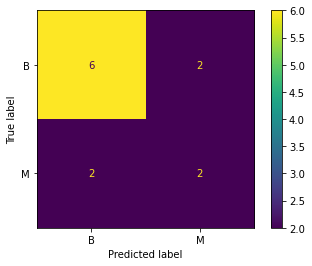

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.04093812056554735
metric(s) 2: (00, 10, 11) = (0.5372847733056034, 0.4452082949225029, 0.43500805767049716)
metric 3: 4.328972990428254e-271


----> Kernel construction duration: 00:00:32


Combination 26/200
(Current range: 6/20)
			 reps : 1
			 paulis : ['Y', 'Z']
			 entanglement : linear

Feature map:


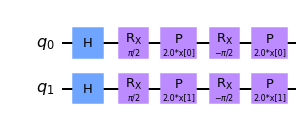


Quantum kernel matrices:



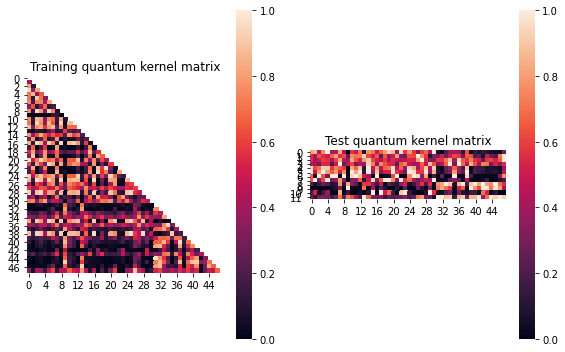


SVM with quantum kernel trained!


Test set performance:


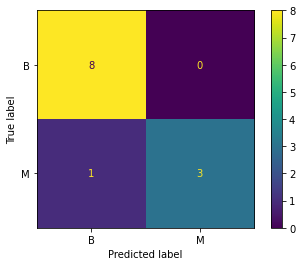

              precision    recall  f1-score   support

           B       0.89      1.00      0.94         8
           M       1.00      0.75      0.86         4

    accuracy                           0.92        12
   macro avg       0.94      0.88      0.90        12
weighted avg       0.93      0.92      0.91        12


metric 1: 0.14283663768987293
metric(s) 2: (00, 10, 11) = (0.46113915593376736, 0.2641700072979352, 0.35287413404184886)
metric 3: -2.8770774435612784e-286


----> Kernel construction duration: 00:00:31


Combination 27/200
(Current range: 7/20)
			 reps : 2
			 paulis : ['YX', 'YY']
			 entanglement : linear

Feature map:


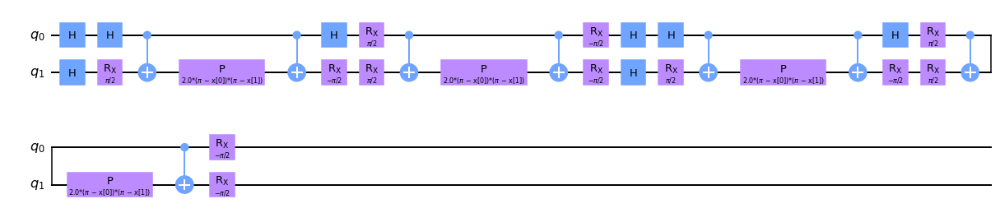


Quantum kernel matrices:



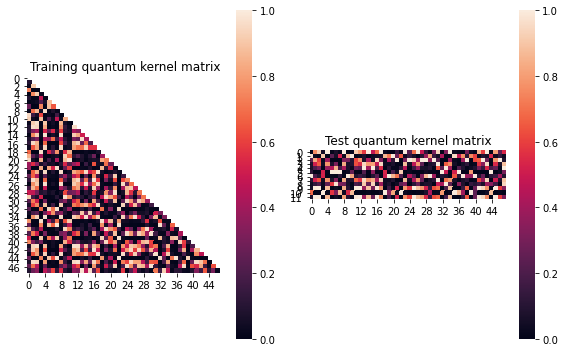


SVM with quantum kernel trained!


Test set performance:


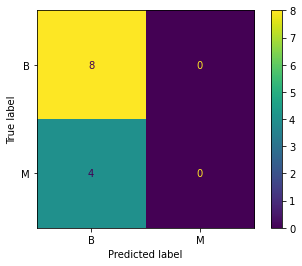

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.014902804835538075
metric(s) 2: (00, 10, 11) = (0.35700569208386645, 0.33918414436027217, 0.351168206307754)
metric 3: 0.0


----> Kernel construction duration: 00:01:57


Combination 28/200
(Current range: 8/20)
			 reps : 2
			 paulis : ['YY', 'YY']
			 entanglement : linear

Feature map:


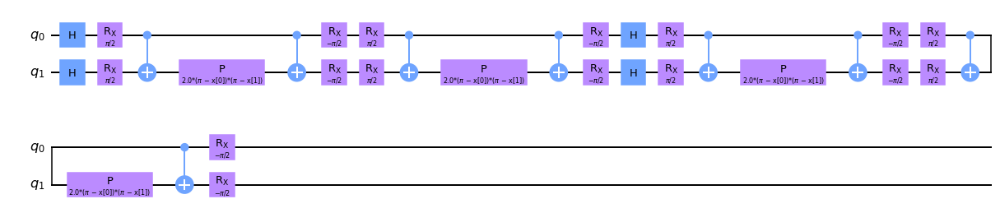


Quantum kernel matrices:



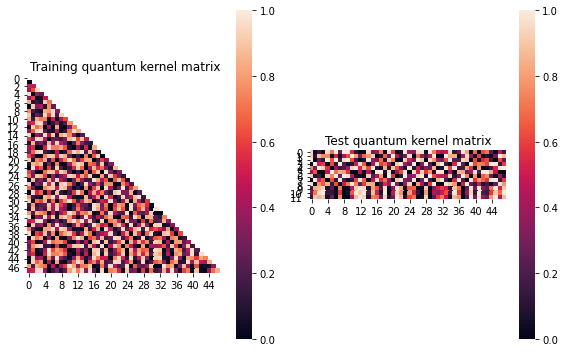


SVM with quantum kernel trained!


Test set performance:


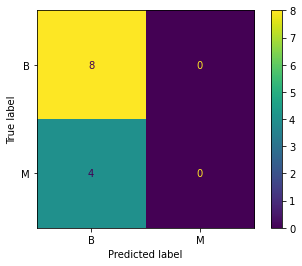

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.005512879146382266
metric(s) 2: (00, 10, 11) = (0.48625318910245735, 0.48222958362822826, 0.48923173644676365)
metric 3: 0.0


----> Kernel construction duration: 00:01:27


Combination 29/200
(Current range: 9/20)
			 reps : 2
			 paulis : ['ZZ', 'ZX']
			 entanglement : linear

Feature map:


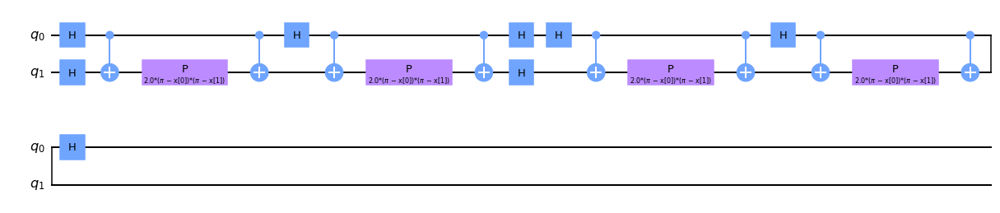


Quantum kernel matrices:



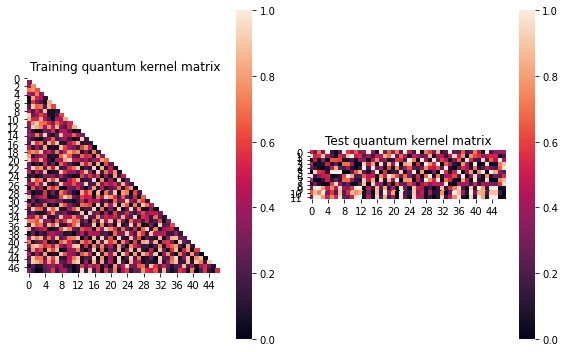


SVM with quantum kernel trained!


Test set performance:


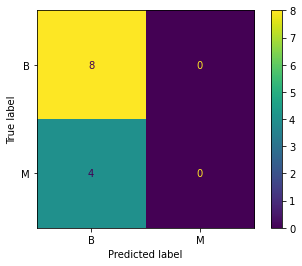

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.016233442372543427
metric(s) 2: (00, 10, 11) = (0.4365862145532796, 0.41347901597646597, 0.42283870214473923)
metric 3: 5.8e-322


----> Kernel construction duration: 00:01:53


Combination 30/200
(Current range: 10/20)
			 reps : 2
			 paulis : ['ZY', 'XZ']
			 entanglement : linear

Feature map:


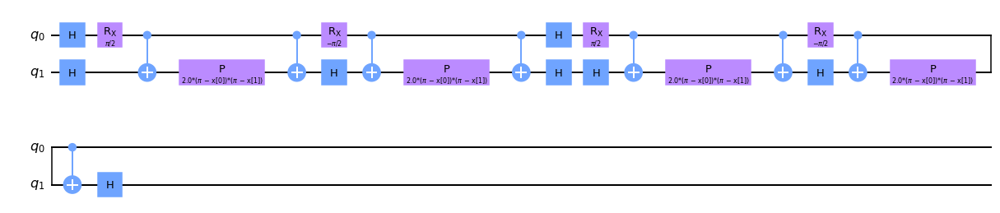


Quantum kernel matrices:



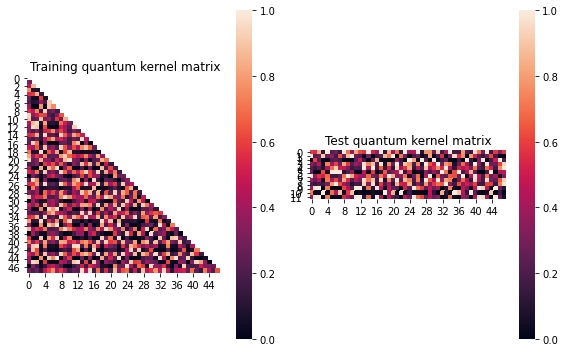


SVM with quantum kernel trained!


Test set performance:


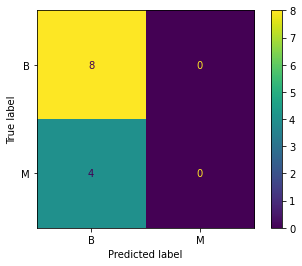

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.023602554074856952
metric(s) 2: (00, 10, 11) = (0.4302845776651415, 0.39300137782713696, 0.4029232861388463)
metric 3: 0.0


----> Kernel construction duration: 00:02:15


Combination 31/200
(Current range: 11/20)
			 reps : 3
			 paulis : ['XZ', 'X']
			 entanglement : linear

Feature map:


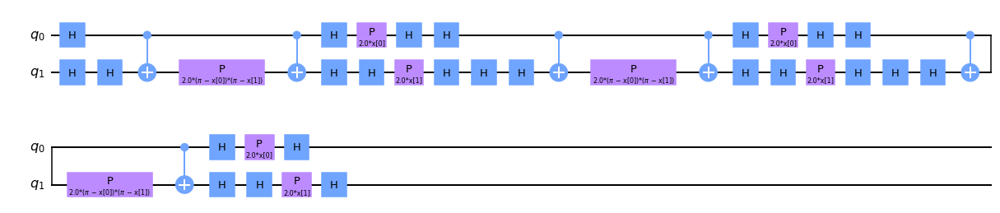


Quantum kernel matrices:



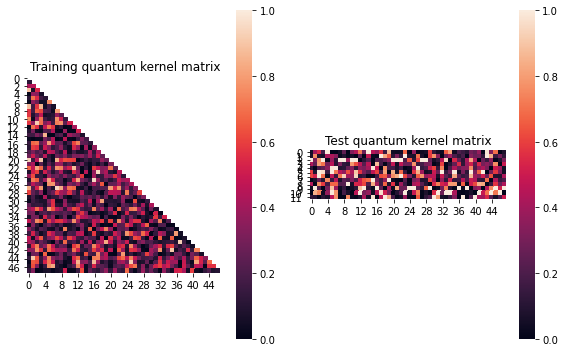


SVM with quantum kernel trained!


Test set performance:


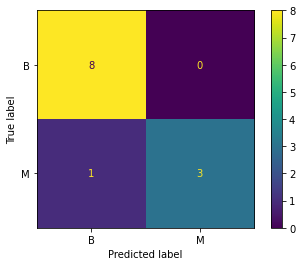

              precision    recall  f1-score   support

           B       0.89      1.00      0.94         8
           M       1.00      0.75      0.86         4

    accuracy                           0.92        12
   macro avg       0.94      0.88      0.90        12
weighted avg       0.93      0.92      0.91        12


metric 1: 0.03157891122091877
metric(s) 2: (00, 10, 11) = (0.3263136562247828, 0.2814905449974004, 0.29982525621185546)
metric 3: 1.5007826767778678e-241


----> Kernel construction duration: 00:02:07


Combination 32/200
(Current range: 12/20)
			 reps : 3
			 paulis : ['XX', 'ZX']
			 entanglement : linear

Feature map:


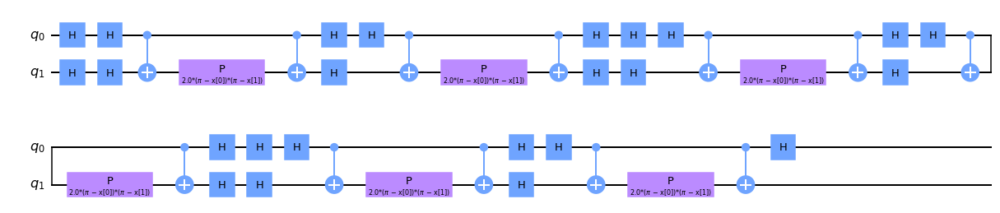


Quantum kernel matrices:



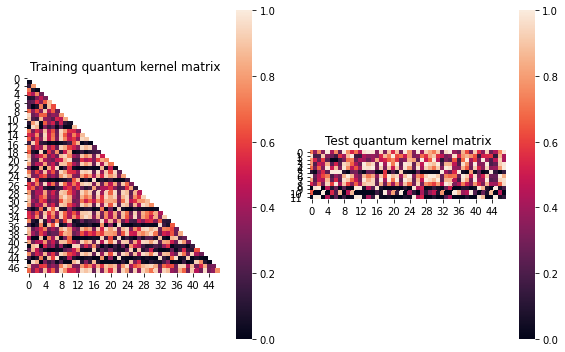


SVM with quantum kernel trained!


Test set performance:


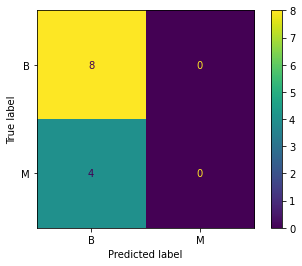

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.028030755636267723
metric(s) 2: (00, 10, 11) = (0.4984204602331925, 0.47506299428439097, 0.507767039608125)
metric 3: 0.0


----> Kernel construction duration: 00:02:20


Combination 33/200
(Current range: 13/20)
			 reps : 2
			 paulis : ['XZ', 'XX']
			 entanglement : linear

Feature map:


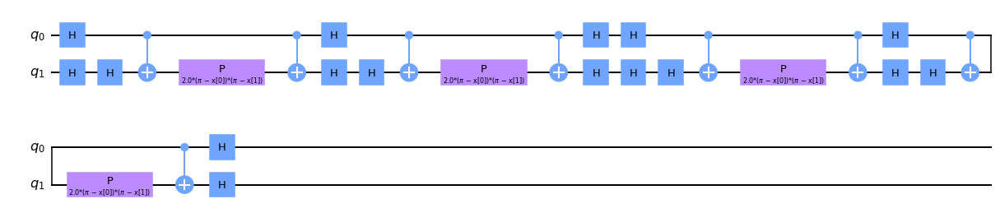


Quantum kernel matrices:



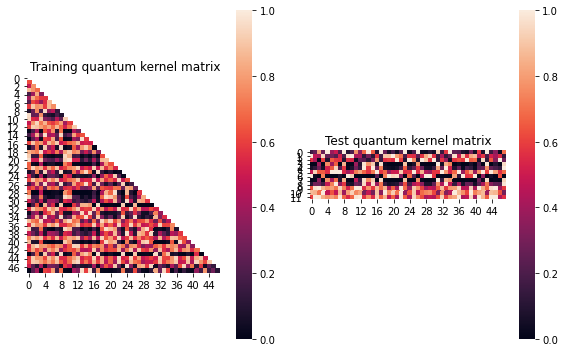


SVM with quantum kernel trained!


Test set performance:


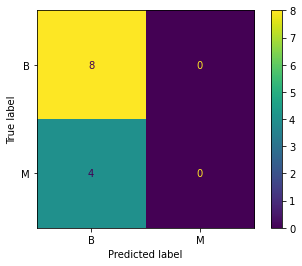

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.0012673620342166236
metric(s) 2: (00, 10, 11) = (0.50545004592331, 0.5022679369087885, 0.4965511038258337)
metric 3: 0.0


----> Kernel construction duration: 00:01:42


Combination 34/200
(Current range: 14/20)
			 reps : 3
			 paulis : ['ZY', 'XX']
			 entanglement : linear

Feature map:


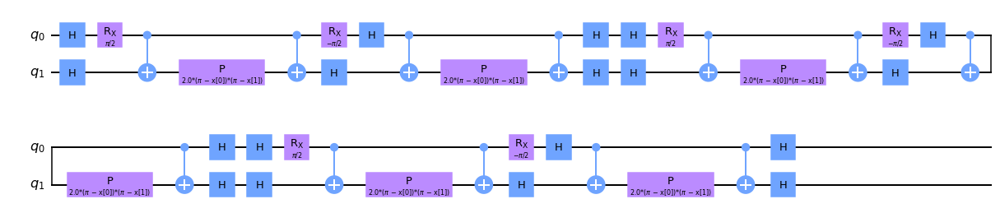


Quantum kernel matrices:



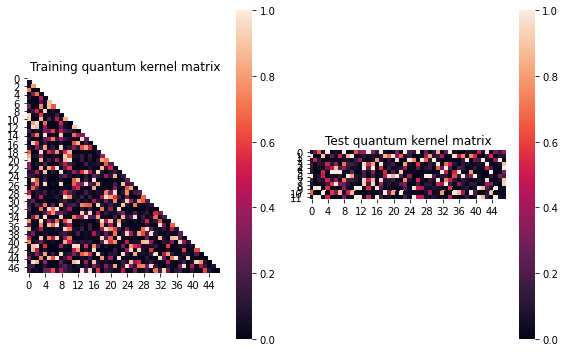


SVM with quantum kernel trained!


Test set performance:


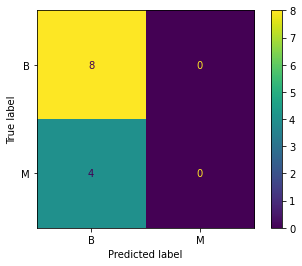

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01805160704765893
metric(s) 2: (00, 10, 11) = (0.26725128802061365, 0.24746678357459342, 0.263785493223891)
metric 3: 8.893388918773e-312


----> Kernel construction duration: 00:03:13


Combination 35/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['XX', 'ZY']
			 entanglement : linear

Feature map:


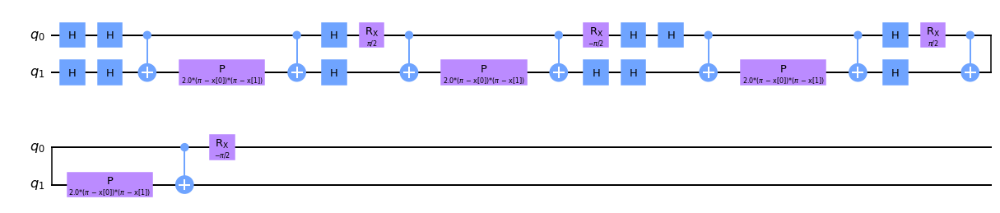


Quantum kernel matrices:



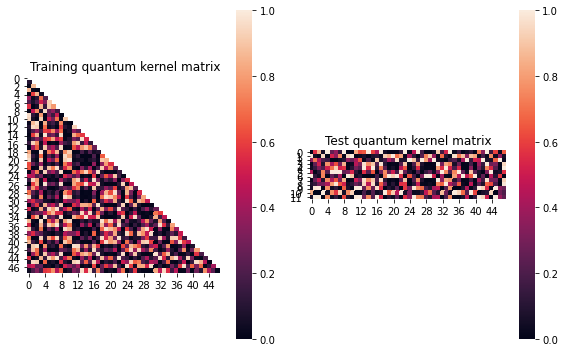


SVM with quantum kernel trained!


Test set performance:


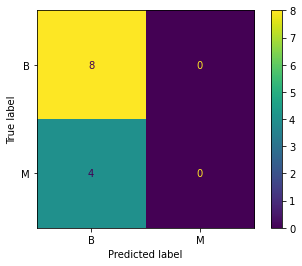

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013047293402184912
metric(s) 2: (00, 10, 11) = (0.3781336952705938, 0.36648333857335724, 0.3809275686804905)
metric 3: 0.0


----> Kernel construction duration: 00:01:53


Combination 36/200
(Current range: 16/20)
			 reps : 1
			 paulis : ['ZY', 'YZ']
			 entanglement : linear

Feature map:


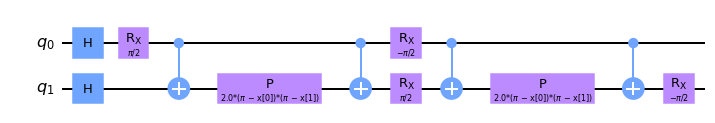


Quantum kernel matrices:



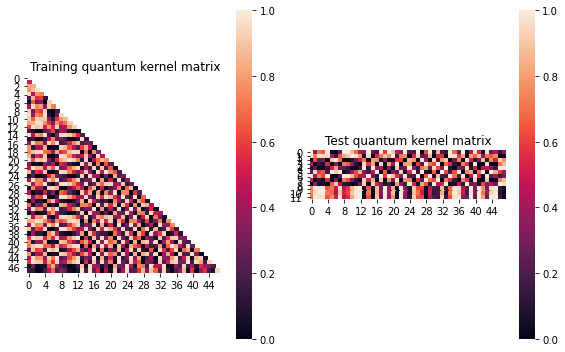


SVM with quantum kernel trained!


Test set performance:


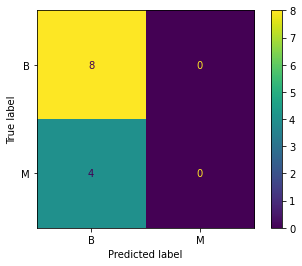

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:01:17


Combination 37/200
(Current range: 17/20)
			 reps : 1
			 paulis : ['YX', 'ZZ']
			 entanglement : linear

Feature map:


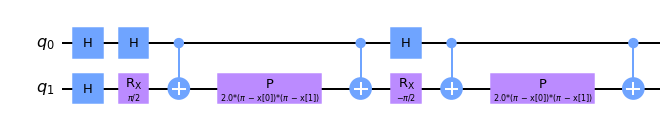


Quantum kernel matrices:



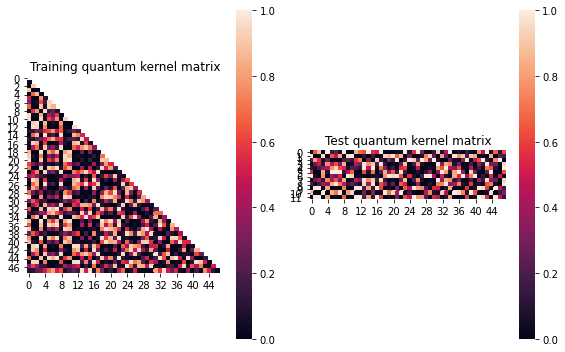


SVM with quantum kernel trained!


Test set performance:


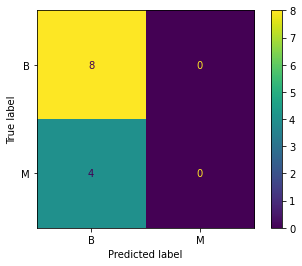

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 38/200
(Current range: 18/20)
			 reps : 1
			 paulis : ['YX', 'YY']
			 entanglement : linear

Feature map:


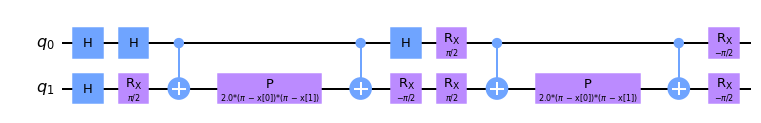


Quantum kernel matrices:



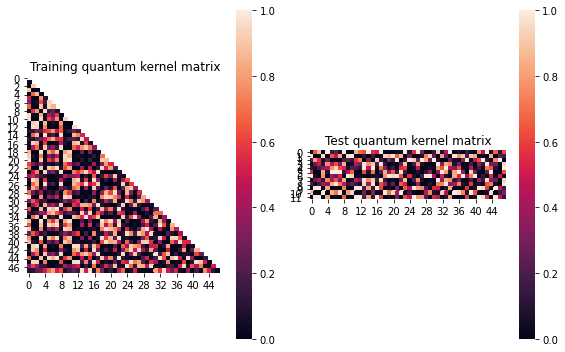


SVM with quantum kernel trained!


Test set performance:


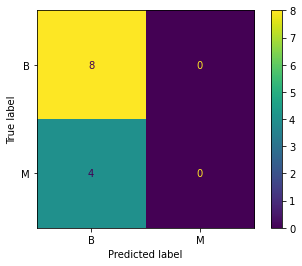

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:00:57


Combination 39/200
(Current range: 19/20)
			 reps : 1
			 paulis : ['ZY', 'ZY']
			 entanglement : linear

Feature map:


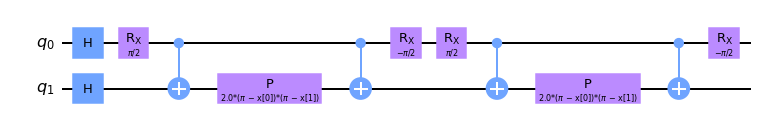


Quantum kernel matrices:



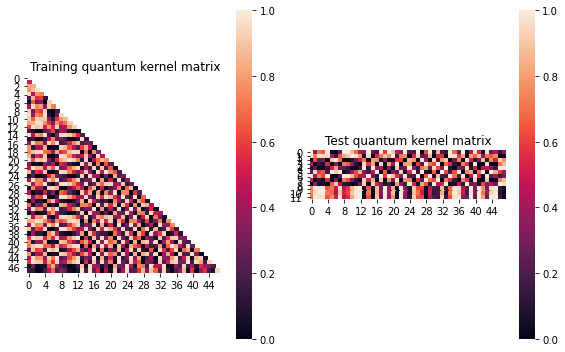


SVM with quantum kernel trained!


Test set performance:


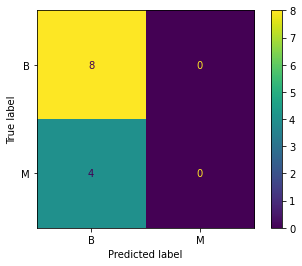

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:44


Combination 40/200
(Current range: 20/20)
			 reps : 1
			 paulis : ['YY', 'XX']
			 entanglement : linear

Feature map:


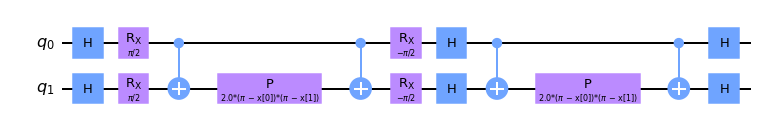


Quantum kernel matrices:



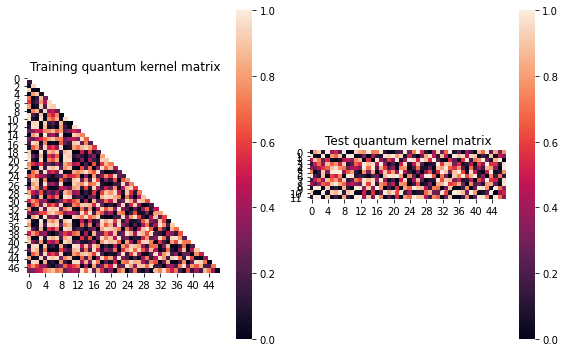


SVM with quantum kernel trained!


Test set performance:


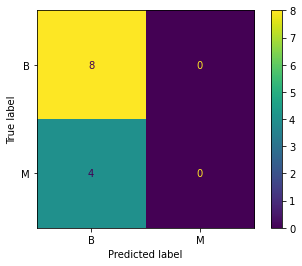

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:01:17


In [12]:
j=1
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 41/200
(Current range: 1/20)
			 reps : 2
			 paulis : ['ZX', 'YX']
			 entanglement : linear

Feature map:


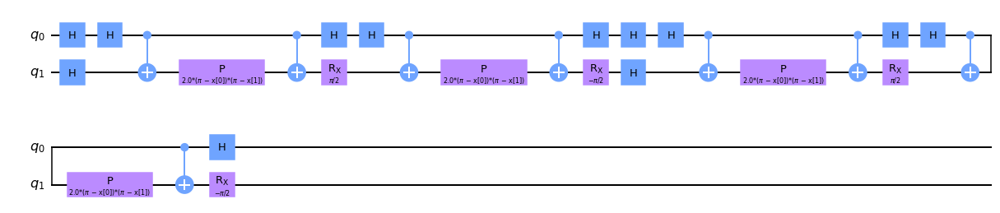


Quantum kernel matrices:



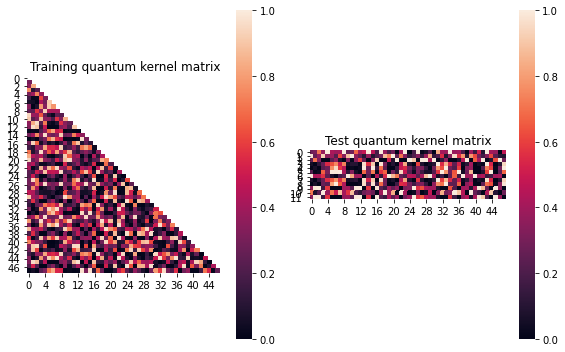


SVM with quantum kernel trained!


Test set performance:


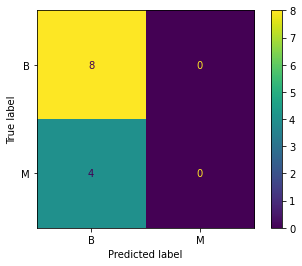

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.018779102683560367
metric(s) 2: (00, 10, 11) = (0.3850659486328937, 0.3623209501138952, 0.37713415696201746)
metric 3: 3.8494e-319


----> Kernel construction duration: 00:01:53


Combination 42/200
(Current range: 2/20)
			 reps : 3
			 paulis : ['XZ', 'XY']
			 entanglement : linear

Feature map:


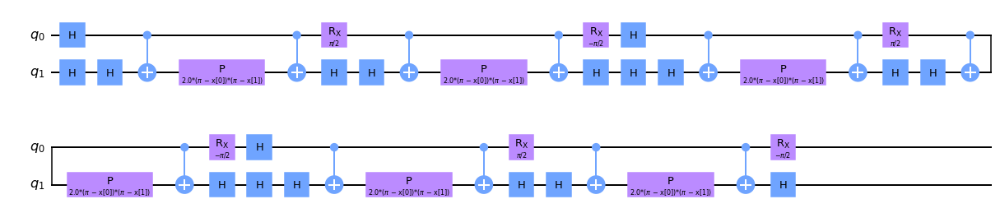


Quantum kernel matrices:



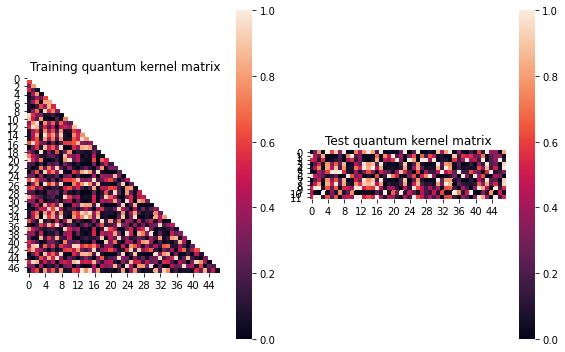


SVM with quantum kernel trained!


Test set performance:


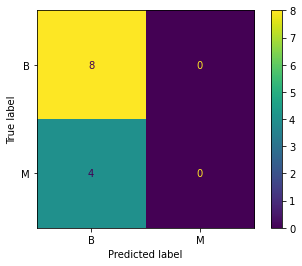

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.009893403016172087
metric(s) 2: (00, 10, 11) = (0.37308686220447335, 0.3514183610673001, 0.349536665962471)
metric 3: -5.218209140257698e-306


----> Kernel construction duration: 00:02:49


Combination 43/200
(Current range: 3/20)
			 reps : 3
			 paulis : ['XY', 'XY']
			 entanglement : linear

Feature map:


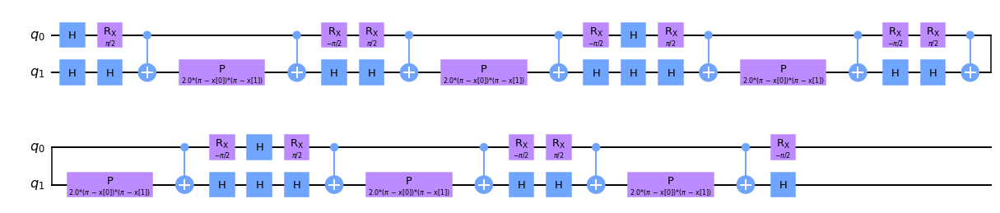


Quantum kernel matrices:



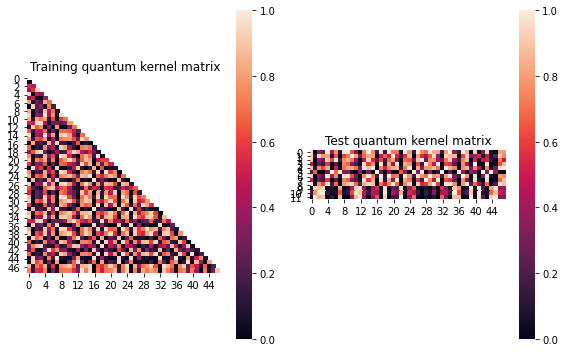


SVM with quantum kernel trained!


Test set performance:


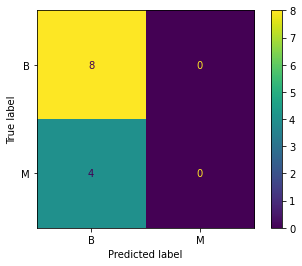

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.012190509825812046
metric(s) 2: (00, 10, 11) = (0.47733258533788553, 0.45971544426357136, 0.4664793228408812)
metric 3: -0.0


----> Kernel construction duration: 00:01:53


Combination 44/200
(Current range: 4/20)
			 reps : 1
			 paulis : ['Y', 'ZZ']
			 entanglement : linear

Feature map:


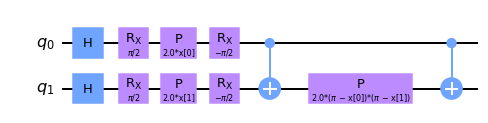


Quantum kernel matrices:



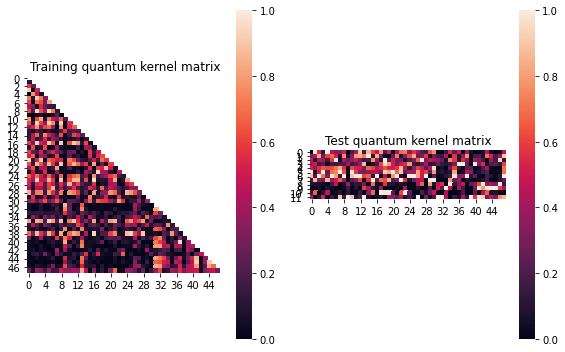


SVM with quantum kernel trained!


Test set performance:


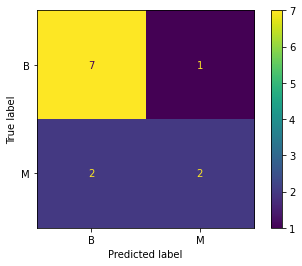

              precision    recall  f1-score   support

           B       0.78      0.88      0.82         8
           M       0.67      0.50      0.57         4

    accuracy                           0.75        12
   macro avg       0.72      0.69      0.70        12
weighted avg       0.74      0.75      0.74        12


metric 1: 0.13025630167870697
metric(s) 2: (00, 10, 11) = (0.37580278569064207, 0.19274200672795702, 0.27019383112268586)
metric 3: -6.531601427942518e-261


----> Kernel construction duration: 00:00:51


Combination 45/200
(Current range: 5/20)
			 reps : 3
			 paulis : ['ZZ', 'ZZ']
			 entanglement : linear

Feature map:


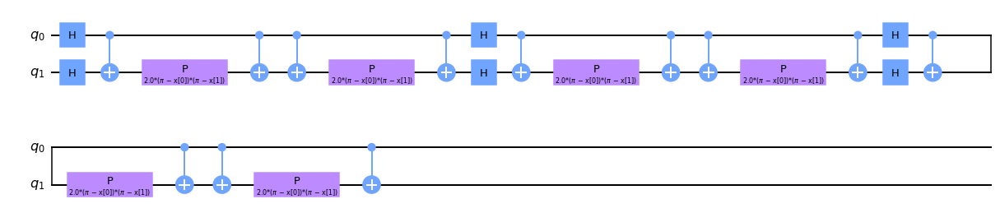


Quantum kernel matrices:



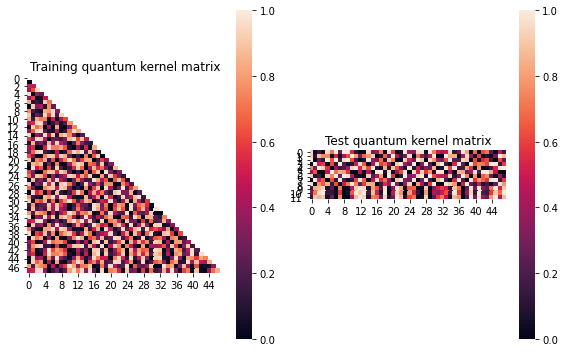


SVM with quantum kernel trained!


Test set performance:


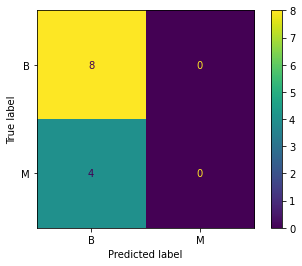

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.005512879146382266
metric(s) 2: (00, 10, 11) = (0.48625318910245735, 0.48222958362822826, 0.48923173644676365)
metric 3: 0.0


----> Kernel construction duration: 00:01:55


Combination 46/200
(Current range: 6/20)
			 reps : 2
			 paulis : ['XX', 'XX']
			 entanglement : linear

Feature map:


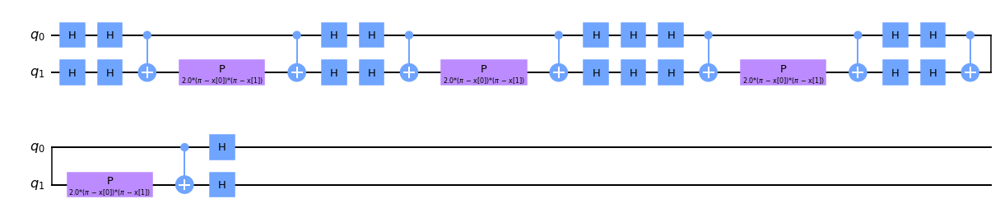


Quantum kernel matrices:



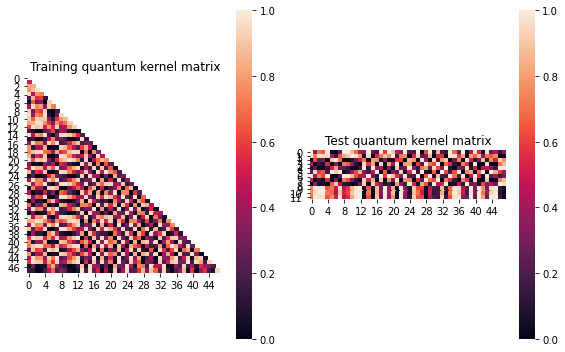


SVM with quantum kernel trained!


Test set performance:


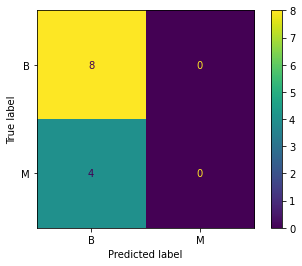

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:58


Combination 47/200
(Current range: 7/20)
			 reps : 3
			 paulis : ['Z', 'Y']
			 entanglement : linear

Feature map:


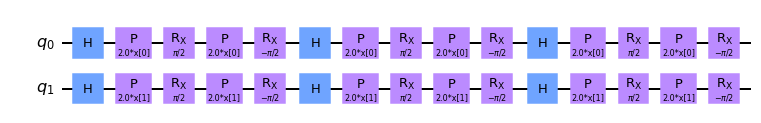


Quantum kernel matrices:



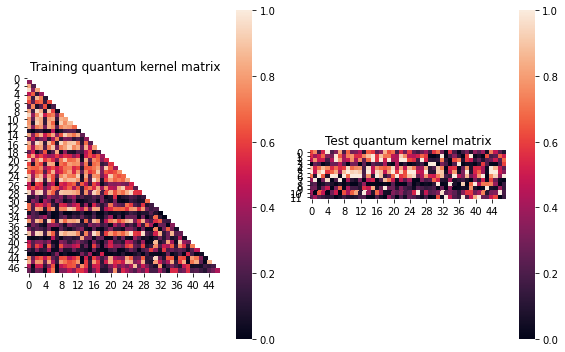


SVM with quantum kernel trained!


Test set performance:


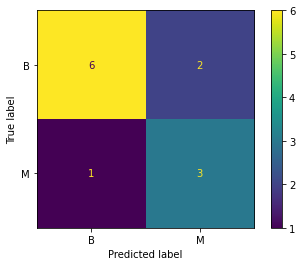

              precision    recall  f1-score   support

           B       0.86      0.75      0.80         8
           M       0.60      0.75      0.67         4

    accuracy                           0.75        12
   macro avg       0.73      0.75      0.73        12
weighted avg       0.77      0.75      0.76        12


metric 1: 0.12881304737349475
metric(s) 2: (00, 10, 11) = (0.5366533444493164, 0.3185561217665843, 0.35808499383084175)
metric 3: -8.949066331738585e-270


----> Kernel construction duration: 00:00:37


Combination 48/200
(Current range: 8/20)
			 reps : 2
			 paulis : ['ZX', 'Y']
			 entanglement : linear

Feature map:


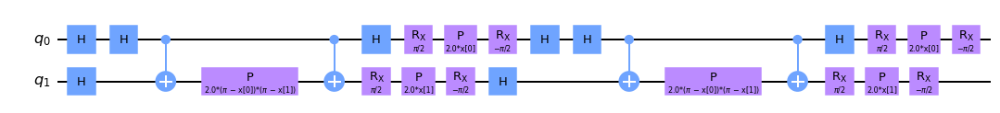


Quantum kernel matrices:



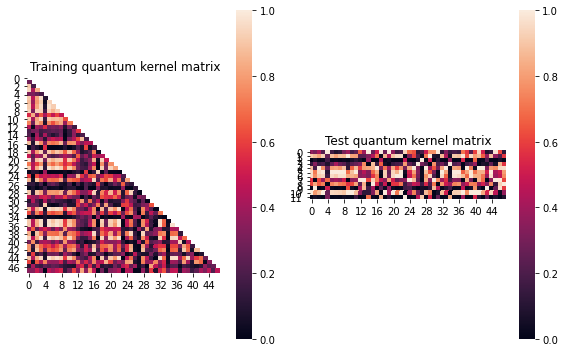


SVM with quantum kernel trained!


Test set performance:


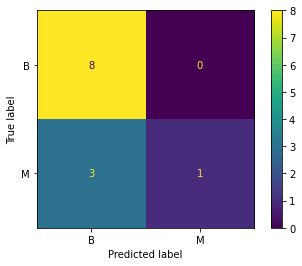

              precision    recall  f1-score   support

           B       0.73      1.00      0.84         8
           M       1.00      0.25      0.40         4

    accuracy                           0.75        12
   macro avg       0.86      0.62      0.62        12
weighted avg       0.82      0.75      0.69        12


metric 1: 0.008945385180034238
metric(s) 2: (00, 10, 11) = (0.4486189207614757, 0.419947638778612, 0.4091671271558169)
metric 3: 1.3892401881511965e-284


----> Kernel construction duration: 00:01:36


Combination 49/200
(Current range: 9/20)
			 reps : 1
			 paulis : ['YZ', 'YZ']
			 entanglement : linear

Feature map:


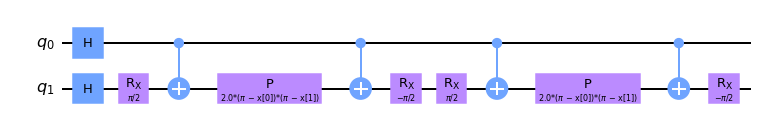


Quantum kernel matrices:



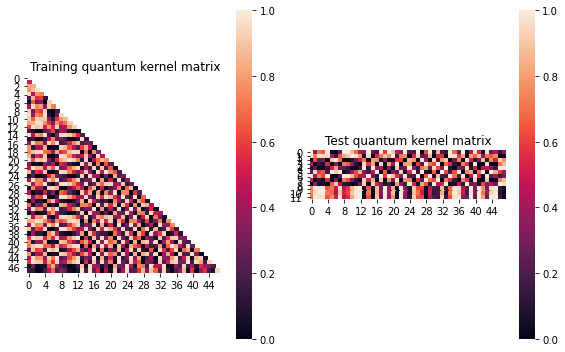


SVM with quantum kernel trained!


Test set performance:


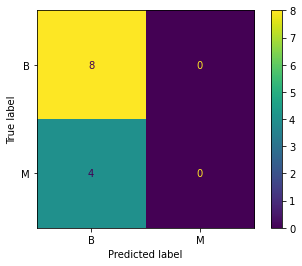

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:44


Combination 50/200
(Current range: 10/20)
			 reps : 1
			 paulis : ['XX', 'Y']
			 entanglement : linear

Feature map:


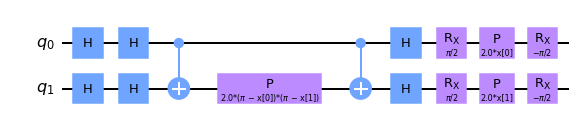


Quantum kernel matrices:



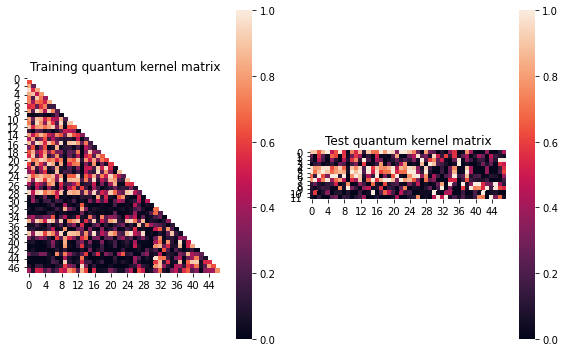


SVM with quantum kernel trained!


Test set performance:


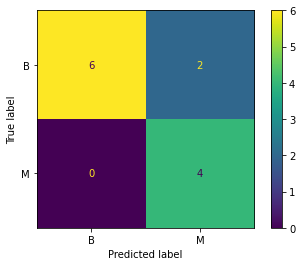

              precision    recall  f1-score   support

           B       1.00      0.75      0.86         8
           M       0.67      1.00      0.80         4

    accuracy                           0.83        12
   macro avg       0.83      0.88      0.83        12
weighted avg       0.89      0.83      0.84        12


metric 1: 0.1714135304144625
metric(s) 2: (00, 10, 11) = (0.46610972478155727, 0.20369470838303871, 0.2841067528134452)
metric 3: -3.309075821070186e-295


----> Kernel construction duration: 00:00:42


Combination 51/200
(Current range: 11/20)
			 reps : 2
			 paulis : ['ZY', 'Z']
			 entanglement : linear

Feature map:


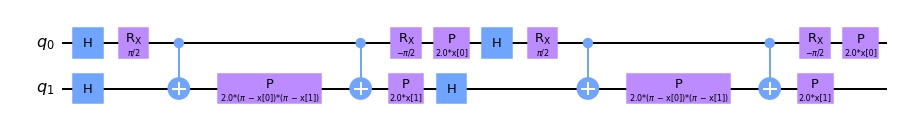


Quantum kernel matrices:



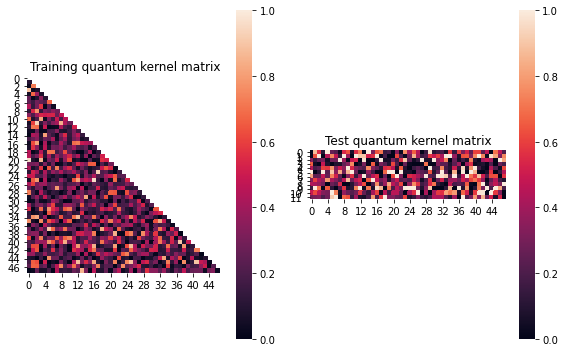


SVM with quantum kernel trained!


Test set performance:


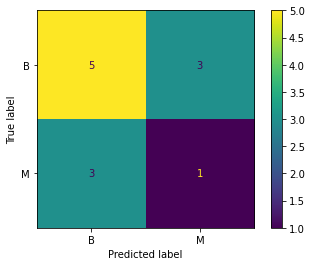

              precision    recall  f1-score   support

           B       0.62      0.62      0.62         8
           M       0.25      0.25      0.25         4

    accuracy                           0.50        12
   macro avg       0.44      0.44      0.44        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.0203492045236639
metric(s) 2: (00, 10, 11) = (0.306448230348064, 0.2823318818476739, 0.29891394239461155)
metric 3: -4.5143246728962605e-271


----> Kernel construction duration: 00:01:44


Combination 52/200
(Current range: 12/20)
			 reps : 3
			 paulis : ['ZY', 'YY']
			 entanglement : linear

Feature map:


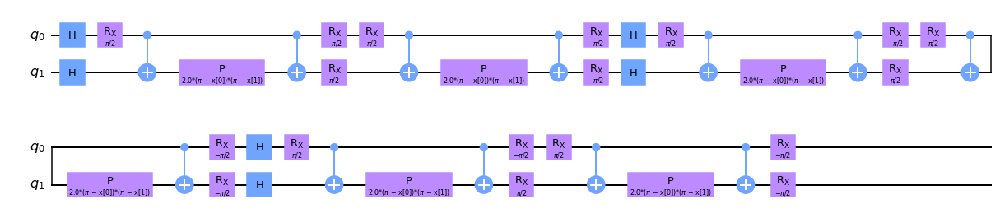


Quantum kernel matrices:



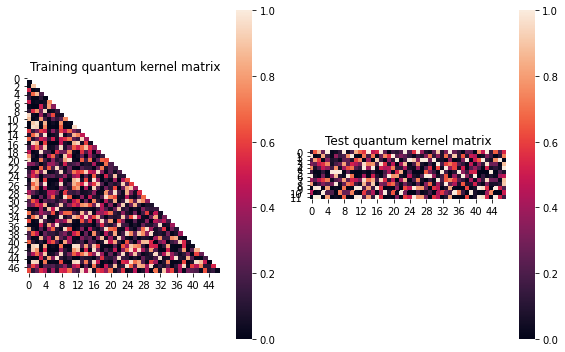


SVM with quantum kernel trained!


Test set performance:


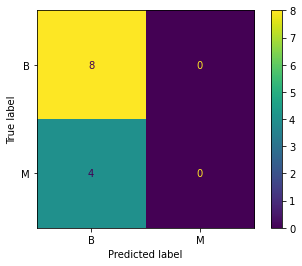

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01403791776747837
metric(s) 2: (00, 10, 11) = (0.350920814128598, 0.3327942061785643, 0.34274343376348737)
metric 3: 5.04115376233203e-310


----> Kernel construction duration: 00:03:09


Combination 53/200
(Current range: 13/20)
			 reps : 2
			 paulis : ['YY', 'Z']
			 entanglement : linear

Feature map:


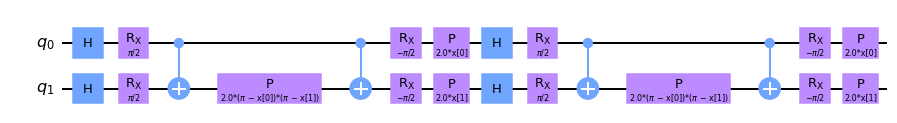


Quantum kernel matrices:



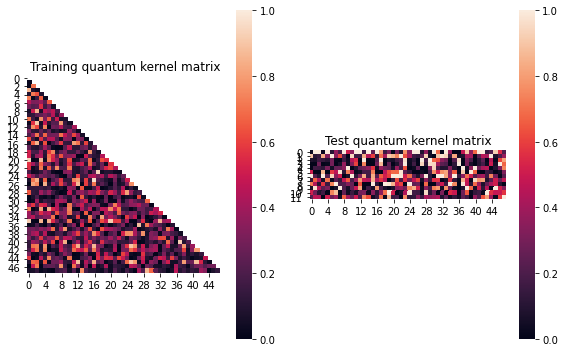


SVM with quantum kernel trained!


Test set performance:


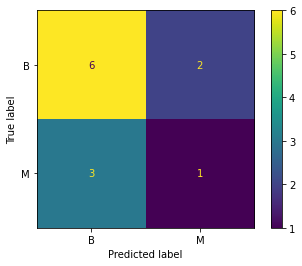

              precision    recall  f1-score   support

           B       0.67      0.75      0.71         8
           M       0.33      0.25      0.29         4

    accuracy                           0.58        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.56      0.58      0.57        12


metric 1: 0.010502156167782106
metric(s) 2: (00, 10, 11) = (0.30851845331734473, 0.2864278184149683, 0.2853414958481561)
metric 3: -1.851108293830998e-259


----> Kernel construction duration: 00:01:48


Combination 54/200
(Current range: 14/20)
			 reps : 3
			 paulis : ['Z', 'YX']
			 entanglement : linear

Feature map:


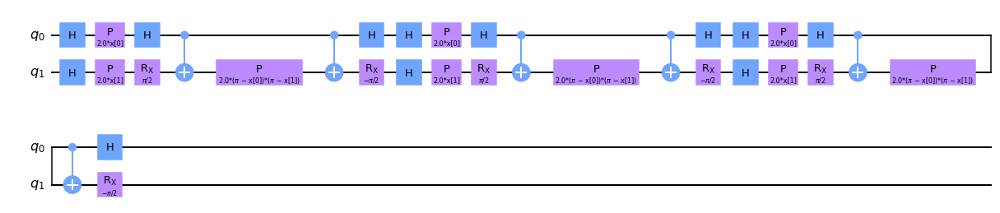


Quantum kernel matrices:



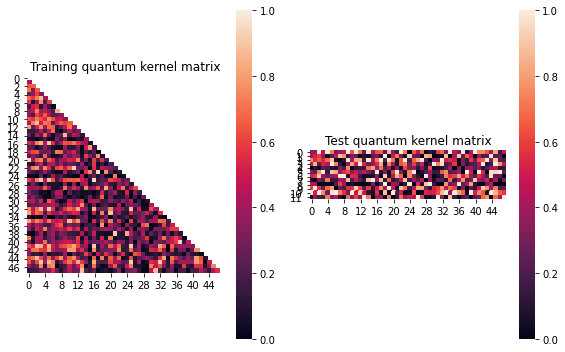


SVM with quantum kernel trained!


Test set performance:


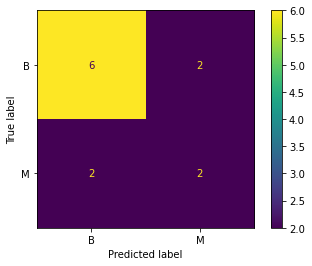

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.00244418737275931
metric(s) 2: (00, 10, 11) = (0.3540119612918383, 0.33598535132012497, 0.3228471160939302)
metric 3: 2.736132254245598e-257


----> Kernel construction duration: 00:02:15


Combination 55/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['Y', 'ZY']
			 entanglement : linear

Feature map:


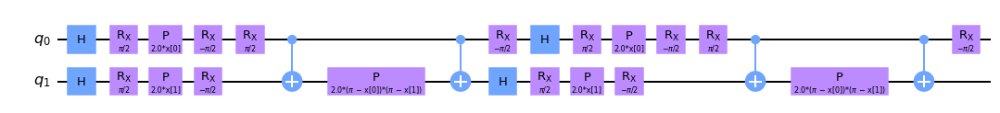


Quantum kernel matrices:



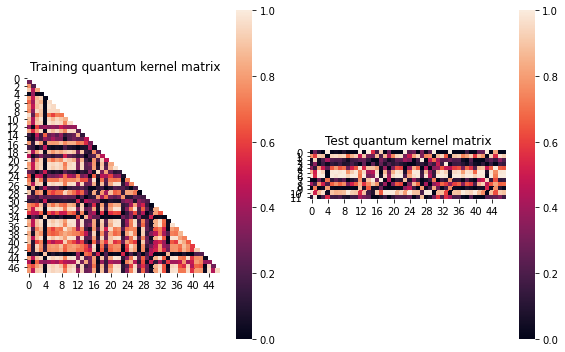


SVM with quantum kernel trained!


Test set performance:


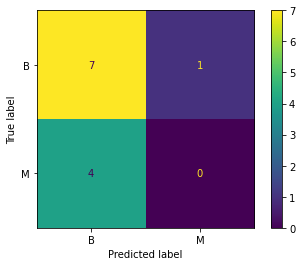

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: -0.0093548201329825
metric(s) 2: (00, 10, 11) = (0.5044980677482835, 0.5178256473058047, 0.512443586597361)
metric 3: 4.7522301893536445e-306


----> Kernel construction duration: 00:01:32


Combination 56/200
(Current range: 16/20)
			 reps : 3
			 paulis : ['YY', 'XZ']
			 entanglement : linear

Feature map:


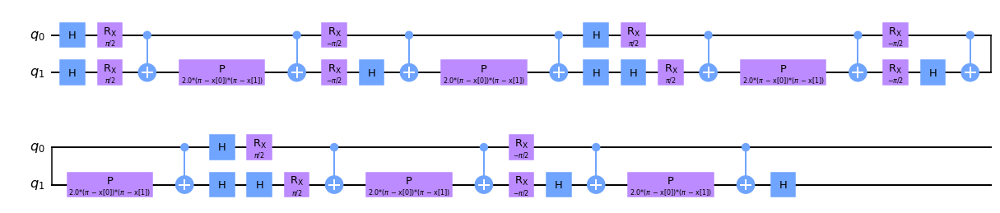


Quantum kernel matrices:



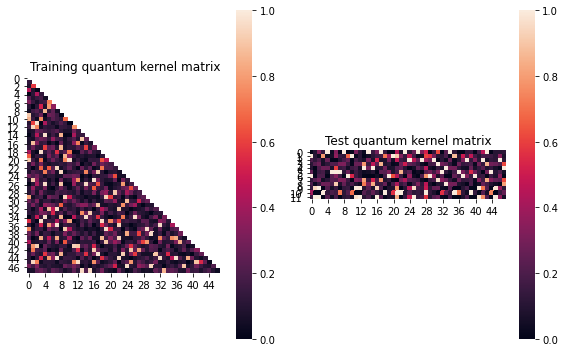


SVM with quantum kernel trained!


Test set performance:


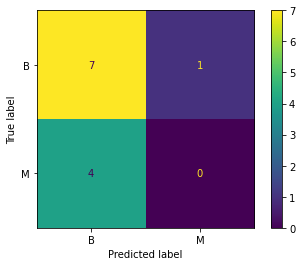

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: 0.018168849105064028
metric(s) 2: (00, 10, 11) = (0.25271593039365603, 0.23454273937169176, 0.2527072465598555)
metric 3: -3.18056863941782e-304


----> Kernel construction duration: 00:03:31


Combination 57/200
(Current range: 17/20)
			 reps : 2
			 paulis : ['YZ', 'XZ']
			 entanglement : linear

Feature map:


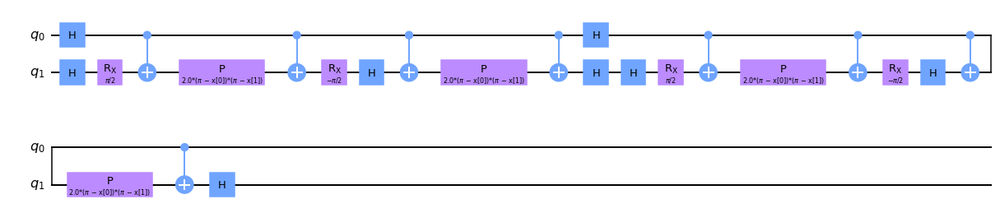


Quantum kernel matrices:



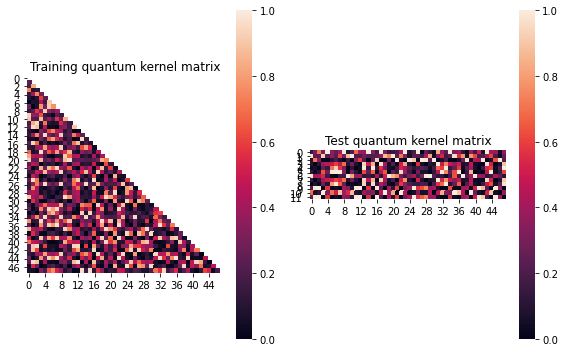


SVM with quantum kernel trained!


Test set performance:


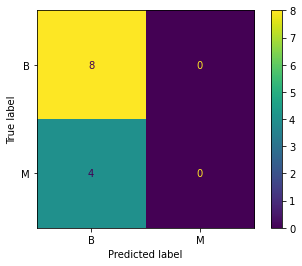

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.019041240739741006
metric(s) 2: (00, 10, 11) = (0.36846171243444553, 0.3454804277737181, 0.36058162459247267)
metric 3: 2.2e-322


----> Kernel construction duration: 00:02:03


Combination 58/200
(Current range: 18/20)
			 reps : 2
			 paulis : ['ZY', 'YY']
			 entanglement : linear

Feature map:


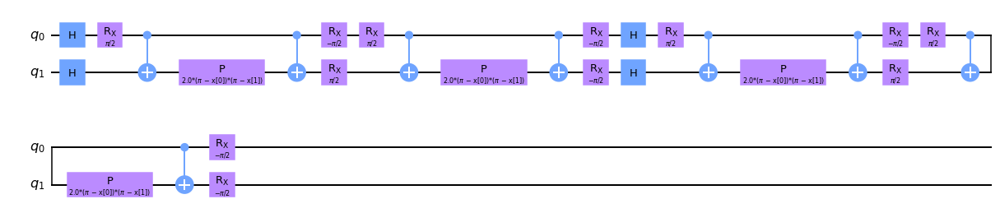


Quantum kernel matrices:



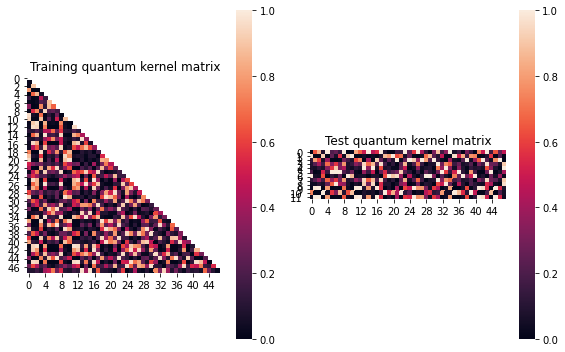


SVM with quantum kernel trained!


Test set performance:


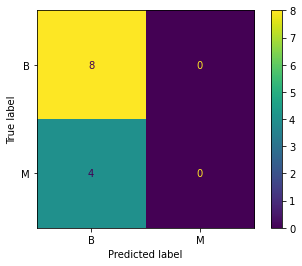

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01450140006324252
metric(s) 2: (00, 10, 11) = (0.35451120613984005, 0.3429587573030012, 0.3604091085926474)
metric 3: 0.0


----> Kernel construction duration: 00:02:09


Combination 59/200
(Current range: 19/20)
			 reps : 3
			 paulis : ['YY', 'XY']
			 entanglement : linear

Feature map:


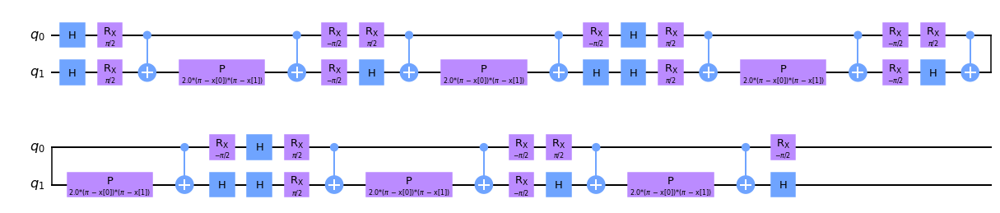


Quantum kernel matrices:



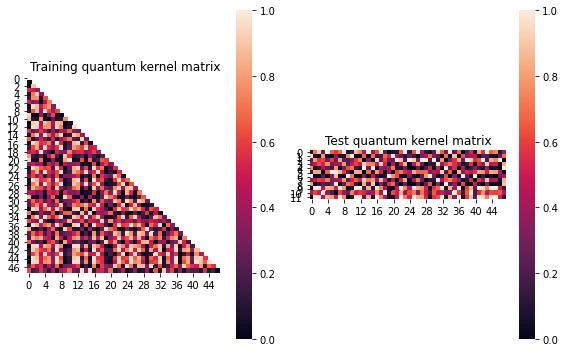


SVM with quantum kernel trained!


Test set performance:


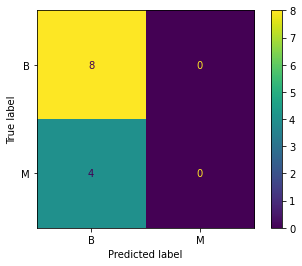

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.0011714709226569586
metric(s) 2: (00, 10, 11) = (0.4590229394173207, 0.4719663356895779, 0.4825667901165212)
metric 3: 1.26448e-318


----> Kernel construction duration: 00:03:07


Combination 60/200
(Current range: 20/20)
			 reps : 2
			 paulis : ['XZ', 'XZ']
			 entanglement : linear

Feature map:


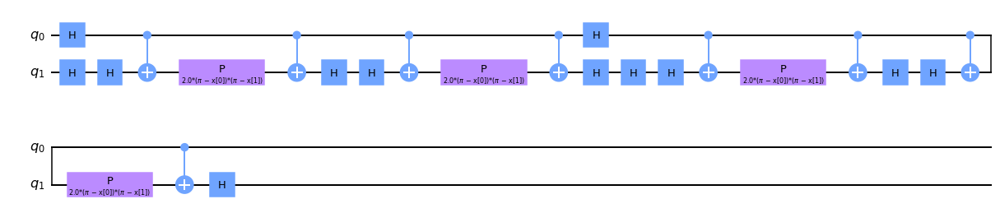


Quantum kernel matrices:



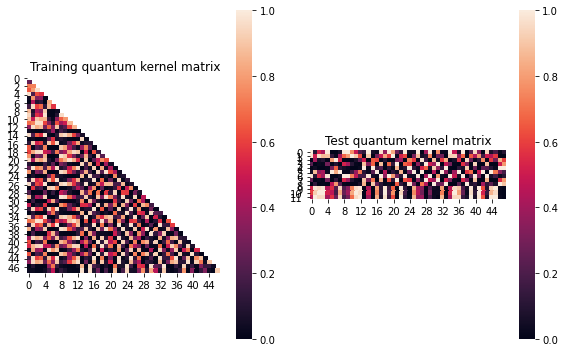


SVM with quantum kernel trained!


Test set performance:


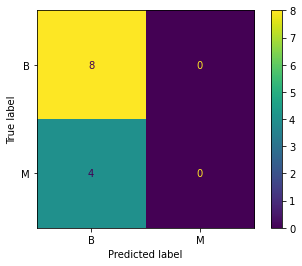

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.020892158097017832
metric(s) 2: (00, 10, 11) = (0.4112506262798868, 0.37125938362500255, 0.373052457164154)
metric 3: 0.0


----> Kernel construction duration: 00:01:10


In [13]:
j=2
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 61/200
(Current range: 1/20)
			 reps : 2
			 paulis : ['X', 'YX']
			 entanglement : linear

Feature map:


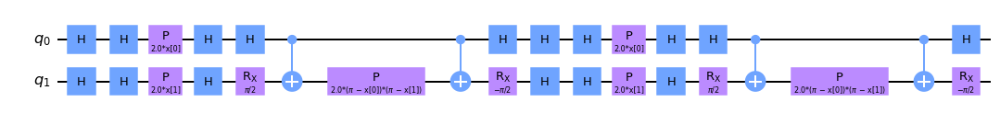


Quantum kernel matrices:



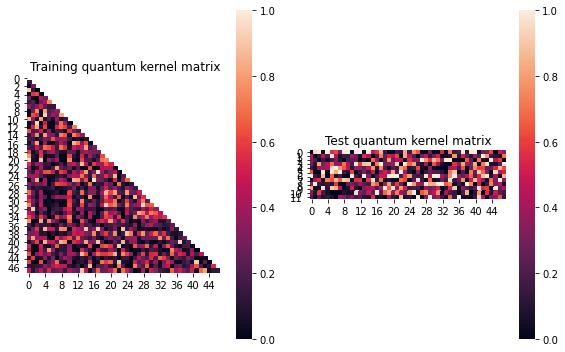


SVM with quantum kernel trained!


Test set performance:


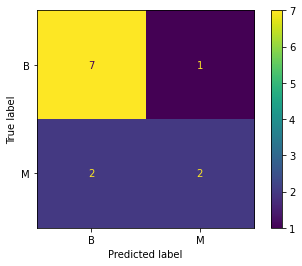

              precision    recall  f1-score   support

           B       0.78      0.88      0.82         8
           M       0.67      0.50      0.57         4

    accuracy                           0.75        12
   macro avg       0.72      0.69      0.70        12
weighted avg       0.74      0.75      0.74        12


metric 1: 0.037260062950064454
metric(s) 2: (00, 10, 11) = (0.32831073706146136, 0.29243162889928287, 0.33107264663723324)
metric 3: 1.0608108238493646e-272


----> Kernel construction duration: 00:01:26


Combination 62/200
(Current range: 2/20)
			 reps : 2
			 paulis : ['X', 'X']
			 entanglement : linear

Feature map:


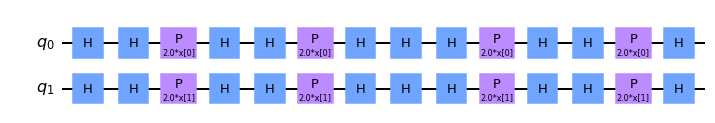


Quantum kernel matrices:



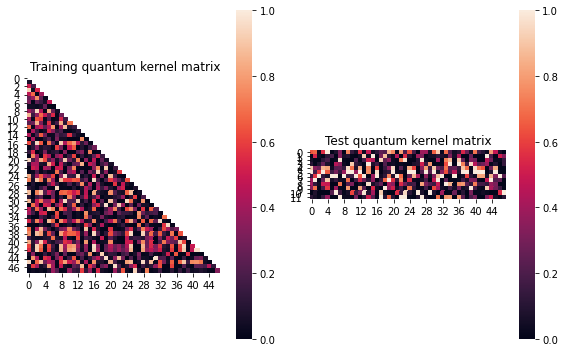


SVM with quantum kernel trained!


Test set performance:


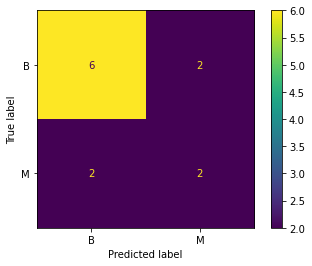

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.003060203370675918
metric(s) 2: (00, 10, 11) = (0.2952883440316702, 0.2861065836590393, 0.28304523002776016)
metric 3: -1.0421030137301359e-294


----> Kernel construction duration: 00:00:33


Combination 63/200
(Current range: 3/20)
			 reps : 1
			 paulis : ['XY', 'YZ']
			 entanglement : linear

Feature map:


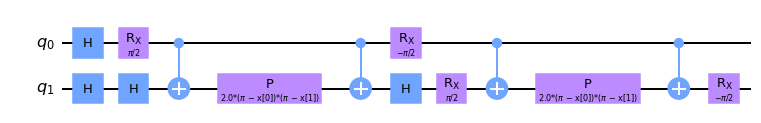


Quantum kernel matrices:



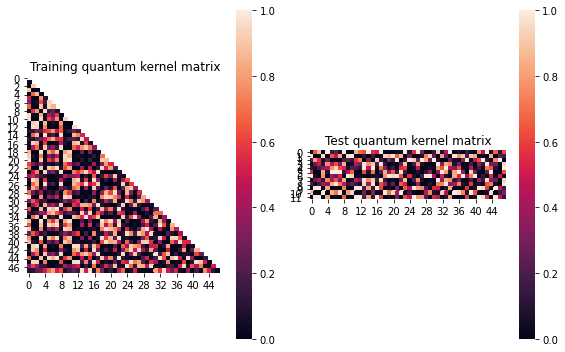


SVM with quantum kernel trained!


Test set performance:


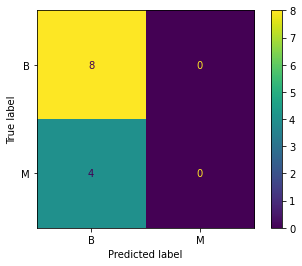

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:06


Combination 64/200
(Current range: 4/20)
			 reps : 1
			 paulis : ['Z', 'XX']
			 entanglement : linear

Feature map:


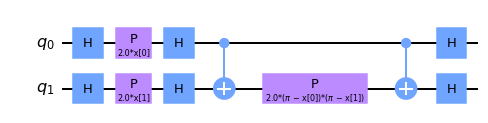


Quantum kernel matrices:



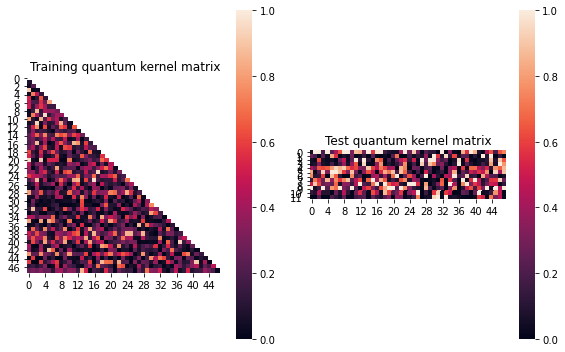


SVM with quantum kernel trained!


Test set performance:


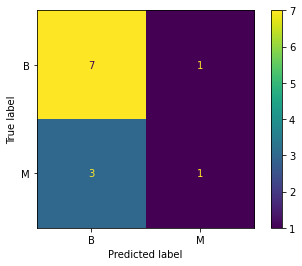

              precision    recall  f1-score   support

           B       0.70      0.88      0.78         8
           M       0.50      0.25      0.33         4

    accuracy                           0.67        12
   macro avg       0.60      0.56      0.56        12
weighted avg       0.63      0.67      0.63        12


metric 1: 0.04830562021551385
metric(s) 2: (00, 10, 11) = (0.31658911499868103, 0.24636061367914688, 0.27274335279064044)
metric 3: 8.349257415901081e-288


----> Kernel construction duration: 00:00:51


Combination 65/200
(Current range: 5/20)
			 reps : 2
			 paulis : ['Y', 'X']
			 entanglement : linear

Feature map:


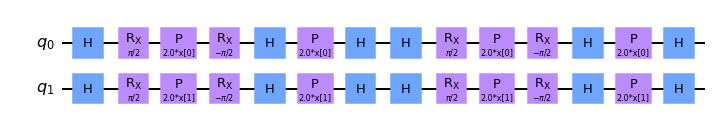


Quantum kernel matrices:



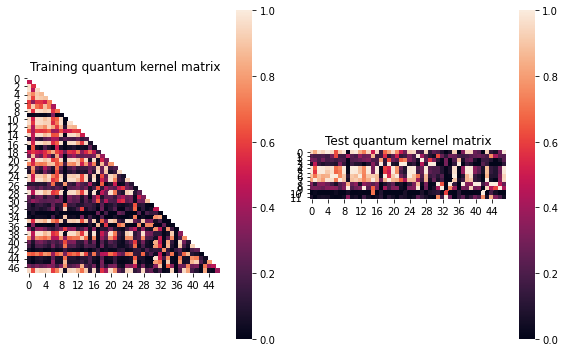


SVM with quantum kernel trained!


Test set performance:


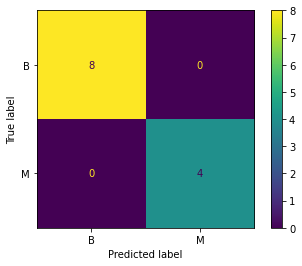

              precision    recall  f1-score   support

           B       1.00      1.00      1.00         8
           M       1.00      1.00      1.00         4

    accuracy                           1.00        12
   macro avg       1.00      1.00      1.00        12
weighted avg       1.00      1.00      1.00        12


metric 1: 0.12985888717149446
metric(s) 2: (00, 10, 11) = (0.5099186220763626, 0.2844480336327425, 0.31869521953211133)
metric 3: 9.535525876818557e-277


----> Kernel construction duration: 00:00:33


Combination 66/200
(Current range: 6/20)
			 reps : 1
			 paulis : ['Z', 'XZ']
			 entanglement : linear

Feature map:


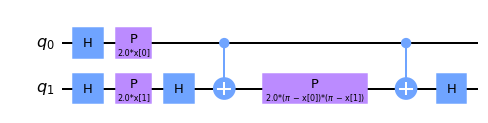


Quantum kernel matrices:



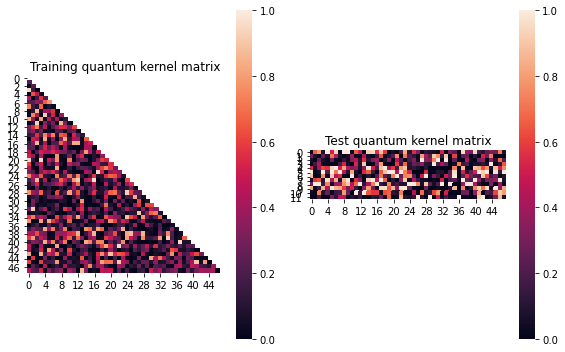


SVM with quantum kernel trained!


Test set performance:


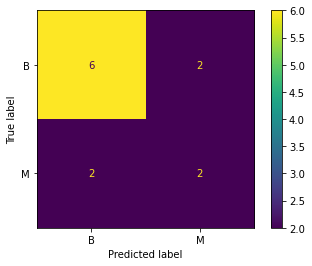

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.04652759004208121
metric(s) 2: (00, 10, 11) = (0.3109532021123373, 0.2493324516790366, 0.28076688132989824)
metric 3: 1.1941036603909666e-304


----> Kernel construction duration: 00:00:50


Combination 67/200
(Current range: 7/20)
			 reps : 3
			 paulis : ['YX', 'Z']
			 entanglement : linear

Feature map:


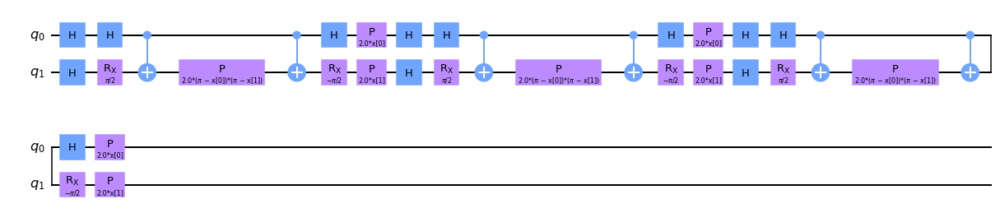


Quantum kernel matrices:



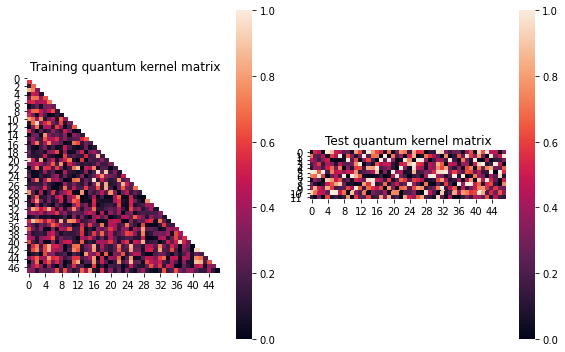


SVM with quantum kernel trained!


Test set performance:


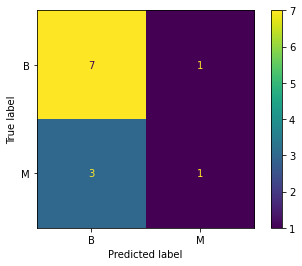

              precision    recall  f1-score   support

           B       0.70      0.88      0.78         8
           M       0.50      0.25      0.33         4

    accuracy                           0.67        12
   macro avg       0.60      0.56      0.56        12
weighted avg       0.63      0.67      0.63        12


metric 1: 0.015347055384289654
metric(s) 2: (00, 10, 11) = (0.32013641998728504, 0.30081541745320206, 0.3121885256876984)
metric 3: -2.8176525358815165e-268


----> Kernel construction duration: 00:02:15


Combination 68/200
(Current range: 8/20)
			 reps : 1
			 paulis : ['XY', 'ZY']
			 entanglement : linear

Feature map:


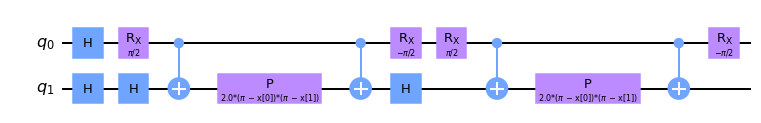


Quantum kernel matrices:



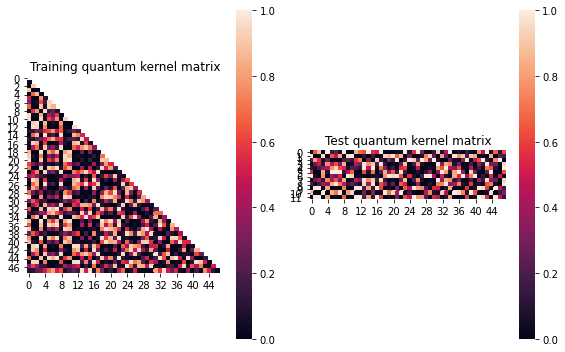


SVM with quantum kernel trained!


Test set performance:


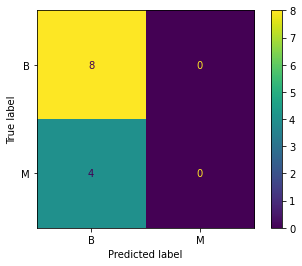

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:00:56


Combination 69/200
(Current range: 9/20)
			 reps : 2
			 paulis : ['YY', 'YZ']
			 entanglement : linear

Feature map:


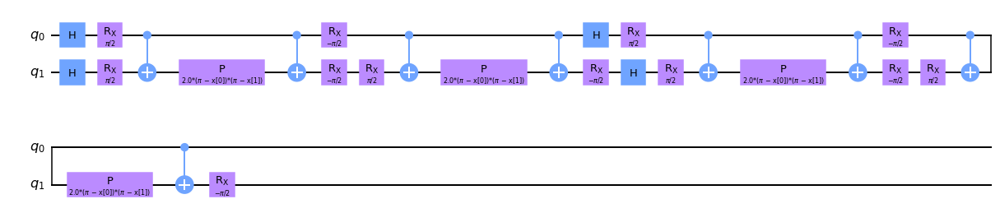


Quantum kernel matrices:



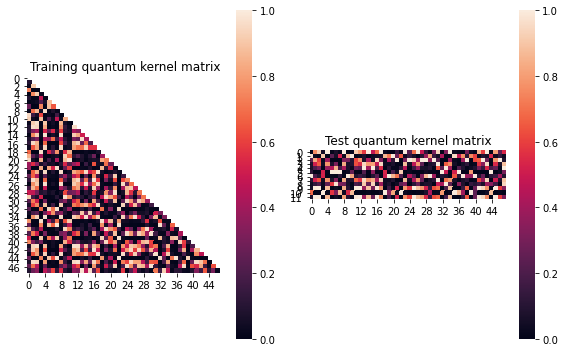


SVM with quantum kernel trained!


Test set performance:


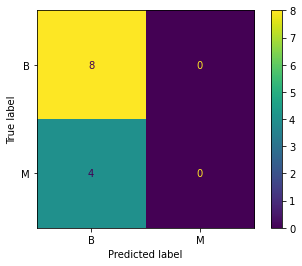

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.014902804835538075
metric(s) 2: (00, 10, 11) = (0.35700569208386645, 0.33918414436027217, 0.351168206307754)
metric 3: 0.0


----> Kernel construction duration: 00:02:10


Combination 70/200
(Current range: 10/20)
			 reps : 2
			 paulis : ['ZX']
			 entanglement : linear

Feature map:


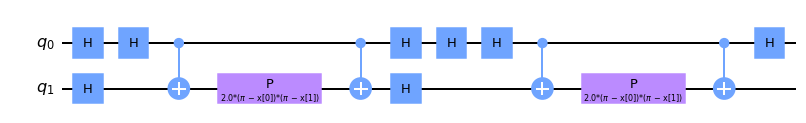


Quantum kernel matrices:



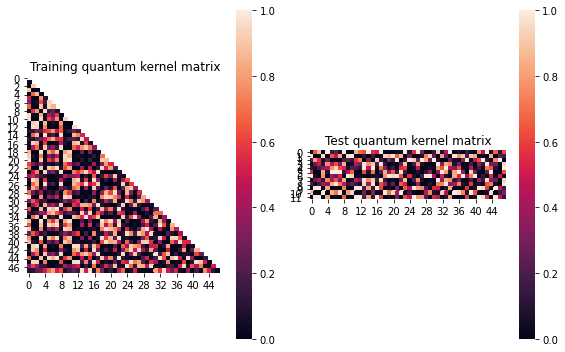


SVM with quantum kernel trained!


Test set performance:


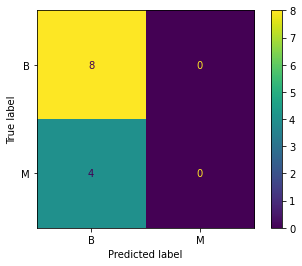

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:09


Combination 71/200
(Current range: 11/20)
			 reps : 3
			 paulis : ['ZX', 'X']
			 entanglement : linear

Feature map:


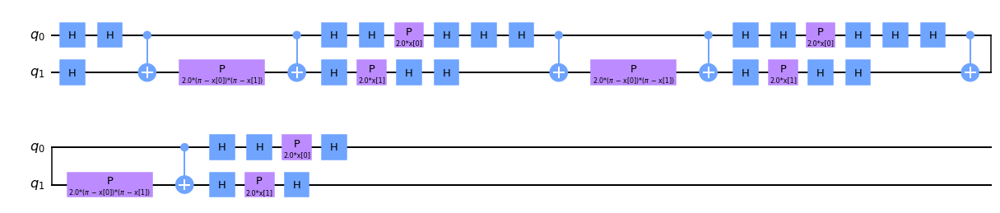


Quantum kernel matrices:



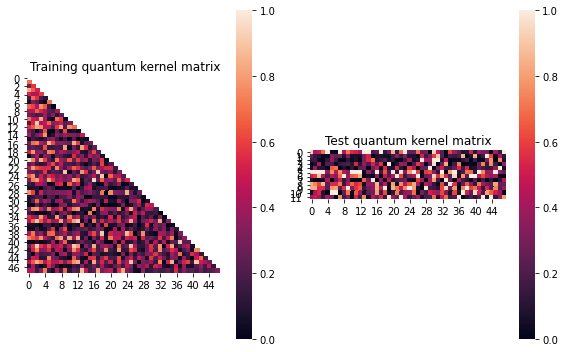


SVM with quantum kernel trained!


Test set performance:


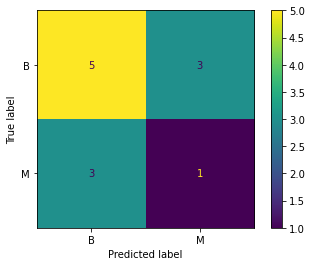

              precision    recall  f1-score   support

           B       0.62      0.62      0.62         8
           M       0.25      0.25      0.25         4

    accuracy                           0.50        12
   macro avg       0.44      0.44      0.44        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.02650313205975341
metric(s) 2: (00, 10, 11) = (0.3512967796634899, 0.3036096626507856, 0.3089288097575881)
metric 3: 3.958614608767141e-256


----> Kernel construction duration: 00:02:07


Combination 72/200
(Current range: 12/20)
			 reps : 2
			 paulis : ['YY']
			 entanglement : linear

Feature map:


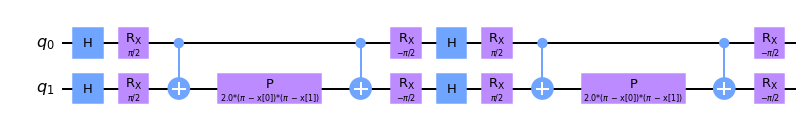


Quantum kernel matrices:



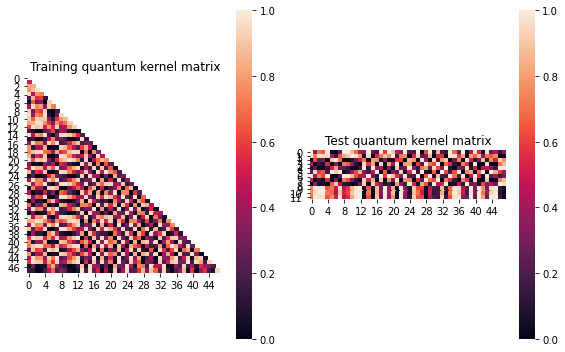


SVM with quantum kernel trained!


Test set performance:


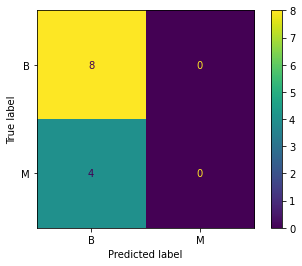

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:01:26


Combination 73/200
(Current range: 13/20)
			 reps : 1
			 paulis : ['XY', 'YY']
			 entanglement : linear

Feature map:


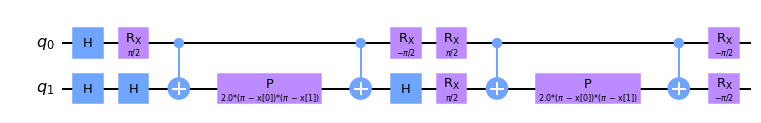


Quantum kernel matrices:



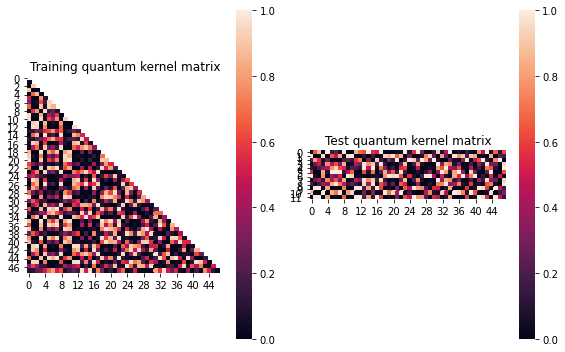


SVM with quantum kernel trained!


Test set performance:


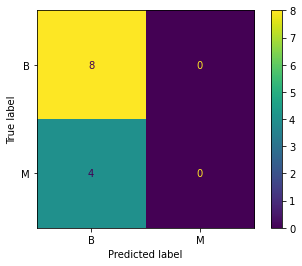

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:00:56


Combination 74/200
(Current range: 14/20)
			 reps : 2
			 paulis : ['YZ', 'Y']
			 entanglement : linear

Feature map:


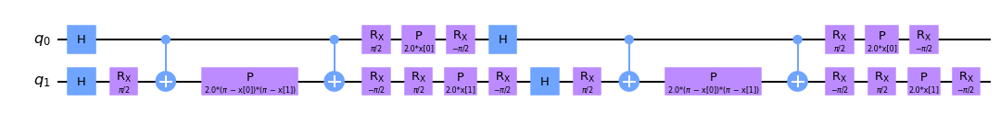


Quantum kernel matrices:



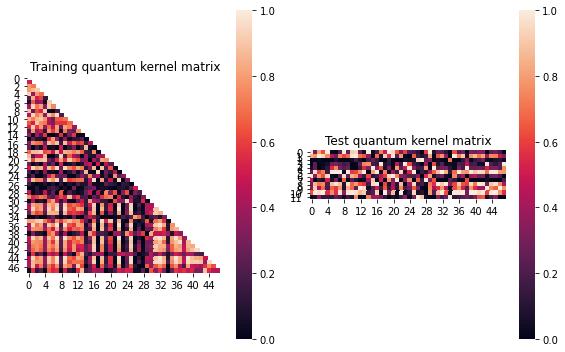


SVM with quantum kernel trained!


Test set performance:


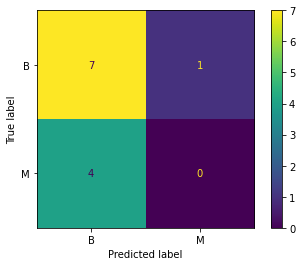

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: -0.012094267347856957
metric(s) 2: (00, 10, 11) = (0.40790929309218094, 0.43151709232838603, 0.43093635686887727)
metric 3: -2.477906337458701e-305


----> Kernel construction duration: 00:01:46


Combination 75/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['Y', 'YX']
			 entanglement : linear

Feature map:


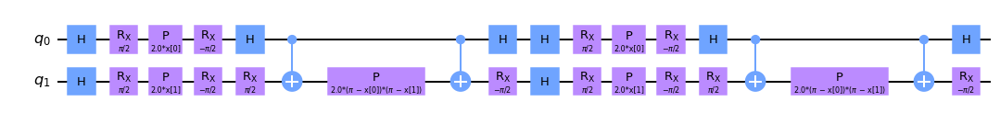


Quantum kernel matrices:



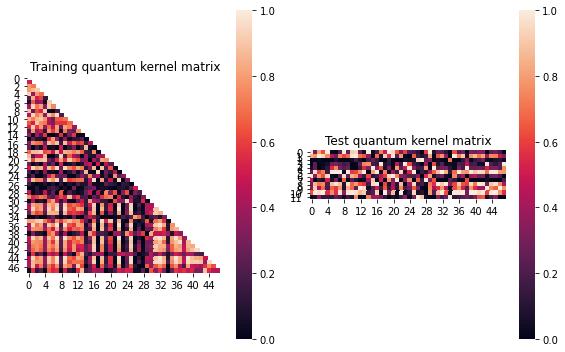


SVM with quantum kernel trained!


Test set performance:


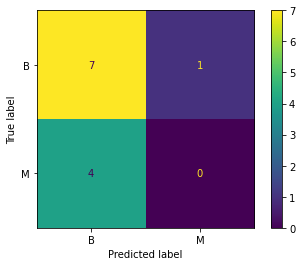

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: -0.012094267347856957
metric(s) 2: (00, 10, 11) = (0.40790929309218094, 0.43151709232838603, 0.43093635686887727)
metric 3: -2.477906337458701e-305


----> Kernel construction duration: 00:01:32


Combination 76/200
(Current range: 16/20)
			 reps : 2
			 paulis : ['XY', 'XZ']
			 entanglement : linear

Feature map:


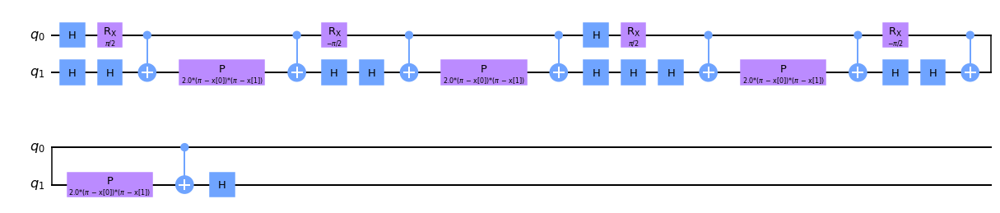


Quantum kernel matrices:



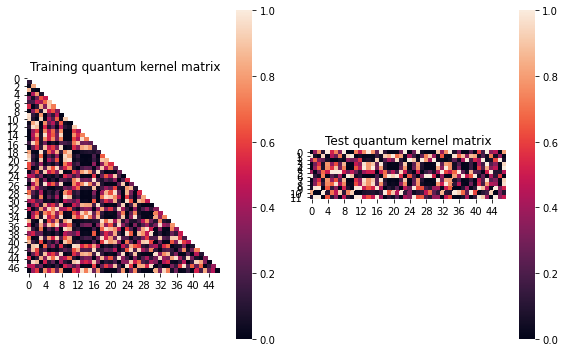


SVM with quantum kernel trained!


Test set performance:


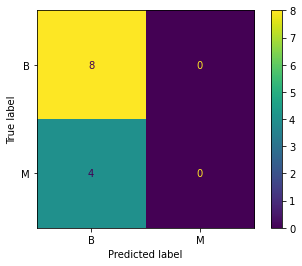

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.010663587146037268
metric(s) 2: (00, 10, 11) = (0.383585223374501, 0.372818870338711, 0.38337969159499546)
metric 3: -3.844e-321


----> Kernel construction duration: 00:01:52


Combination 77/200
(Current range: 17/20)
			 reps : 3
			 paulis : ['XX', 'ZZ']
			 entanglement : linear

Feature map:


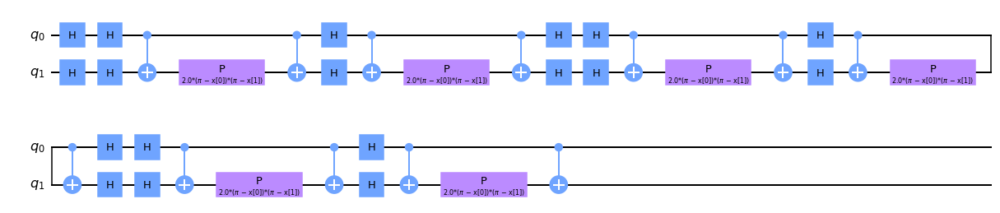


Quantum kernel matrices:



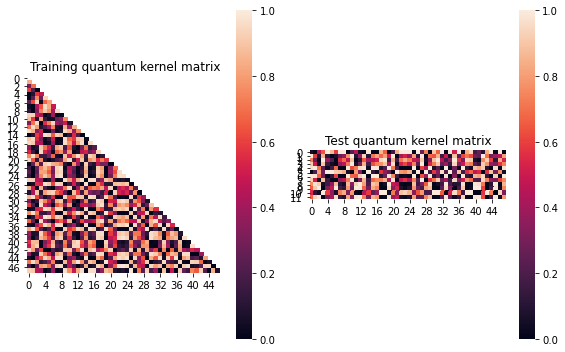


SVM with quantum kernel trained!


Test set performance:


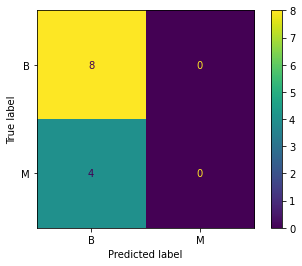

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.009612307123803732
metric(s) 2: (00, 10, 11) = (0.48535022329333716, 0.4836560259838247, 0.5011864429219197)
metric 3: -0.0


----> Kernel construction duration: 00:02:07


Combination 78/200
(Current range: 18/20)
			 reps : 1
			 paulis : ['YX', 'YX']
			 entanglement : linear

Feature map:


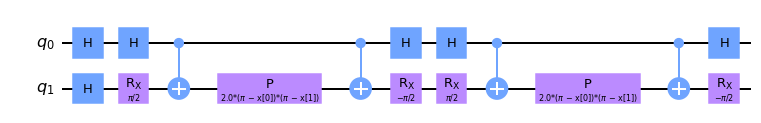


Quantum kernel matrices:



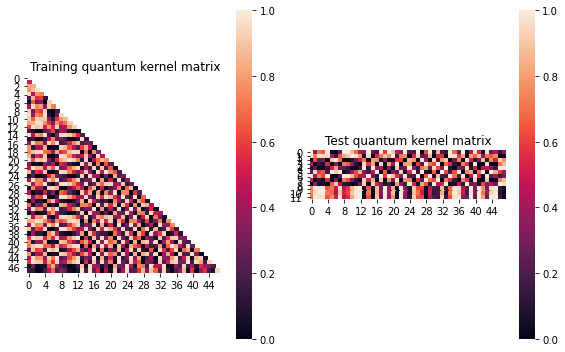


SVM with quantum kernel trained!


Test set performance:


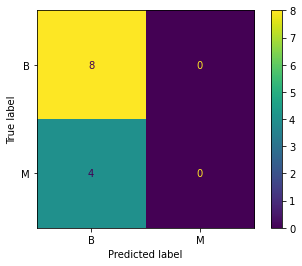

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:33


Combination 79/200
(Current range: 19/20)
			 reps : 1
			 paulis : ['XZ', 'ZX']
			 entanglement : linear

Feature map:


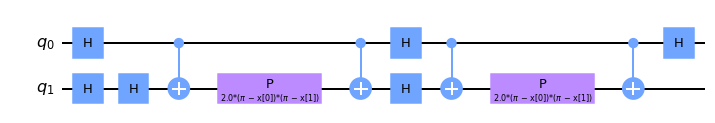


Quantum kernel matrices:



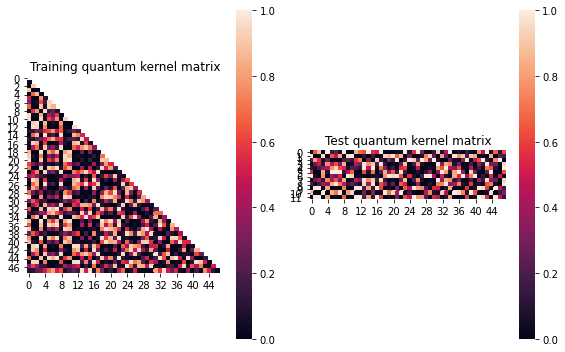


SVM with quantum kernel trained!


Test set performance:


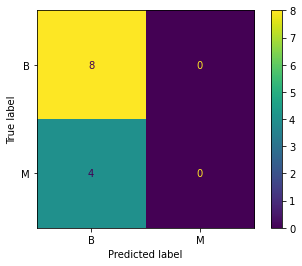

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 80/200
(Current range: 20/20)
			 reps : 3
			 paulis : ['Z', 'Z']
			 entanglement : linear

Feature map:


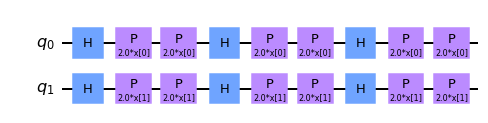


Quantum kernel matrices:



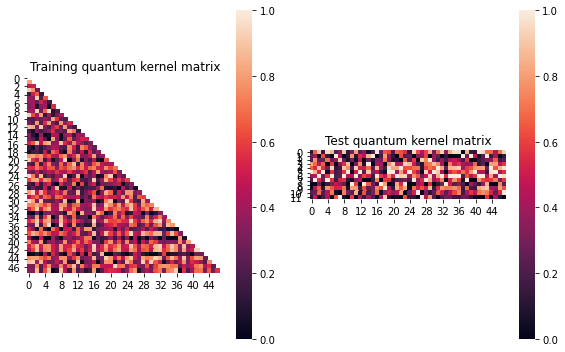


SVM with quantum kernel trained!


Test set performance:


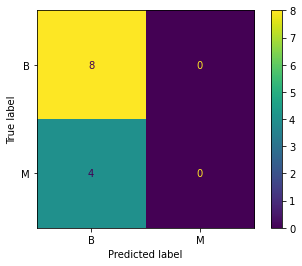

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.0024700871744078867
metric(s) 2: (00, 10, 11) = (0.4498959079485605, 0.4755925805705612, 0.49634907884374607)
metric 3: 6.512783161437938e-297


----> Kernel construction duration: 00:00:35


In [14]:
j=3
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 81/200
(Current range: 1/20)
			 reps : 1
			 paulis : ['XZ', 'XY']
			 entanglement : linear

Feature map:


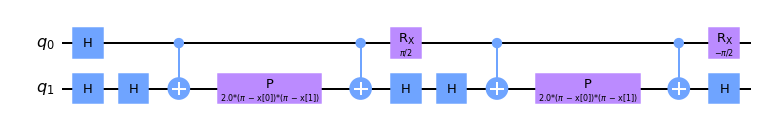


Quantum kernel matrices:



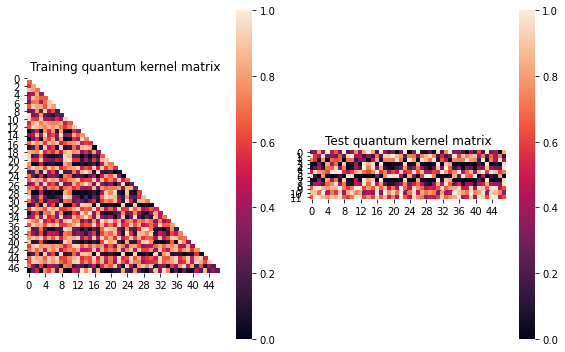


SVM with quantum kernel trained!


Test set performance:


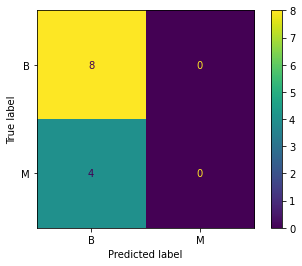

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.001725376281668356
metric(s) 2: (00, 10, 11) = (0.55769599865227, 0.5534831386964368, 0.545819526177267)
metric 3: 0.0


----> Kernel construction duration: 00:00:55


Combination 82/200
(Current range: 2/20)
			 reps : 1
			 paulis : ['ZY', 'Y']
			 entanglement : linear

Feature map:


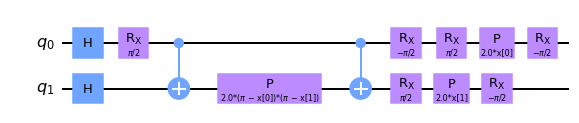


Quantum kernel matrices:



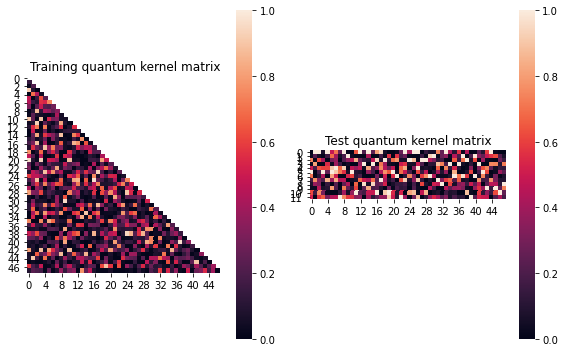


SVM with quantum kernel trained!


Test set performance:


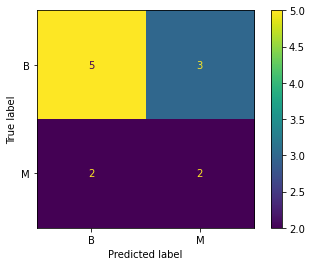

              precision    recall  f1-score   support

           B       0.71      0.62      0.67         8
           M       0.40      0.50      0.44         4

    accuracy                           0.58        12
   macro avg       0.56      0.56      0.56        12
weighted avg       0.61      0.58      0.59        12


metric 1: 0.05195175218529163
metric(s) 2: (00, 10, 11) = (0.2944161786010548, 0.22391522316224194, 0.2573177720940123)
metric 3: -6.736139999785563e-305


----> Kernel construction duration: 00:01:04


Combination 83/200
(Current range: 3/20)
			 reps : 2
			 paulis : ['XZ', 'Y']
			 entanglement : linear

Feature map:


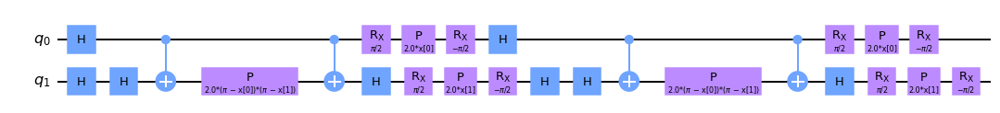


Quantum kernel matrices:



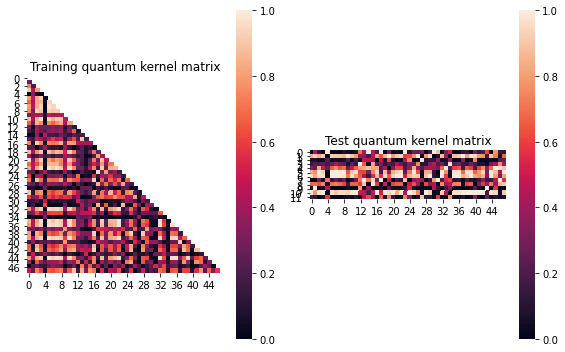


SVM with quantum kernel trained!


Test set performance:


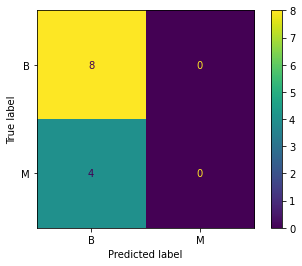

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02345845174428296
metric(s) 2: (00, 10, 11) = (0.4384771333289334, 0.3951513163896577, 0.39874240293894797)
metric 3: -5.410734351511118e-257


----> Kernel construction duration: 00:01:37


Combination 84/200
(Current range: 4/20)
			 reps : 1
			 paulis : ['X', 'Y']
			 entanglement : linear

Feature map:


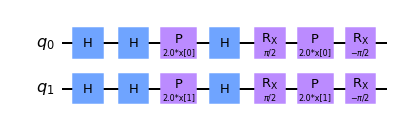


Quantum kernel matrices:



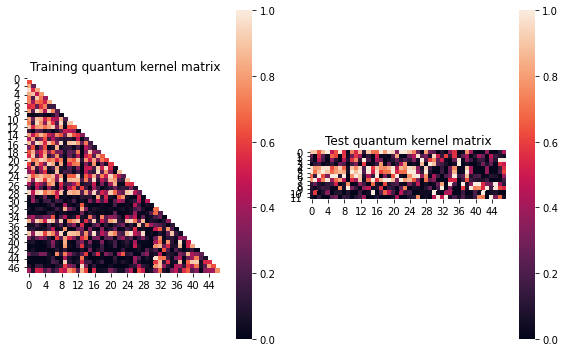


SVM with quantum kernel trained!


Test set performance:


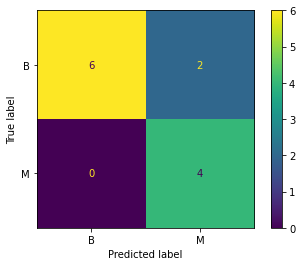

              precision    recall  f1-score   support

           B       1.00      0.75      0.86         8
           M       0.67      1.00      0.80         4

    accuracy                           0.83        12
   macro avg       0.83      0.88      0.83        12
weighted avg       0.89      0.83      0.84        12


metric 1: 0.1714135304144625
metric(s) 2: (00, 10, 11) = (0.46610972478155727, 0.20369470838303871, 0.2841067528134452)
metric 3: -3.309075821070186e-295


----> Kernel construction duration: 00:00:30


Combination 85/200
(Current range: 5/20)
			 reps : 1
			 paulis : ['YX', 'X']
			 entanglement : linear

Feature map:


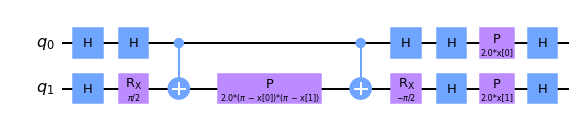


Quantum kernel matrices:



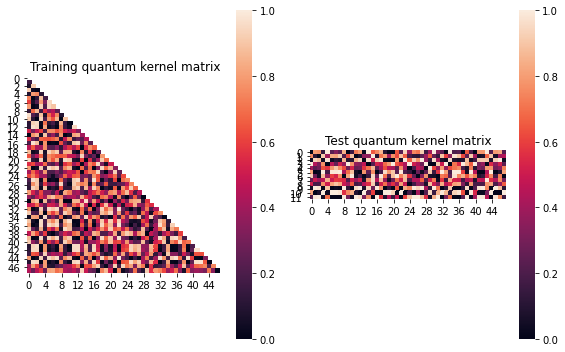


SVM with quantum kernel trained!


Test set performance:


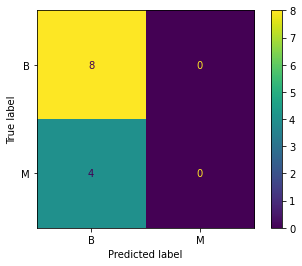

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.0031244618739401098
metric(s) 2: (00, 10, 11) = (0.47875951745279194, 0.4779284132335192, 0.48334623276212674)
metric 3: -0.0


----> Kernel construction duration: 00:00:52


Combination 86/200
(Current range: 6/20)
			 reps : 3
			 paulis : ['Z']
			 entanglement : linear

Feature map:


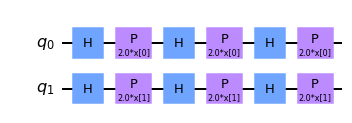


Quantum kernel matrices:



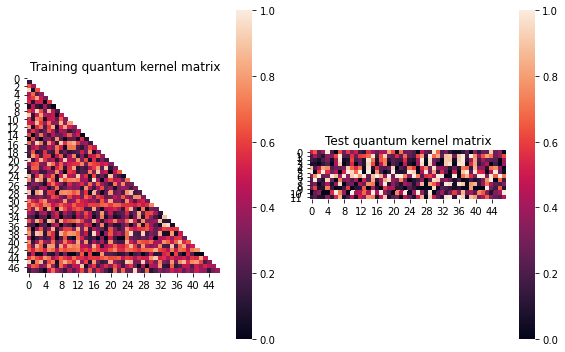


SVM with quantum kernel trained!


Test set performance:


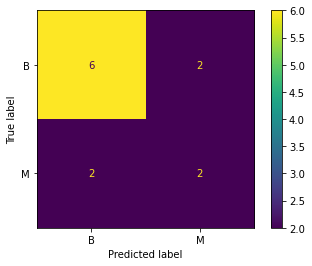

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.005282270862614402
metric(s) 2: (00, 10, 11) = (0.4405608540559616, 0.43684418678031106, 0.44369206122988936)
metric 3: -5.27123481529844e-295


----> Kernel construction duration: 00:00:32


Combination 87/200
(Current range: 7/20)
			 reps : 1
			 paulis : ['Z', 'XY']
			 entanglement : linear

Feature map:


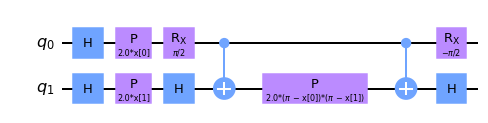


Quantum kernel matrices:



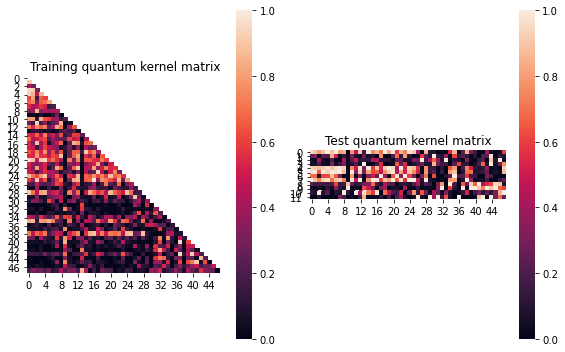


SVM with quantum kernel trained!


Test set performance:


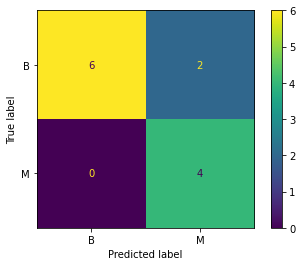

              precision    recall  f1-score   support

           B       1.00      0.75      0.86         8
           M       0.67      1.00      0.80         4

    accuracy                           0.83        12
   macro avg       0.83      0.88      0.83        12
weighted avg       0.89      0.83      0.84        12


metric 1: 0.1704139563444097
metric(s) 2: (00, 10, 11) = (0.44067324193045426, 0.1840589967608287, 0.26827266428002255)
metric 3: 1.3029854893792524e-287


----> Kernel construction duration: 00:00:51


Combination 88/200
(Current range: 8/20)
			 reps : 2
			 paulis : ['Z', 'XZ']
			 entanglement : linear

Feature map:


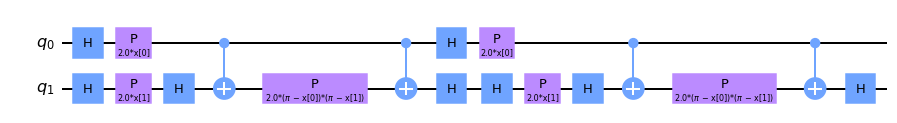


Quantum kernel matrices:



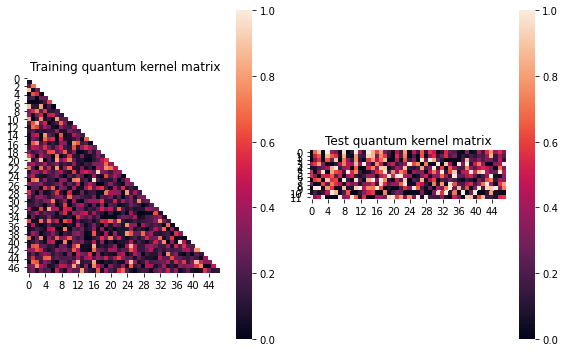


SVM with quantum kernel trained!


Test set performance:


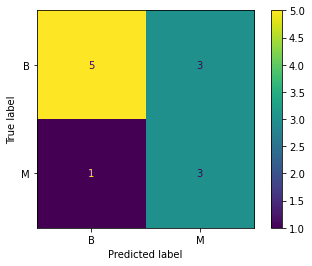

              precision    recall  f1-score   support

           B       0.83      0.62      0.71         8
           M       0.50      0.75      0.60         4

    accuracy                           0.67        12
   macro avg       0.67      0.69      0.66        12
weighted avg       0.72      0.67      0.68        12


metric 1: 0.04411371832359476
metric(s) 2: (00, 10, 11) = (0.29994757071812056, 0.2438661373717502, 0.27601214067256935)
metric 3: 3.711077290017095e-257


----> Kernel construction duration: 00:01:27


Combination 89/200
(Current range: 9/20)
			 reps : 3
			 paulis : ['ZZ', 'Y']
			 entanglement : linear

Feature map:


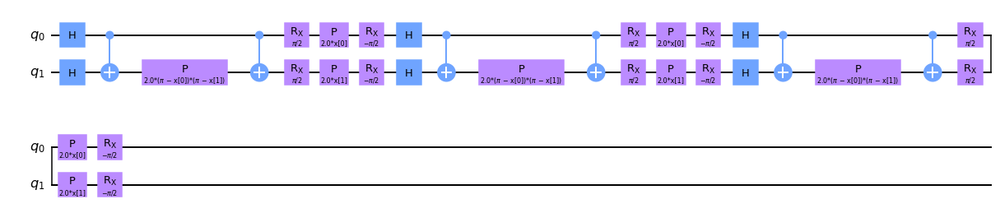


Quantum kernel matrices:



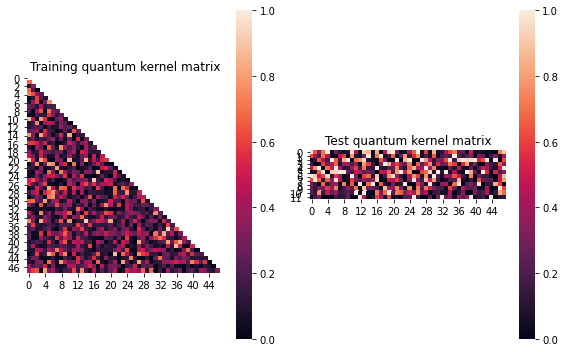


SVM with quantum kernel trained!


Test set performance:


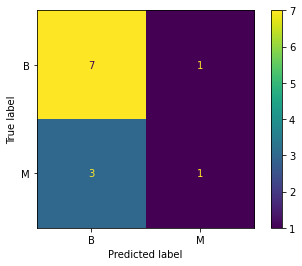

              precision    recall  f1-score   support

           B       0.70      0.88      0.78         8
           M       0.50      0.25      0.33         4

    accuracy                           0.67        12
   macro avg       0.60      0.56      0.56        12
weighted avg       0.63      0.67      0.63        12


metric 1: 0.03276530770685793
metric(s) 2: (00, 10, 11) = (0.29593058409148765, 0.25365091277274027, 0.27690185686770874)
metric 3: 4.750170554958364e-271


----> Kernel construction duration: 00:02:31


Combination 90/200
(Current range: 10/20)
			 reps : 3
			 paulis : ['YZ', 'YX']
			 entanglement : linear

Feature map:


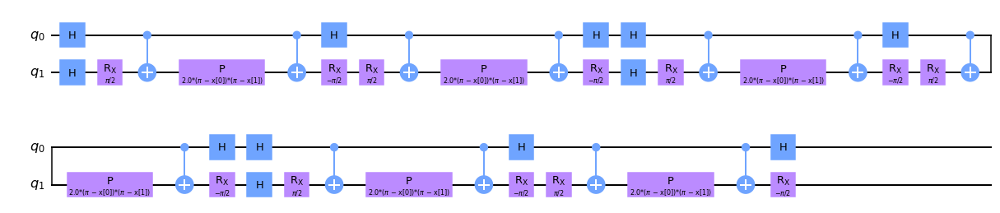


Quantum kernel matrices:



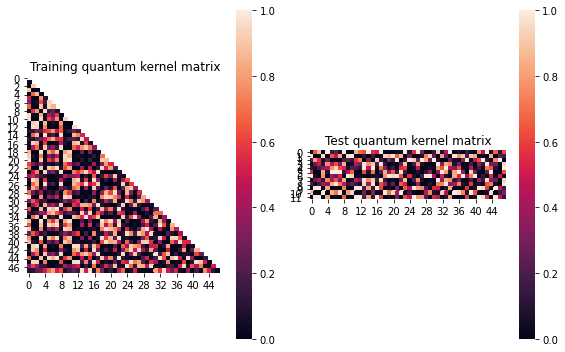


SVM with quantum kernel trained!


Test set performance:


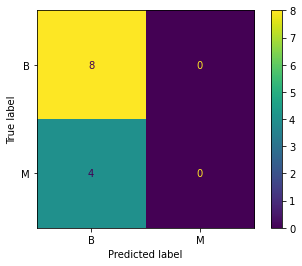

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:02:49


Combination 91/200
(Current range: 11/20)
			 reps : 2
			 paulis : ['ZY', 'ZZ']
			 entanglement : linear

Feature map:


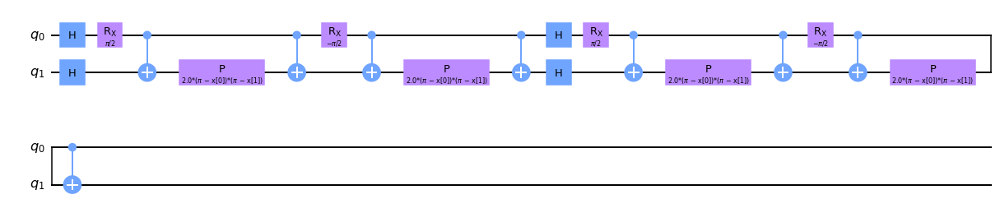


Quantum kernel matrices:



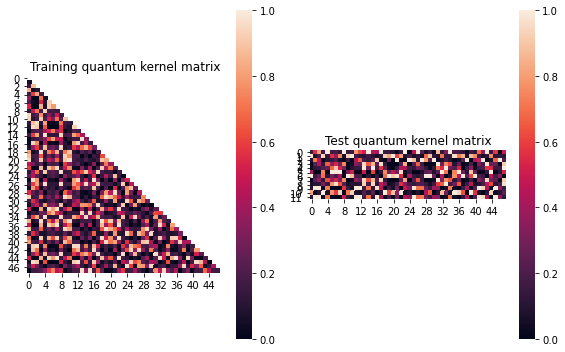


SVM with quantum kernel trained!


Test set performance:


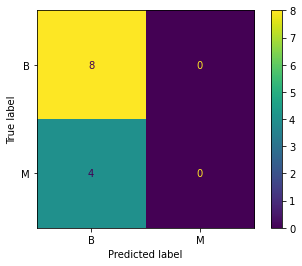

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.016148050821136573
metric(s) 2: (00, 10, 11) = (0.3778531929059263, 0.3572597239903021, 0.36896235671695105)
metric 3: -9.788476546507594e-309


----> Kernel construction duration: 00:02:13


Combination 92/200
(Current range: 12/20)
			 reps : 1
			 paulis : ['YY', 'YY']
			 entanglement : linear

Feature map:


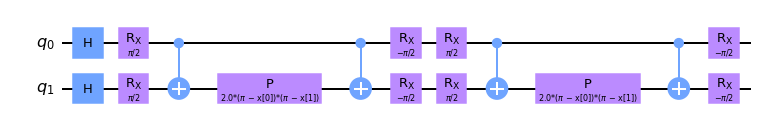


Quantum kernel matrices:



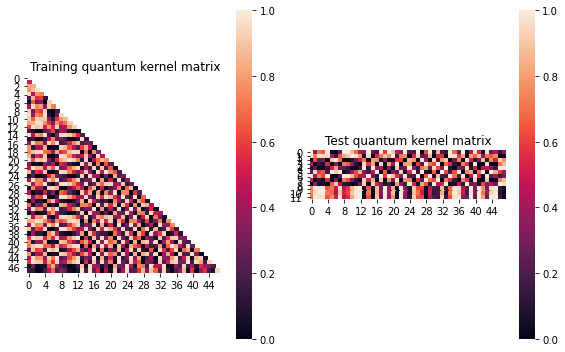


SVM with quantum kernel trained!


Test set performance:


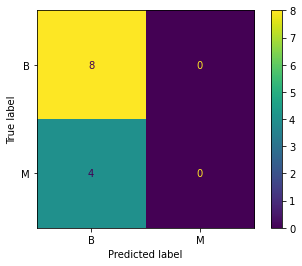

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:44


Combination 93/200
(Current range: 13/20)
			 reps : 2
			 paulis : ['Z', 'YZ']
			 entanglement : linear

Feature map:


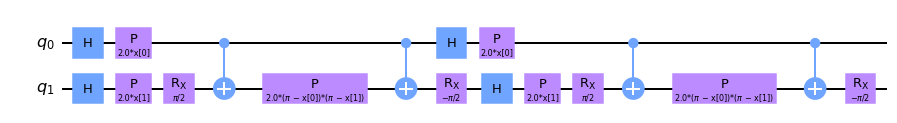


Quantum kernel matrices:



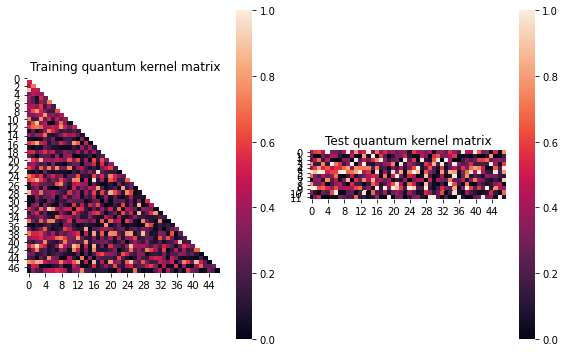


SVM with quantum kernel trained!


Test set performance:


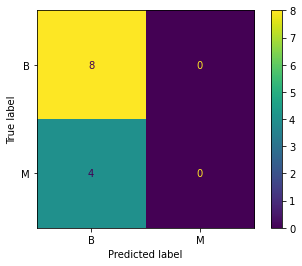

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.026085107697272014
metric(s) 2: (00, 10, 11) = (0.3348452043984878, 0.28762347954329637, 0.292571970082649)
metric 3: 6.3793234761712e-268


----> Kernel construction duration: 00:01:31


Combination 94/200
(Current range: 14/20)
			 reps : 1
			 paulis : ['Y', 'YX']
			 entanglement : linear

Feature map:


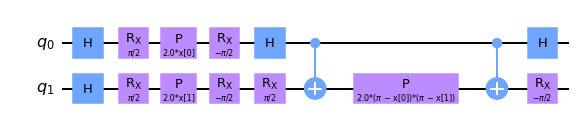


Quantum kernel matrices:



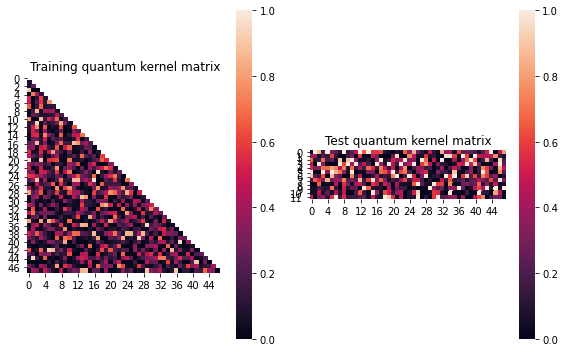


SVM with quantum kernel trained!


Test set performance:


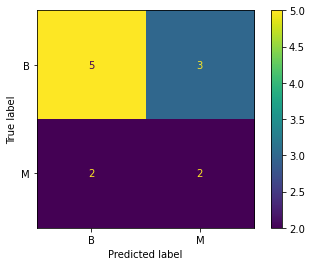

              precision    recall  f1-score   support

           B       0.71      0.62      0.67         8
           M       0.40      0.50      0.44         4

    accuracy                           0.58        12
   macro avg       0.56      0.56      0.56        12
weighted avg       0.61      0.58      0.59        12


metric 1: 0.06173851569566724
metric(s) 2: (00, 10, 11) = (0.30073291642239536, 0.2210065916161159, 0.26475729820117094)
metric 3: 3.017124079015278e-292


----> Kernel construction duration: 00:00:49


Combination 95/200
(Current range: 15/20)
			 reps : 1
			 paulis : ['X', 'YY']
			 entanglement : linear

Feature map:


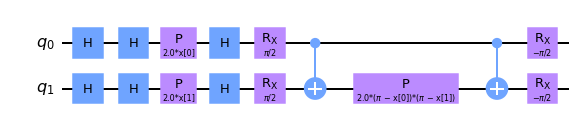


Quantum kernel matrices:



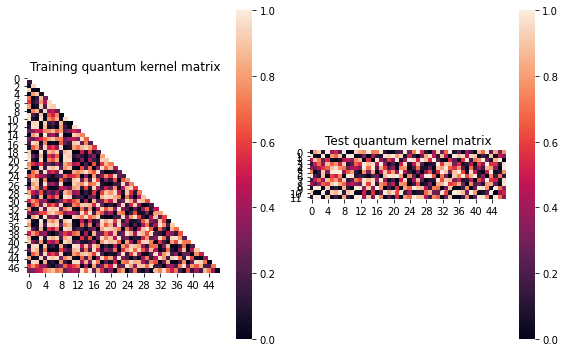


SVM with quantum kernel trained!


Test set performance:


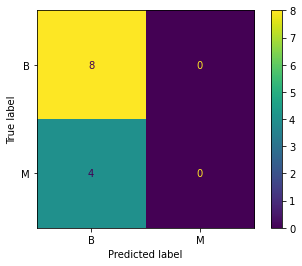

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:46


Combination 96/200
(Current range: 16/20)
			 reps : 1
			 paulis : ['XY', 'XY']
			 entanglement : linear

Feature map:


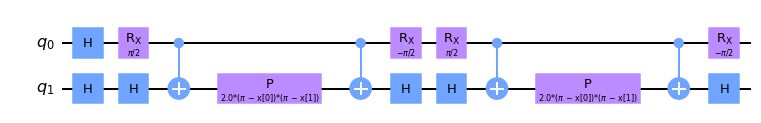


Quantum kernel matrices:



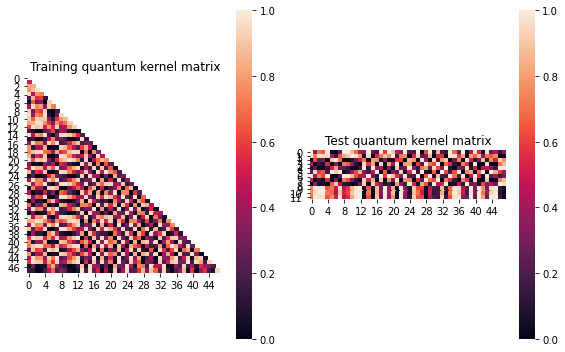


SVM with quantum kernel trained!


Test set performance:


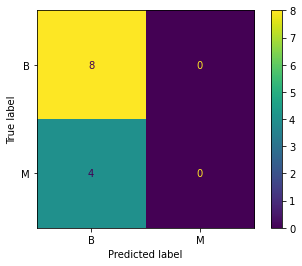

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:32


Combination 97/200
(Current range: 17/20)
			 reps : 1
			 paulis : ['ZZ', 'XX']
			 entanglement : linear

Feature map:


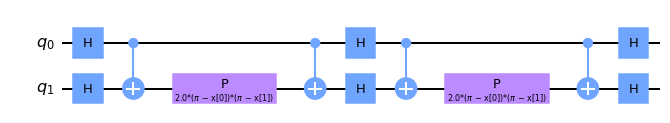


Quantum kernel matrices:



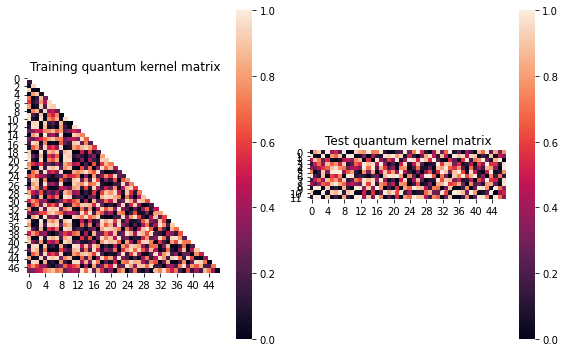


SVM with quantum kernel trained!


Test set performance:


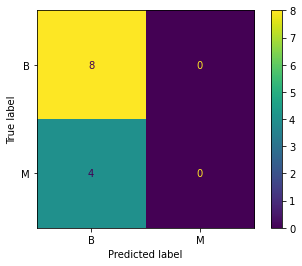

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:01:18


Combination 98/200
(Current range: 18/20)
			 reps : 3
			 paulis : ['ZY', 'ZX']
			 entanglement : linear

Feature map:


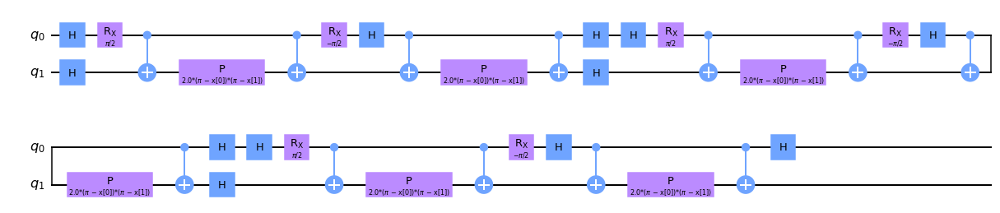


Quantum kernel matrices:



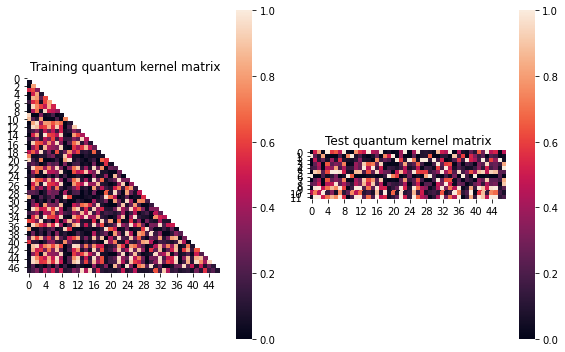


SVM with quantum kernel trained!


Test set performance:


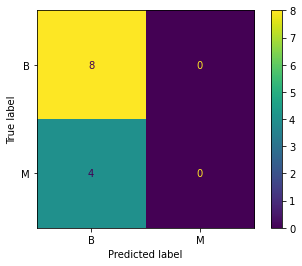

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.0025060810462346206
metric(s) 2: (00, 10, 11) = (0.36959552812209345, 0.3636406116188583, 0.36269785720809233)
metric 3: 2.0802591679931062e-307


----> Kernel construction duration: 00:03:01


Combination 99/200
(Current range: 19/20)
			 reps : 1
			 paulis : ['XZ', 'XZ']
			 entanglement : linear

Feature map:


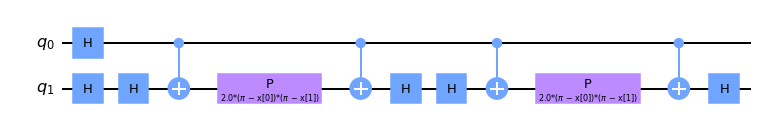


Quantum kernel matrices:



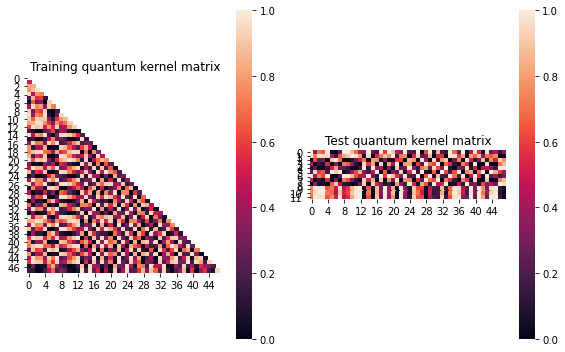


SVM with quantum kernel trained!


Test set performance:


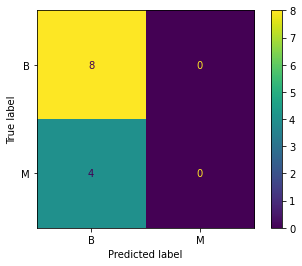

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:00:33


Combination 100/200
(Current range: 20/20)
			 reps : 2
			 paulis : ['XY', 'YX']
			 entanglement : linear

Feature map:


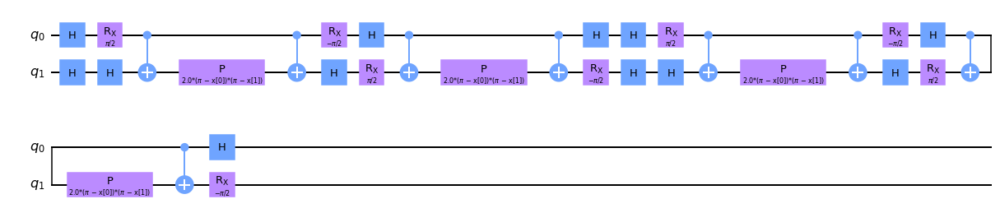


Quantum kernel matrices:



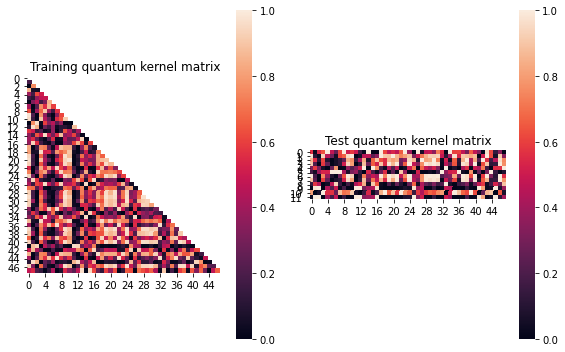


SVM with quantum kernel trained!


Test set performance:


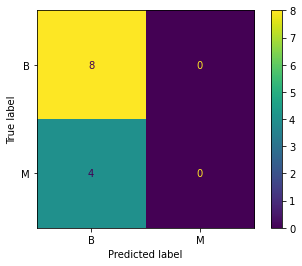

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.03155256781759347
metric(s) 2: (00, 10, 11) = (0.45741378950812334, 0.4554048511088717, 0.516501048344807)
metric 3: -0.0


----> Kernel construction duration: 00:02:13


In [15]:
j=4
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 101/200
(Current range: 1/20)
			 reps : 2
			 paulis : ['Y', 'XY']
			 entanglement : linear

Feature map:


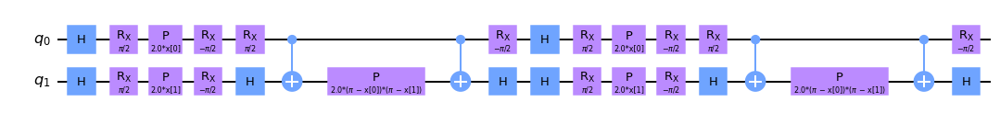


Quantum kernel matrices:



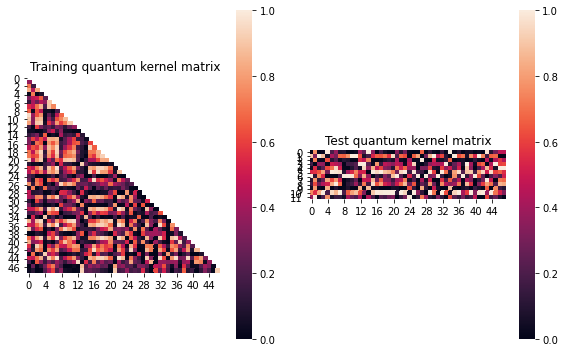


SVM with quantum kernel trained!


Test set performance:


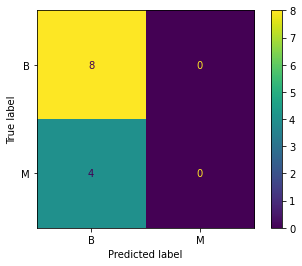

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.020302669163072384
metric(s) 2: (00, 10, 11) = (0.422276574005863, 0.38022803053604465, 0.3787848253923711)
metric 3: 1.8584625037183433e-304


----> Kernel construction duration: 00:01:32


Combination 102/200
(Current range: 2/20)
			 reps : 3
			 paulis : ['XX', 'ZY']
			 entanglement : linear

Feature map:


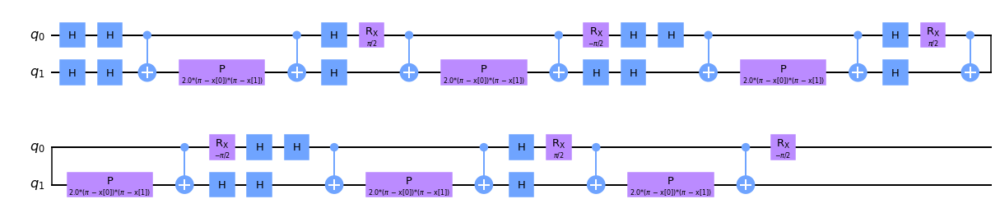


Quantum kernel matrices:



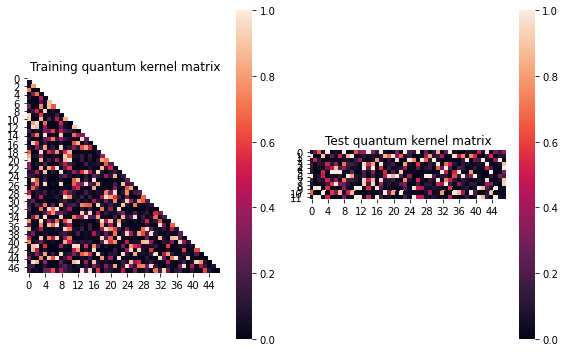


SVM with quantum kernel trained!


Test set performance:


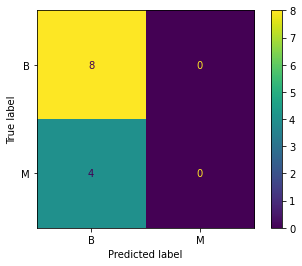

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01805160704765893
metric(s) 2: (00, 10, 11) = (0.26725128802061365, 0.24746678357459342, 0.263785493223891)
metric 3: 8.893388918773e-312


----> Kernel construction duration: 00:02:50


Combination 103/200
(Current range: 3/20)
			 reps : 3
			 paulis : ['YZ', 'XY']
			 entanglement : linear

Feature map:


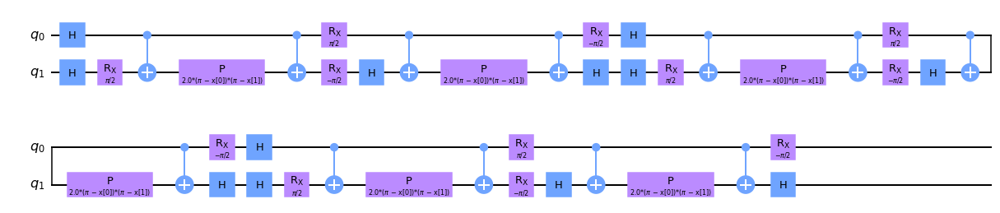


Quantum kernel matrices:



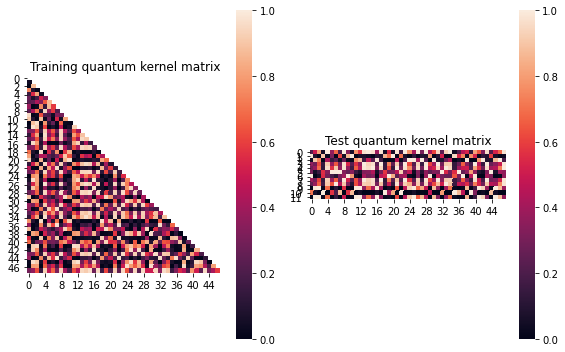


SVM with quantum kernel trained!


Test set performance:


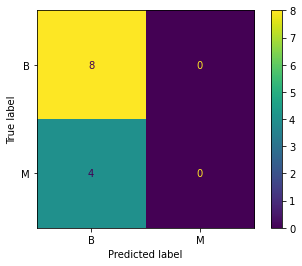

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006434831745365577
metric(s) 2: (00, 10, 11) = (0.4348652235380964, 0.4225354965752613, 0.4230754331031573)
metric 3: -0.0


----> Kernel construction duration: 00:03:32


Combination 104/200
(Current range: 4/20)
			 reps : 1
			 paulis : ['YX']
			 entanglement : linear

Feature map:


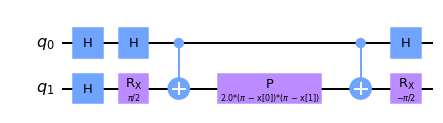


Quantum kernel matrices:



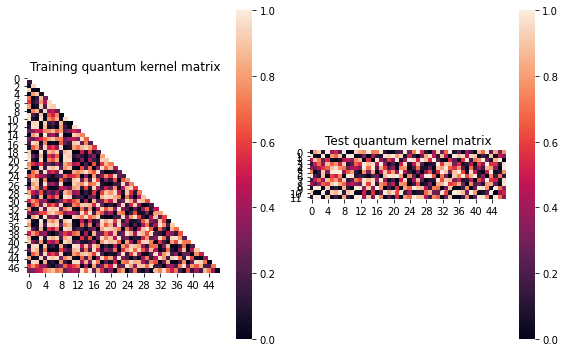


SVM with quantum kernel trained!


Test set performance:


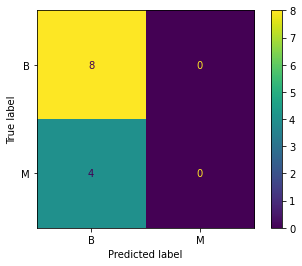

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:33


Combination 105/200
(Current range: 5/20)
			 reps : 3
			 paulis : ['Y', 'YX']
			 entanglement : linear

Feature map:


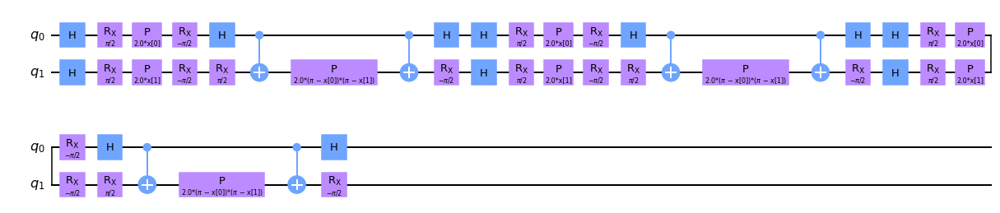


Quantum kernel matrices:



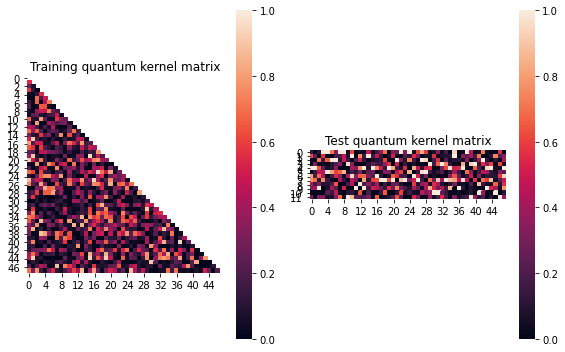


SVM with quantum kernel trained!


Test set performance:


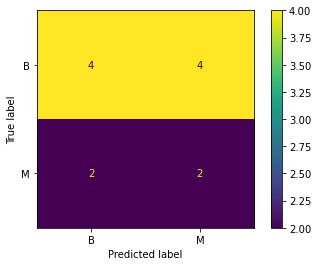

              precision    recall  f1-score   support

           B       0.67      0.50      0.57         8
           M       0.33      0.50      0.40         4

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.56      0.50      0.51        12


metric 1: 0.047004347358780924
metric(s) 2: (00, 10, 11) = (0.3039569521137793, 0.24721996506043328, 0.2844916727246491)
metric 3: -5.11927683326864e-307


----> Kernel construction duration: 00:02:15


Combination 106/200
(Current range: 6/20)
			 reps : 3
			 paulis : ['XY', 'ZX']
			 entanglement : linear

Feature map:


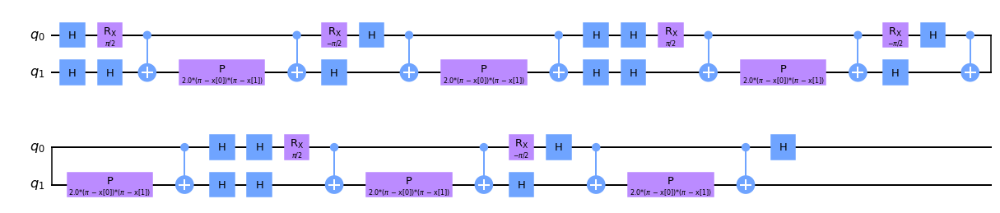


Quantum kernel matrices:



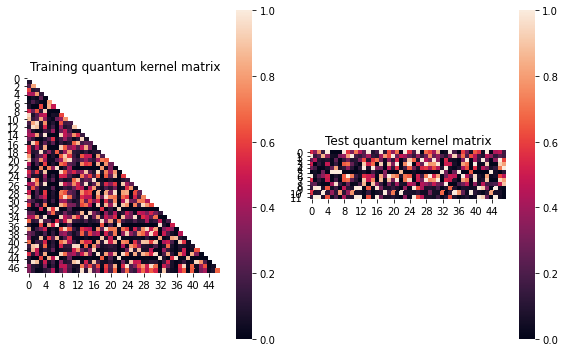


SVM with quantum kernel trained!


Test set performance:


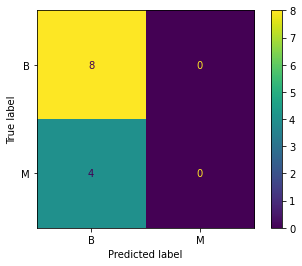

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.03311497313245476
metric(s) 2: (00, 10, 11) = (0.35134795612233294, 0.3187814844987315, 0.35244495914003954)
metric 3: 2.1e-322


----> Kernel construction duration: 00:03:01


Combination 107/200
(Current range: 7/20)
			 reps : 3
			 paulis : ['Z', 'ZY']
			 entanglement : linear

Feature map:


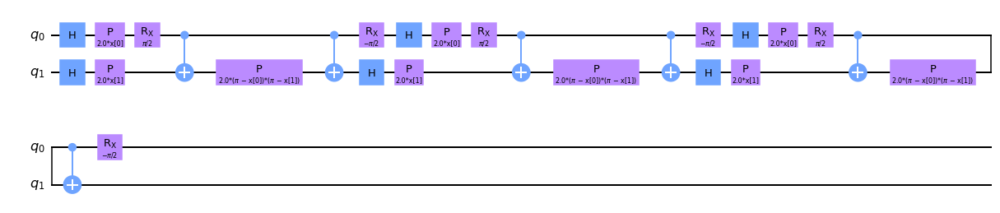


Quantum kernel matrices:



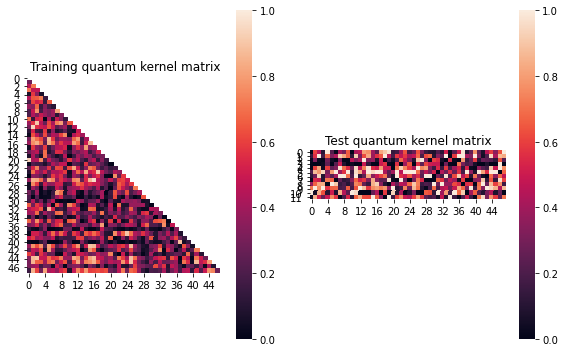


SVM with quantum kernel trained!


Test set performance:


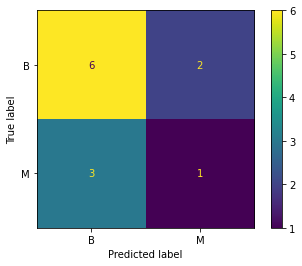

              precision    recall  f1-score   support

           B       0.67      0.75      0.71         8
           M       0.33      0.25      0.29         4

    accuracy                           0.58        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.56      0.58      0.57        12


metric 1: 0.025322532222292082
metric(s) 2: (00, 10, 11) = (0.3960937678153742, 0.33605320707029296, 0.32665771076979583)
metric 3: -5.738883784064197e-254


----> Kernel construction duration: 00:02:11


Combination 108/200
(Current range: 8/20)
			 reps : 3
			 paulis : ['XZ', 'Y']
			 entanglement : linear

Feature map:


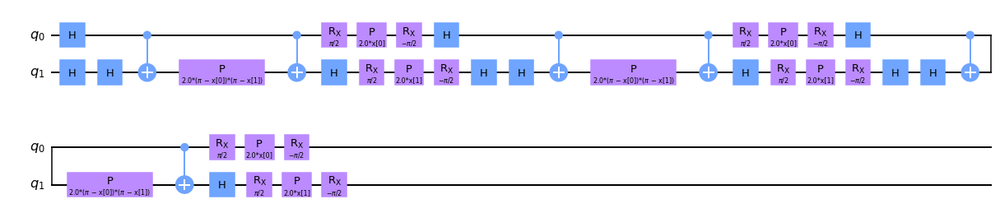


Quantum kernel matrices:



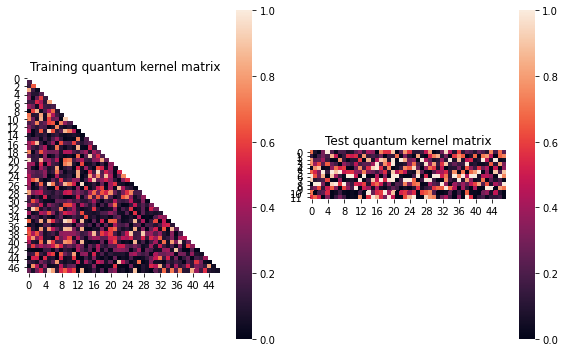


SVM with quantum kernel trained!


Test set performance:


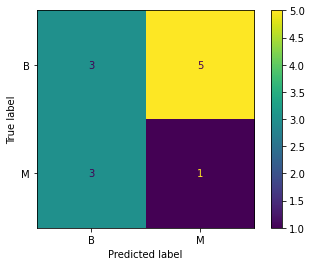

              precision    recall  f1-score   support

           B       0.50      0.38      0.43         8
           M       0.17      0.25      0.20         4

    accuracy                           0.33        12
   macro avg       0.33      0.31      0.31        12
weighted avg       0.39      0.33      0.35        12


metric 1: 0.0485282890420175
metric(s) 2: (00, 10, 11) = (0.31166700712647644, 0.24316202710121487, 0.2717136251599883)
metric 3: 2.002368958768507e-285


----> Kernel construction duration: 00:02:21


Combination 109/200
(Current range: 9/20)
			 reps : 3
			 paulis : ['Y', 'ZZ']
			 entanglement : linear

Feature map:


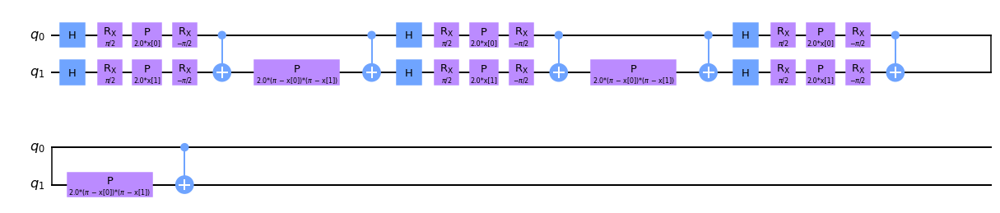


Quantum kernel matrices:



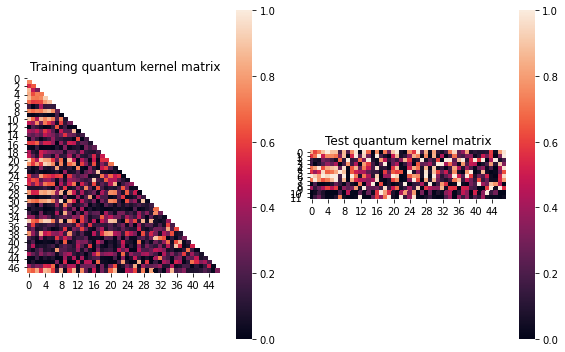


SVM with quantum kernel trained!


Test set performance:


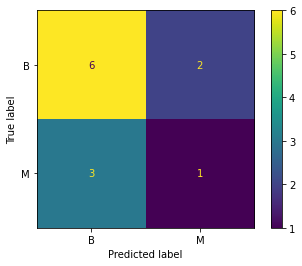

              precision    recall  f1-score   support

           B       0.67      0.75      0.71         8
           M       0.33      0.25      0.29         4

    accuracy                           0.58        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.56      0.58      0.57        12


metric 1: 0.06228719063140489
metric(s) 2: (00, 10, 11) = (0.3440104798406289, 0.24816179578089145, 0.27688749298396387)
metric 3: 3.0693979887910983e-271


----> Kernel construction duration: 00:02:17


Combination 110/200
(Current range: 10/20)
			 reps : 3
			 paulis : ['XY', 'Z']
			 entanglement : linear

Feature map:


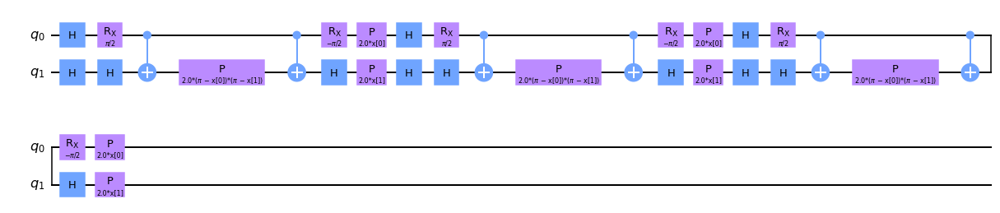


Quantum kernel matrices:



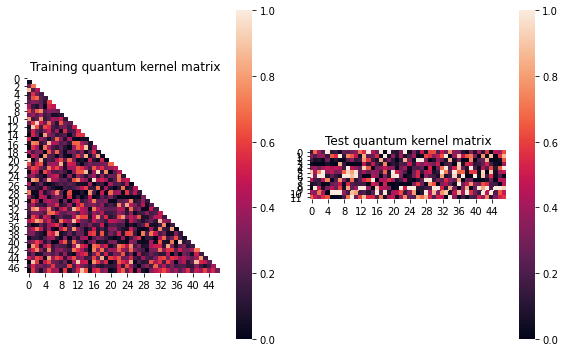


SVM with quantum kernel trained!


Test set performance:


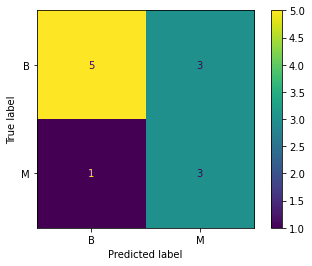

              precision    recall  f1-score   support

           B       0.83      0.62      0.71         8
           M       0.50      0.75      0.60         4

    accuracy                           0.67        12
   macro avg       0.67      0.69      0.66        12
weighted avg       0.72      0.67      0.68        12


metric 1: 0.012433405393920127
metric(s) 2: (00, 10, 11) = (0.3324300551712955, 0.31339235404644583, 0.3192214637094364)
metric 3: -4.970222451696784e-260


----> Kernel construction duration: 00:02:15


Combination 111/200
(Current range: 11/20)
			 reps : 1
			 paulis : ['Y', 'XZ']
			 entanglement : linear

Feature map:


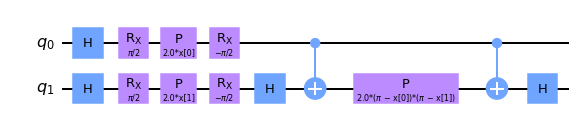


Quantum kernel matrices:



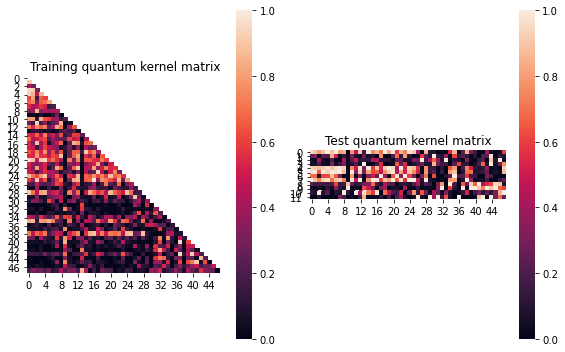


SVM with quantum kernel trained!


Test set performance:


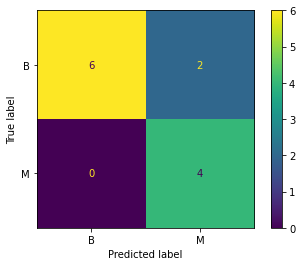

              precision    recall  f1-score   support

           B       1.00      0.75      0.86         8
           M       0.67      1.00      0.80         4

    accuracy                           0.83        12
   macro avg       0.83      0.88      0.83        12
weighted avg       0.89      0.83      0.84        12


metric 1: 0.1704139563444097
metric(s) 2: (00, 10, 11) = (0.44067324193045426, 0.1840589967608287, 0.26827266428002255)
metric 3: 1.3029854893792524e-287


----> Kernel construction duration: 00:00:51


Combination 112/200
(Current range: 12/20)
			 reps : 1
			 paulis : ['ZX', 'YZ']
			 entanglement : linear

Feature map:


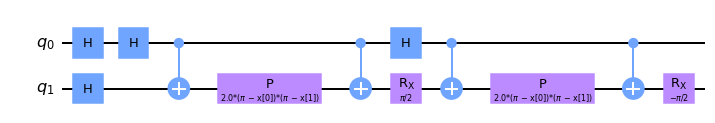


Quantum kernel matrices:



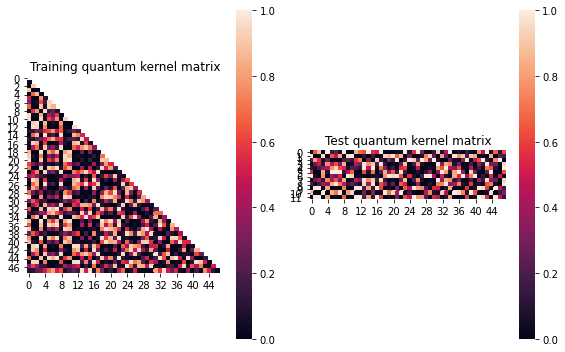


SVM with quantum kernel trained!


Test set performance:


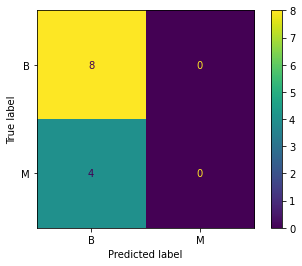

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 113/200
(Current range: 13/20)
			 reps : 1
			 paulis : ['YZ', 'ZX']
			 entanglement : linear

Feature map:


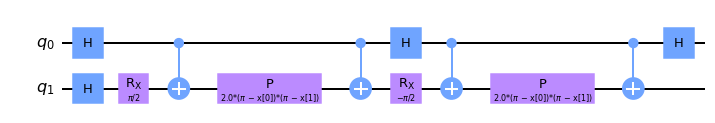


Quantum kernel matrices:



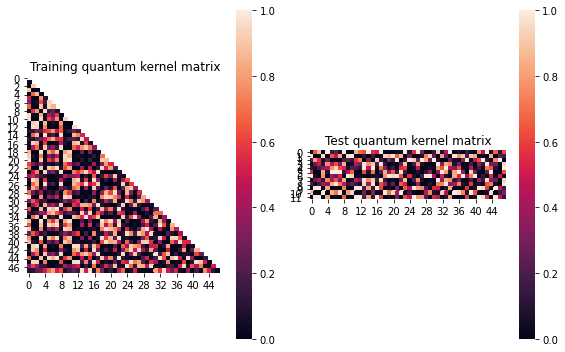


SVM with quantum kernel trained!


Test set performance:


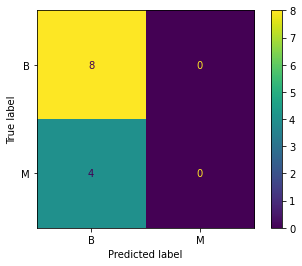

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:19


Combination 114/200
(Current range: 14/20)
			 reps : 2
			 paulis : ['YX', 'ZX']
			 entanglement : linear

Feature map:


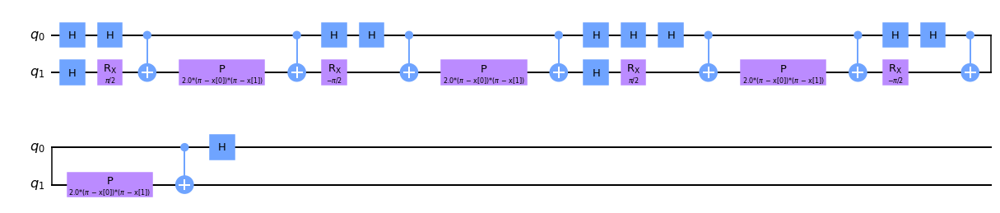


Quantum kernel matrices:



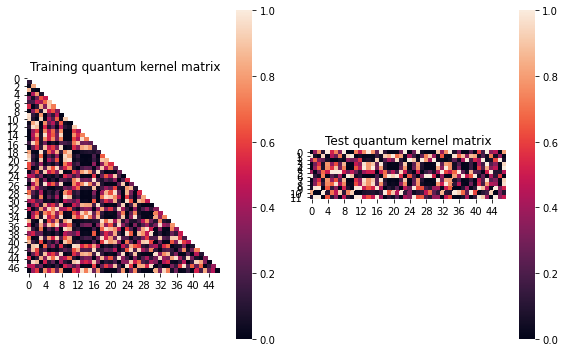


SVM with quantum kernel trained!


Test set performance:


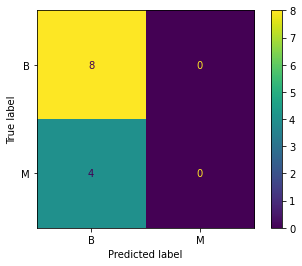

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.010663587146037268
metric(s) 2: (00, 10, 11) = (0.383585223374501, 0.372818870338711, 0.38337969159499546)
metric 3: -3.844e-321


----> Kernel construction duration: 00:01:53


Combination 115/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['X', 'ZX']
			 entanglement : linear

Feature map:


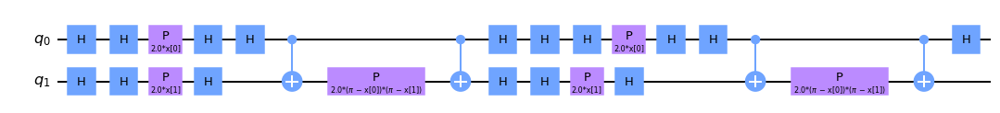


Quantum kernel matrices:



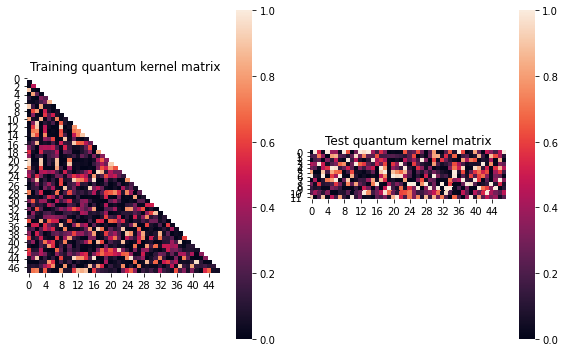


SVM with quantum kernel trained!


Test set performance:


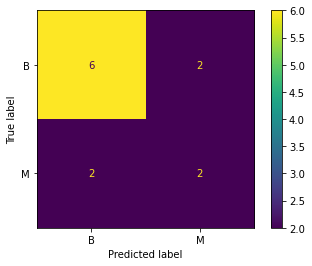

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.02648195111179588
metric(s) 2: (00, 10, 11) = (0.27757013303562994, 0.244923642866316, 0.2652410549205938)
metric 3: -5.1074454601293136e-306


----> Kernel construction duration: 00:01:21


Combination 116/200
(Current range: 16/20)
			 reps : 3
			 paulis : ['ZX']
			 entanglement : linear

Feature map:


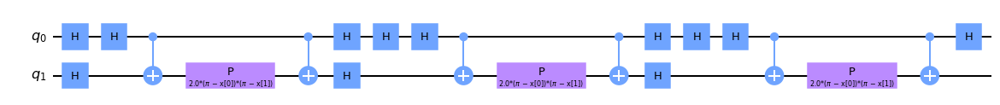


Quantum kernel matrices:



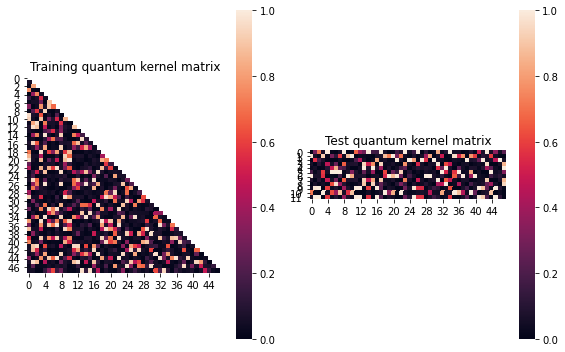


SVM with quantum kernel trained!


Test set performance:


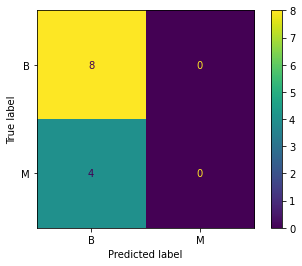

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01709455593717732
metric(s) 2: (00, 10, 11) = (0.2672603142780964, 0.2460315410683898, 0.25899187973303783)
metric 3: 1.1543741717556e-311


----> Kernel construction duration: 00:01:43


Combination 117/200
(Current range: 17/20)
			 reps : 1
			 paulis : ['Y', 'X']
			 entanglement : linear

Feature map:


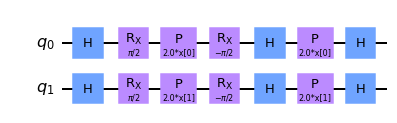


Quantum kernel matrices:



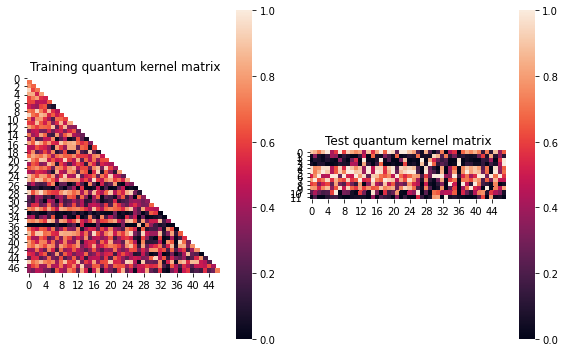


SVM with quantum kernel trained!


Test set performance:


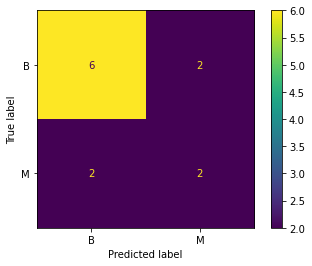

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.04093812056554735
metric(s) 2: (00, 10, 11) = (0.5372847733056034, 0.4452082949225029, 0.43500805767049716)
metric 3: 4.328972990428254e-271


----> Kernel construction duration: 00:00:30


Combination 118/200
(Current range: 18/20)
			 reps : 3
			 paulis : ['ZZ', 'ZX']
			 entanglement : linear

Feature map:


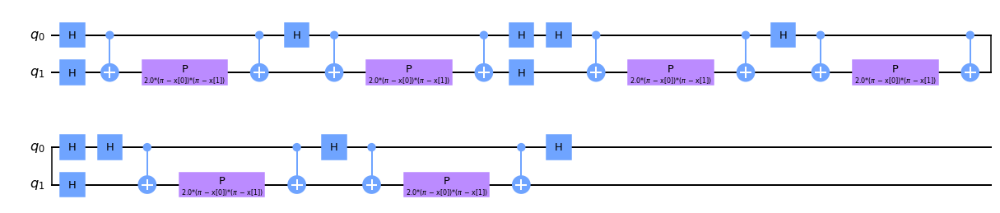


Quantum kernel matrices:



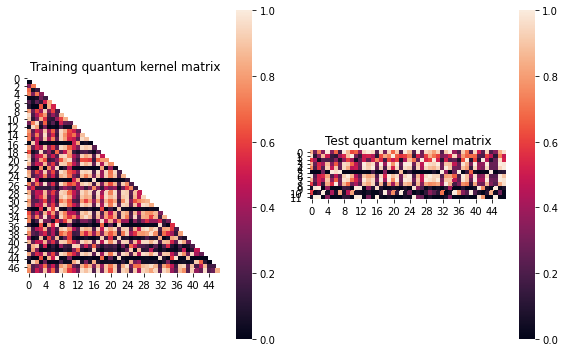


SVM with quantum kernel trained!


Test set performance:


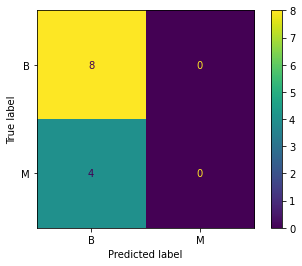

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.03105809621982608
metric(s) 2: (00, 10, 11) = (0.48558587611889237, 0.45729803071645897, 0.4911263777536778)
metric 3: 0.0


----> Kernel construction duration: 00:02:42


Combination 119/200
(Current range: 19/20)
			 reps : 3
			 paulis : ['Y', 'Y']
			 entanglement : linear

Feature map:


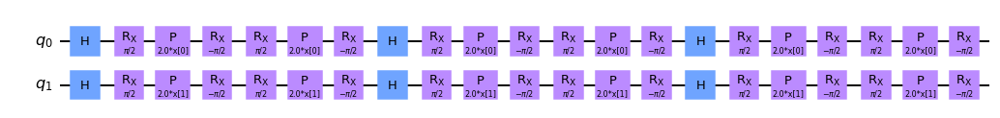


Quantum kernel matrices:



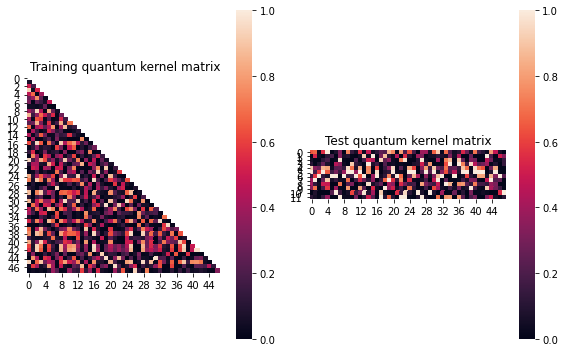


SVM with quantum kernel trained!


Test set performance:


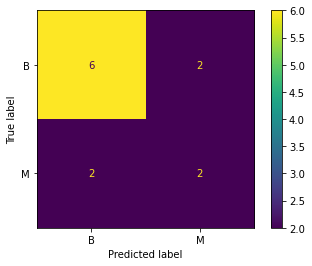

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.003060203370675918
metric(s) 2: (00, 10, 11) = (0.2952883440316702, 0.2861065836590393, 0.28304523002776016)
metric 3: -1.0421030137301359e-294


----> Kernel construction duration: 00:00:35


Combination 120/200
(Current range: 20/20)
			 reps : 3
			 paulis : ['Z', 'X']
			 entanglement : linear

Feature map:


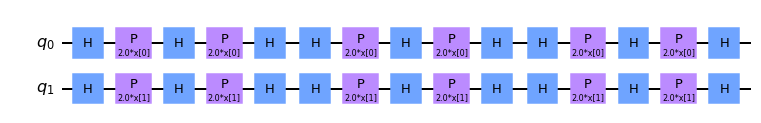


Quantum kernel matrices:



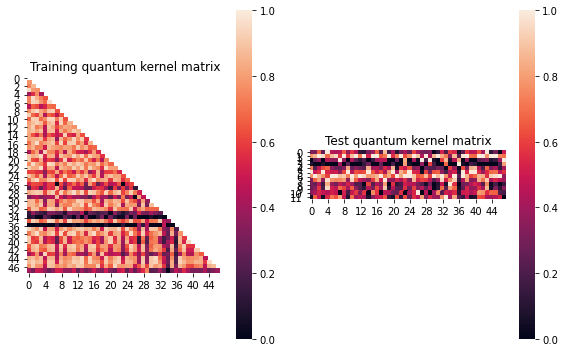


SVM with quantum kernel trained!


Test set performance:


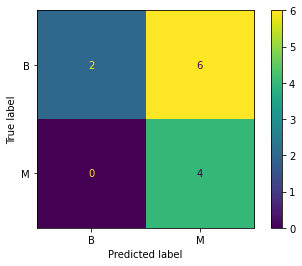

              precision    recall  f1-score   support

           B       1.00      0.25      0.40         8
           M       0.40      1.00      0.57         4

    accuracy                           0.50        12
   macro avg       0.70      0.62      0.49        12
weighted avg       0.80      0.50      0.46        12


metric 1: 0.042835047849594354
metric(s) 2: (00, 10, 11) = (0.7067207239630291, 0.6036289188163723, 0.5862072093689041)
metric 3: -2.7776355121153217e-300


----> Kernel construction duration: 00:00:35


In [16]:
j=5
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 121/200
(Current range: 1/20)
			 reps : 1
			 paulis : ['X', 'ZY']
			 entanglement : linear

Feature map:


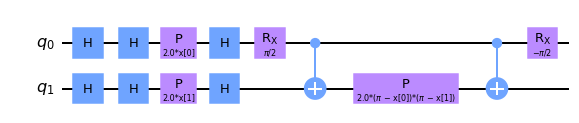


Quantum kernel matrices:



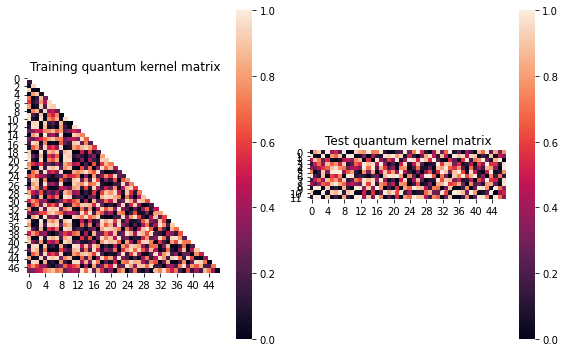


SVM with quantum kernel trained!


Test set performance:


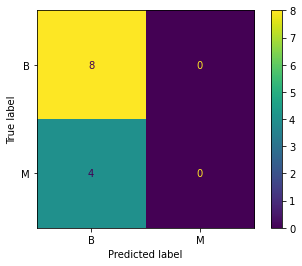

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:47


Combination 122/200
(Current range: 2/20)
			 reps : 2
			 paulis : ['XY', 'XY']
			 entanglement : linear

Feature map:


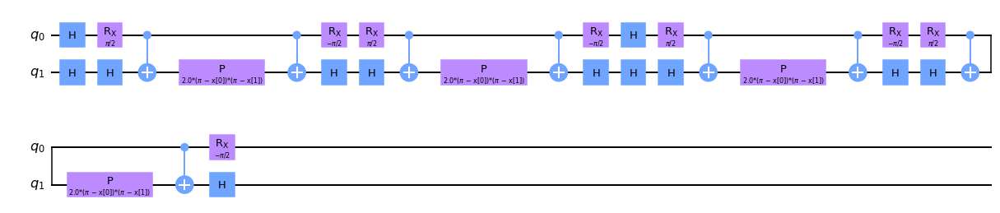


Quantum kernel matrices:



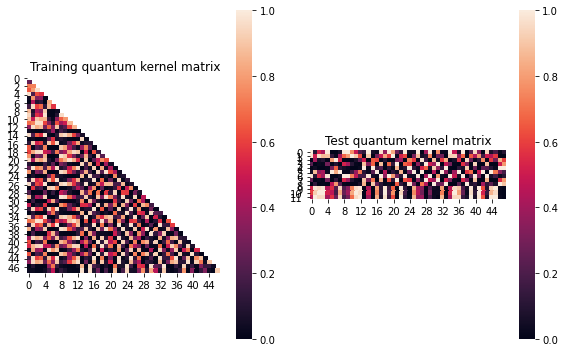


SVM with quantum kernel trained!


Test set performance:


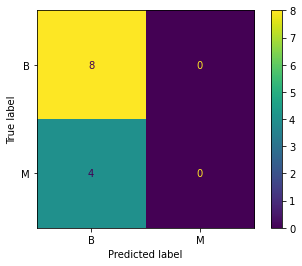

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.020892158097017832
metric(s) 2: (00, 10, 11) = (0.4112506262798868, 0.37125938362500255, 0.373052457164154)
metric 3: 0.0


----> Kernel construction duration: 00:01:13


Combination 123/200
(Current range: 3/20)
			 reps : 3
			 paulis : ['XY']
			 entanglement : linear

Feature map:


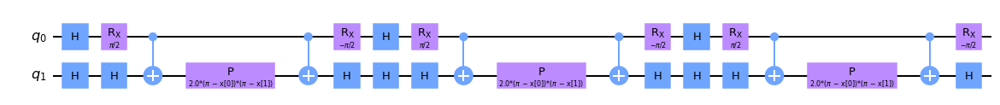


Quantum kernel matrices:



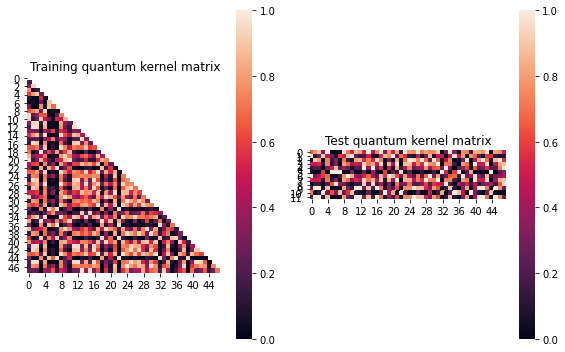


SVM with quantum kernel trained!


Test set performance:


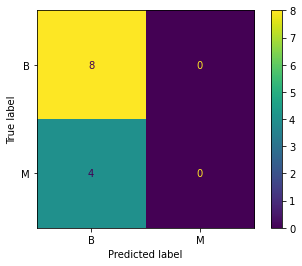

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.024489478801512088
metric(s) 2: (00, 10, 11) = (0.4852152845043629, 0.4567593398195045, 0.4772823527376703)
metric 3: -0.0


----> Kernel construction duration: 00:01:50


Combination 124/200
(Current range: 4/20)
			 reps : 3
			 paulis : ['ZZ', 'ZY']
			 entanglement : linear

Feature map:


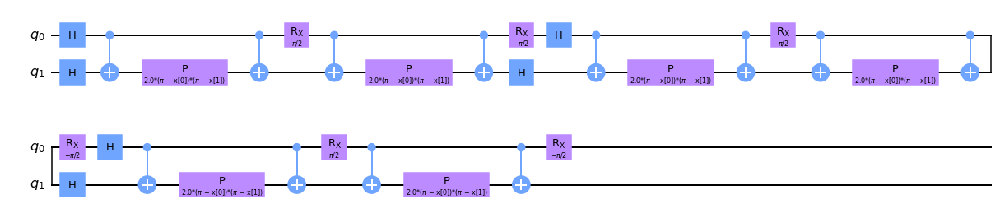


Quantum kernel matrices:



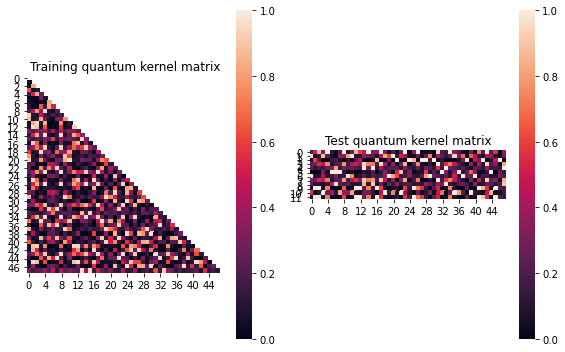


SVM with quantum kernel trained!


Test set performance:


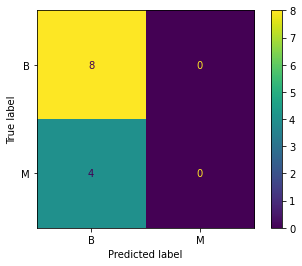

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.018901384139480115
metric(s) 2: (00, 10, 11) = (0.33259764761005856, 0.3109026299855174, 0.3270103806399364)
metric 3: -2.5827288256249085e-307


----> Kernel construction duration: 00:03:01


Combination 125/200
(Current range: 5/20)
			 reps : 2
			 paulis : ['YZ', 'XY']
			 entanglement : linear

Feature map:


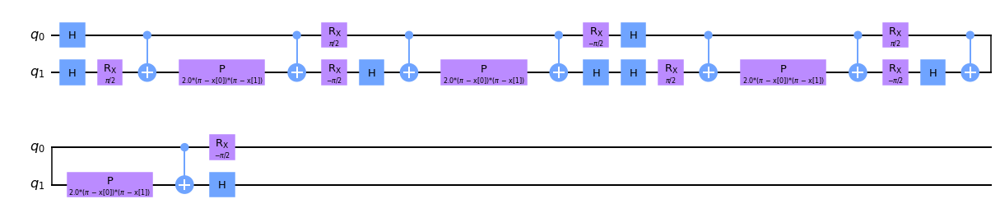


Quantum kernel matrices:



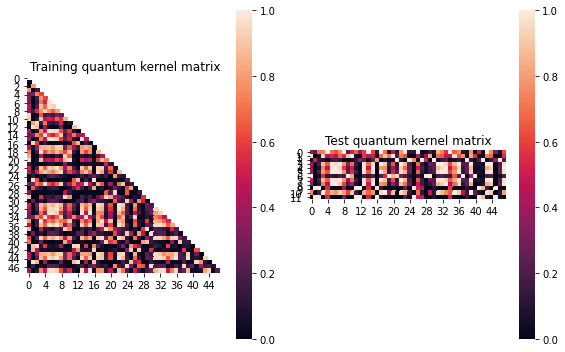


SVM with quantum kernel trained!


Test set performance:


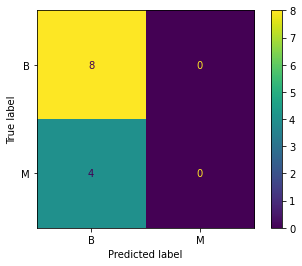

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.004941804309897491
metric(s) 2: (00, 10, 11) = (0.3882678447405788, 0.38528458886425504, 0.37241772436813636)
metric 3: -0.0


----> Kernel construction duration: 00:02:25


Combination 126/200
(Current range: 6/20)
			 reps : 2
			 paulis : ['ZY', 'ZX']
			 entanglement : linear

Feature map:


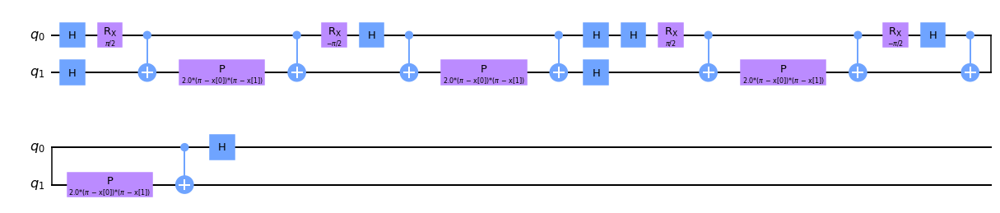


Quantum kernel matrices:



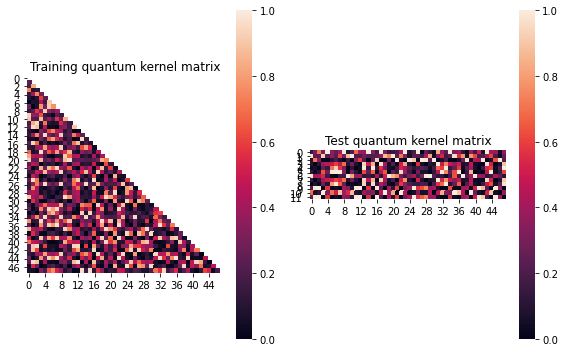


SVM with quantum kernel trained!


Test set performance:


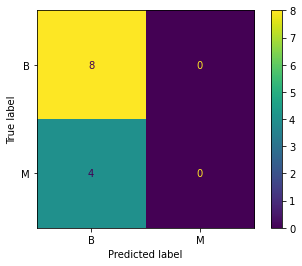

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.019041240739741006
metric(s) 2: (00, 10, 11) = (0.36846171243444553, 0.3454804277737181, 0.36058162459247267)
metric 3: 2.2e-322


----> Kernel construction duration: 00:02:06


Combination 127/200
(Current range: 7/20)
			 reps : 2
			 paulis : ['YY', 'Y']
			 entanglement : linear

Feature map:


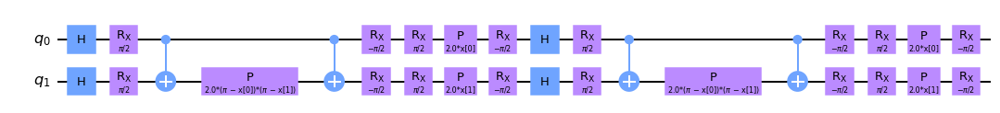


Quantum kernel matrices:



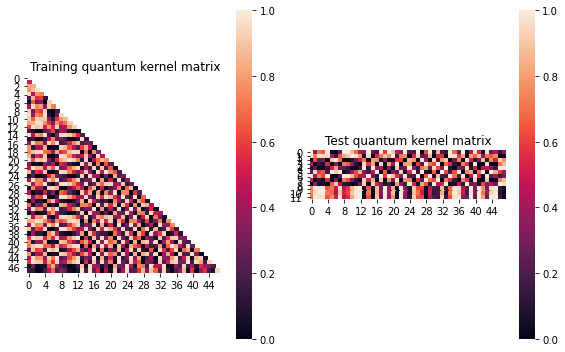


SVM with quantum kernel trained!


Test set performance:


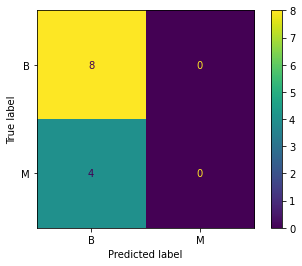

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:01:44


Combination 128/200
(Current range: 8/20)
			 reps : 1
			 paulis : ['YZ', 'Z']
			 entanglement : linear

Feature map:


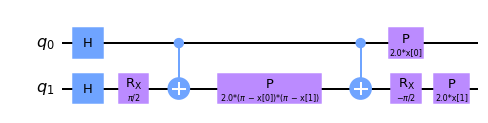


Quantum kernel matrices:



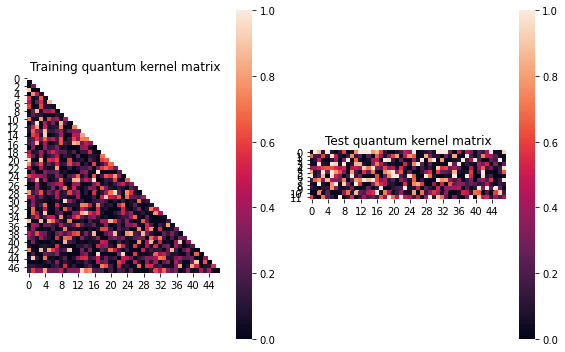


SVM with quantum kernel trained!


Test set performance:


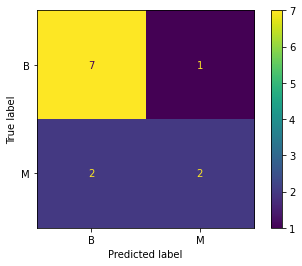

              precision    recall  f1-score   support

           B       0.78      0.88      0.82         8
           M       0.67      0.50      0.57         4

    accuracy                           0.75        12
   macro avg       0.72      0.69      0.70        12
weighted avg       0.74      0.75      0.74        12


metric 1: 0.058774655813932264
metric(s) 2: (00, 10, 11) = (0.29021684878389126, 0.21785380371576896, 0.2630400702755112)
metric 3: -1.3468266009345293e-305


----> Kernel construction duration: 00:01:04


Combination 129/200
(Current range: 9/20)
			 reps : 1
			 paulis : ['ZZ', 'YX']
			 entanglement : linear

Feature map:


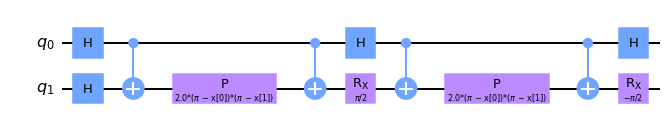


Quantum kernel matrices:



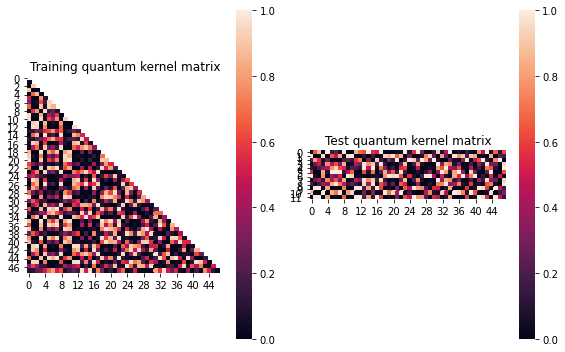


SVM with quantum kernel trained!


Test set performance:


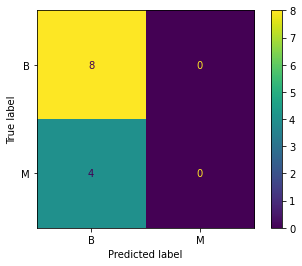

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:19


Combination 130/200
(Current range: 10/20)
			 reps : 1
			 paulis : ['XX', 'ZZ']
			 entanglement : linear

Feature map:


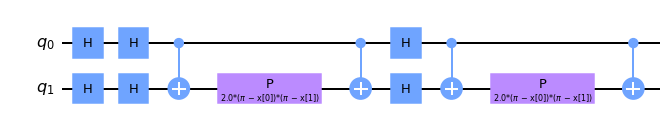


Quantum kernel matrices:



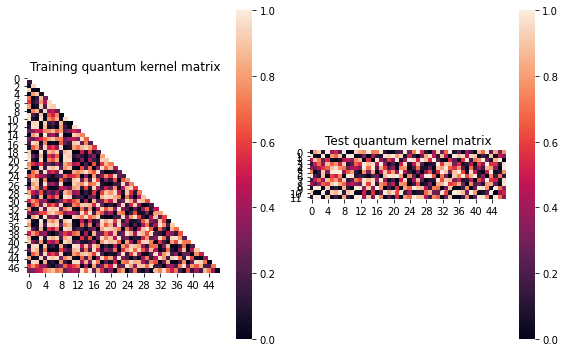


SVM with quantum kernel trained!


Test set performance:


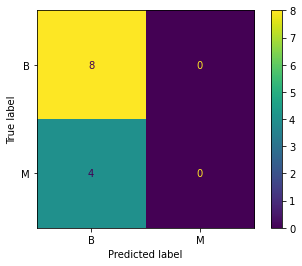

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:55


Combination 131/200
(Current range: 11/20)
			 reps : 1
			 paulis : ['YX', 'YZ']
			 entanglement : linear

Feature map:


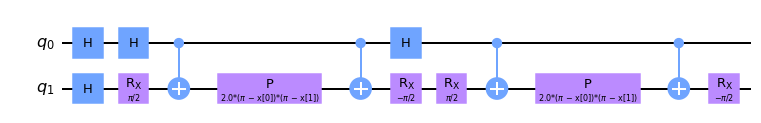


Quantum kernel matrices:



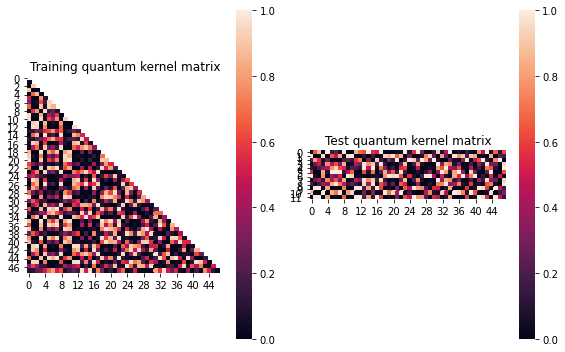


SVM with quantum kernel trained!


Test set performance:


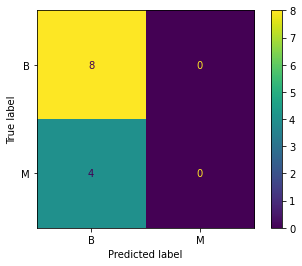

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:00:56


Combination 132/200
(Current range: 12/20)
			 reps : 1
			 paulis : ['ZX', 'XZ']
			 entanglement : linear

Feature map:


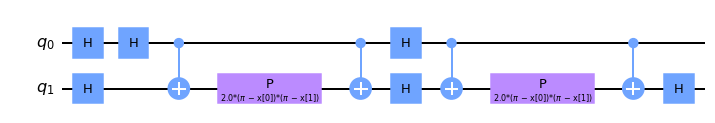


Quantum kernel matrices:



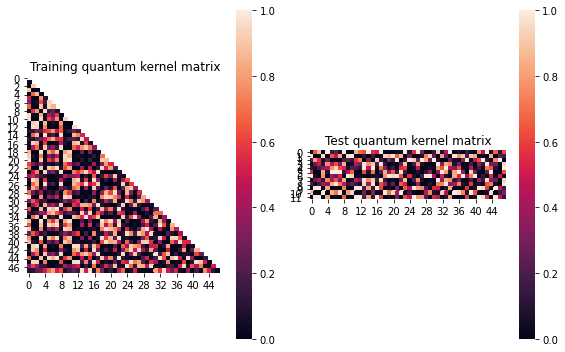


SVM with quantum kernel trained!


Test set performance:


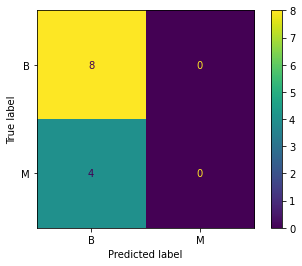

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 133/200
(Current range: 13/20)
			 reps : 2
			 paulis : ['ZY', 'Y']
			 entanglement : linear

Feature map:


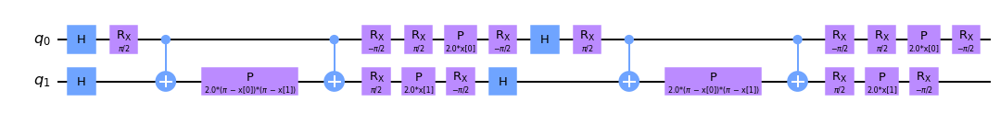


Quantum kernel matrices:



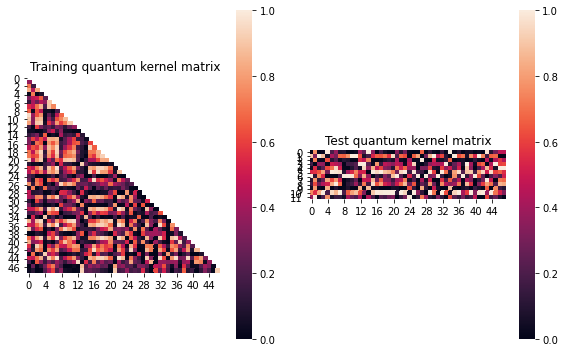


SVM with quantum kernel trained!


Test set performance:


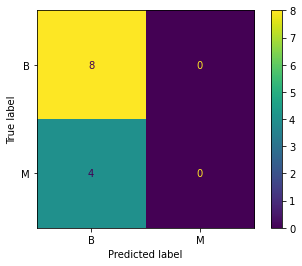

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.020302669163072384
metric(s) 2: (00, 10, 11) = (0.422276574005863, 0.38022803053604465, 0.3787848253923711)
metric 3: 1.8584625037183433e-304


----> Kernel construction duration: 00:01:46


Combination 134/200
(Current range: 14/20)
			 reps : 1
			 paulis : ['Y', 'ZX']
			 entanglement : linear

Feature map:


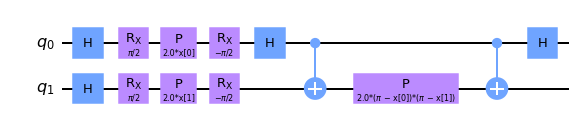


Quantum kernel matrices:



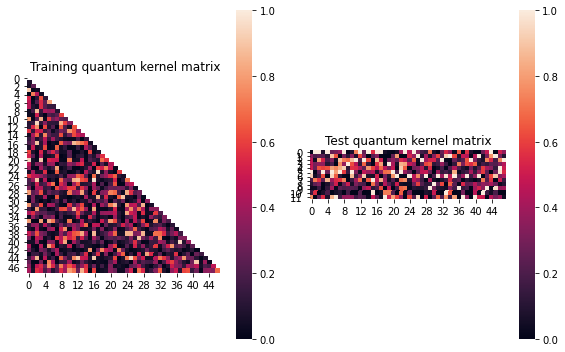


SVM with quantum kernel trained!


Test set performance:


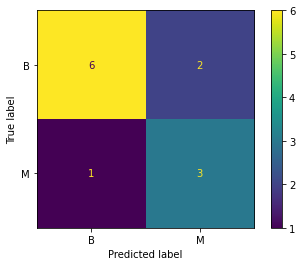

              precision    recall  f1-score   support

           B       0.86      0.75      0.80         8
           M       0.60      0.75      0.67         4

    accuracy                           0.75        12
   macro avg       0.73      0.75      0.73        12
weighted avg       0.77      0.75      0.76        12


metric 1: 0.03592819727096774
metric(s) 2: (00, 10, 11) = (0.3051767628425095, 0.25942755222727654, 0.28553473615397906)
metric 3: -3.744565892143059e-274


----> Kernel construction duration: 00:00:51


Combination 135/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['ZX', 'ZZ']
			 entanglement : linear

Feature map:


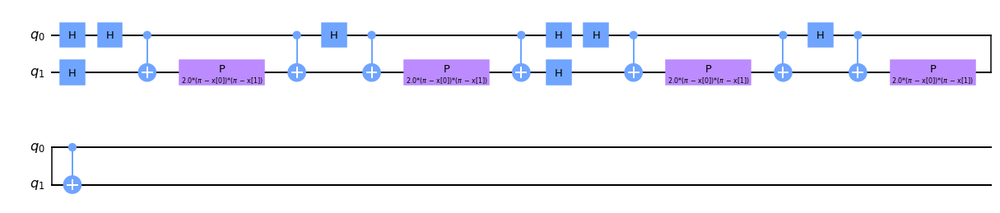


Quantum kernel matrices:



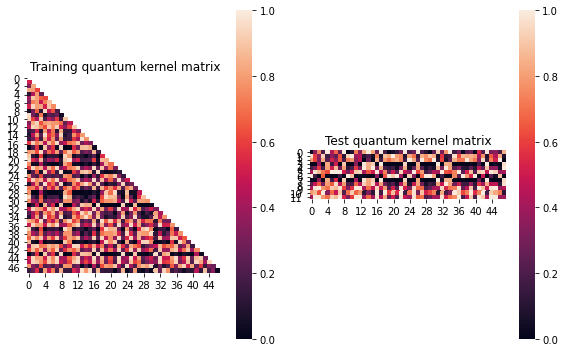


SVM with quantum kernel trained!


Test set performance:


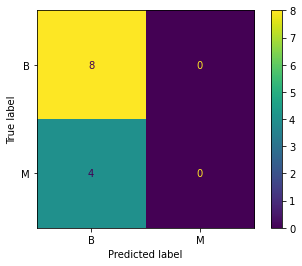

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.0025252940231341725
metric(s) 2: (00, 10, 11) = (0.5057153159881319, 0.5048422982789886, 0.4989186925235771)
metric 3: 3.356e-320


----> Kernel construction duration: 00:01:45


Combination 136/200
(Current range: 16/20)
			 reps : 1
			 paulis : ['YZ', 'XZ']
			 entanglement : linear

Feature map:


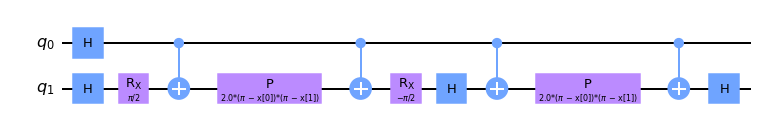


Quantum kernel matrices:



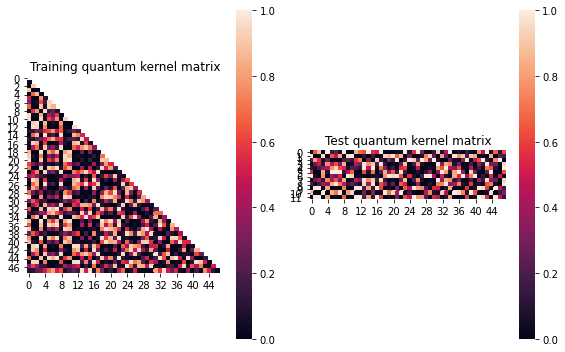


SVM with quantum kernel trained!


Test set performance:


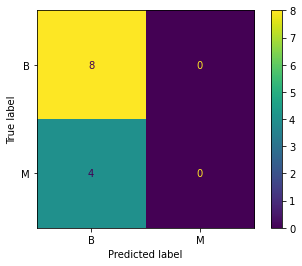

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 137/200
(Current range: 17/20)
			 reps : 3
			 paulis : ['XZ', 'YY']
			 entanglement : linear

Feature map:


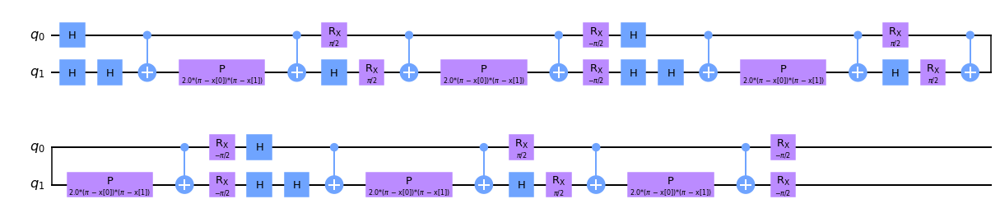


Quantum kernel matrices:



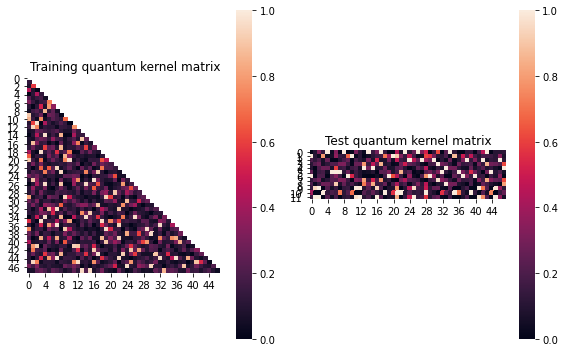


SVM with quantum kernel trained!


Test set performance:


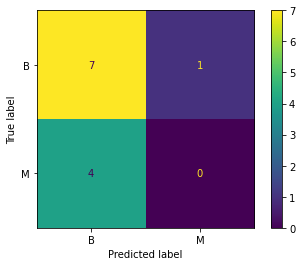

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: 0.018168849105064028
metric(s) 2: (00, 10, 11) = (0.25271593039365603, 0.23454273937169176, 0.2527072465598555)
metric 3: -3.18056863941782e-304


----> Kernel construction duration: 00:03:22


Combination 138/200
(Current range: 18/20)
			 reps : 1
			 paulis : ['ZZ', 'YZ']
			 entanglement : linear

Feature map:


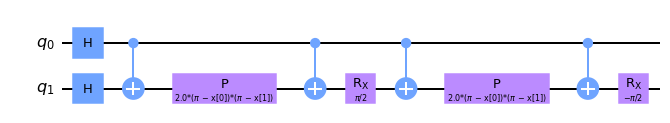


Quantum kernel matrices:



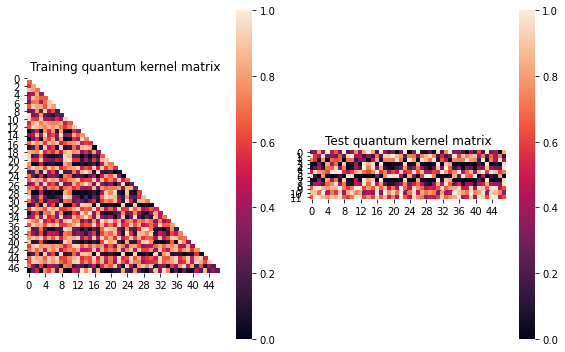


SVM with quantum kernel trained!


Test set performance:


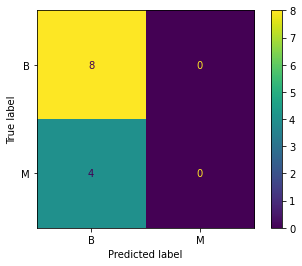

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.001725376281668356
metric(s) 2: (00, 10, 11) = (0.55769599865227, 0.5534831386964368, 0.545819526177267)
metric 3: 0.0


----> Kernel construction duration: 00:01:07


Combination 139/200
(Current range: 19/20)
			 reps : 2
			 paulis : ['Z', 'Z']
			 entanglement : linear

Feature map:


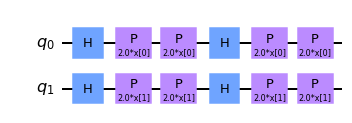


Quantum kernel matrices:



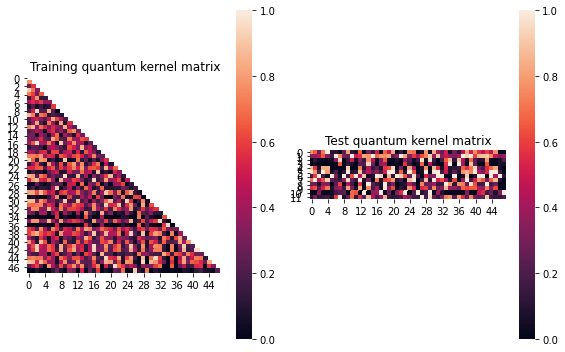


SVM with quantum kernel trained!


Test set performance:


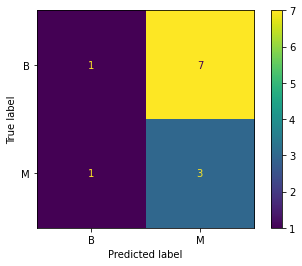

              precision    recall  f1-score   support

           B       0.50      0.12      0.20         8
           M       0.30      0.75      0.43         4

    accuracy                           0.33        12
   macro avg       0.40      0.44      0.31        12
weighted avg       0.43      0.33      0.28        12


metric 1: 0.016622752507668037
metric(s) 2: (00, 10, 11) = (0.4067460641926757, 0.38005139206048283, 0.386602224943626)
metric 3: -1.4440607321085833e-298


----> Kernel construction duration: 00:00:32


Combination 140/200
(Current range: 20/20)
			 reps : 2
			 paulis : ['YX', 'X']
			 entanglement : linear

Feature map:


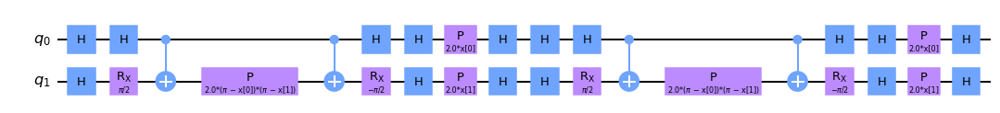


Quantum kernel matrices:



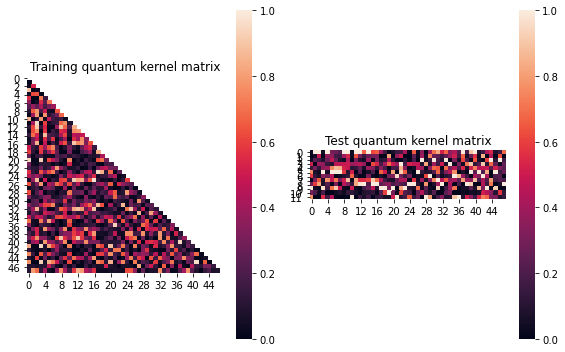


SVM with quantum kernel trained!


Test set performance:


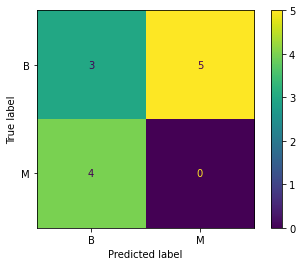

              precision    recall  f1-score   support

           B       0.43      0.38      0.40         8
           M       0.00      0.00      0.00         4

    accuracy                           0.25        12
   macro avg       0.21      0.19      0.20        12
weighted avg       0.29      0.25      0.27        12


metric 1: 0.013075088433363191
metric(s) 2: (00, 10, 11) = (0.3056902929933329, 0.28046746958768115, 0.28139482304875585)
metric 3: 1.672033170632285e-259


----> Kernel construction duration: 00:01:34


In [17]:
j=6
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 141/200
(Current range: 1/20)
			 reps : 1
			 paulis : ['X', 'YZ']
			 entanglement : linear

Feature map:


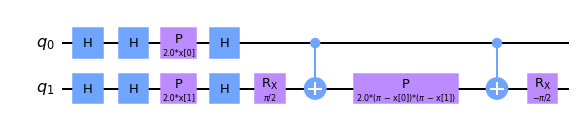


Quantum kernel matrices:



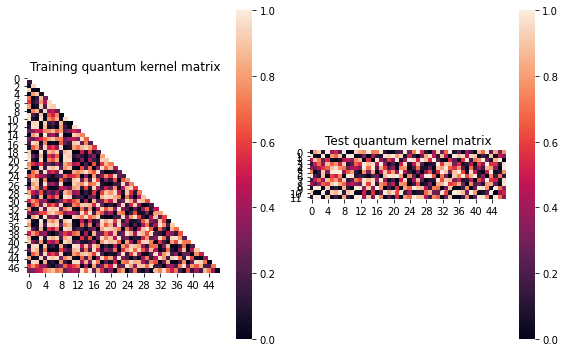


SVM with quantum kernel trained!


Test set performance:


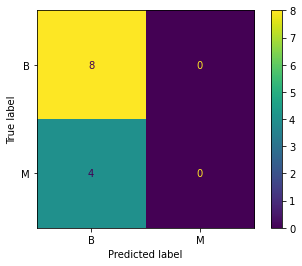

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:46


Combination 142/200
(Current range: 2/20)
			 reps : 1
			 paulis : ['XZ', 'Z']
			 entanglement : linear

Feature map:


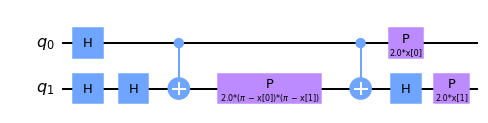


Quantum kernel matrices:



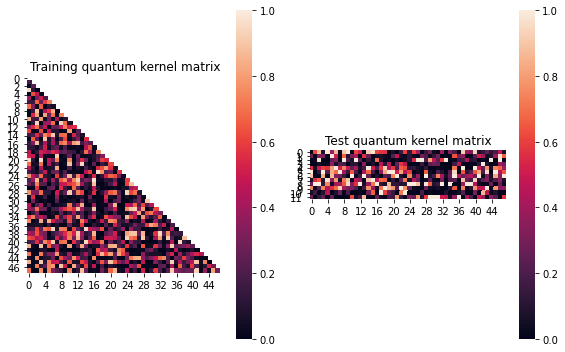


SVM with quantum kernel trained!


Test set performance:


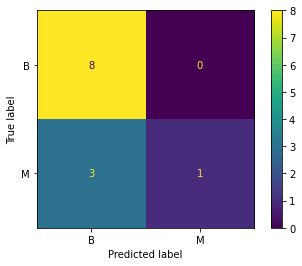

              precision    recall  f1-score   support

           B       0.73      1.00      0.84         8
           M       1.00      0.25      0.40         4

    accuracy                           0.75        12
   macro avg       0.86      0.62      0.62        12
weighted avg       0.82      0.75      0.69        12


metric 1: 0.022231153237327717
metric(s) 2: (00, 10, 11) = (0.31779773381985454, 0.29096621300019965, 0.30859699865520024)
metric 3: 0.0


----> Kernel construction duration: 00:00:52


Combination 143/200
(Current range: 3/20)
			 reps : 2
			 paulis : ['Z']
			 entanglement : linear

Feature map:


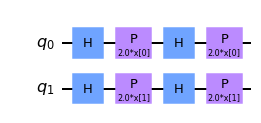


Quantum kernel matrices:



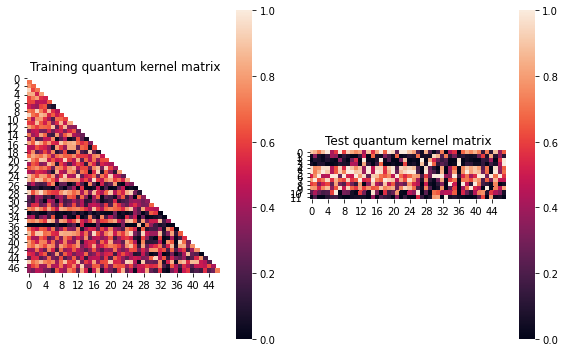


SVM with quantum kernel trained!


Test set performance:


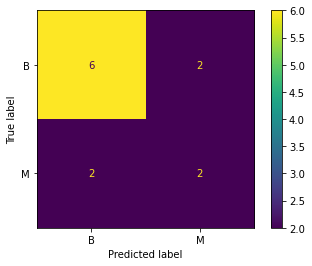

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.04093812056554735
metric(s) 2: (00, 10, 11) = (0.5372847733056034, 0.4452082949225029, 0.43500805767049716)
metric 3: 4.328972990428254e-271


----> Kernel construction duration: 00:00:30


Combination 144/200
(Current range: 4/20)
			 reps : 2
			 paulis : ['Y', 'ZX']
			 entanglement : linear

Feature map:


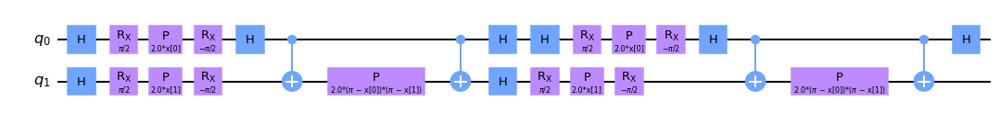


Quantum kernel matrices:



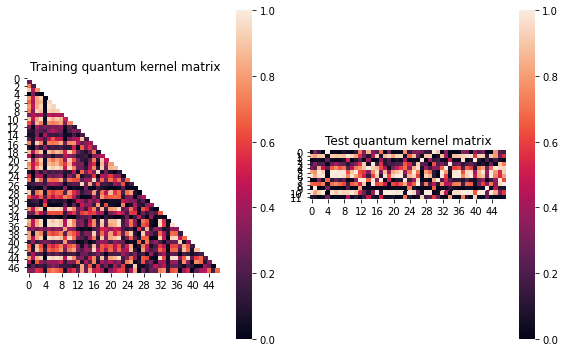


SVM with quantum kernel trained!


Test set performance:


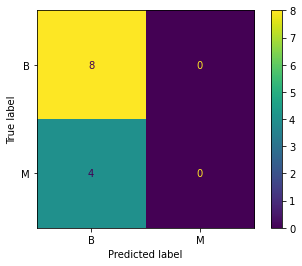

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.014288908498095054
metric(s) 2: (00, 10, 11) = (0.4307510892712024, 0.3989737963075317, 0.39577432034005117)
metric 3: 7.278571664462997e-272


----> Kernel construction duration: 00:01:34


Combination 145/200
(Current range: 5/20)
			 reps : 3
			 paulis : ['ZZ', 'YZ']
			 entanglement : linear

Feature map:


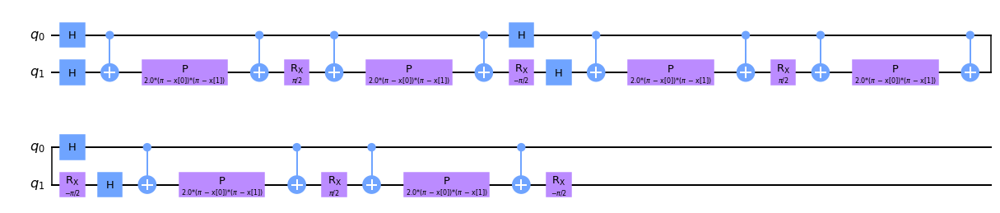


Quantum kernel matrices:



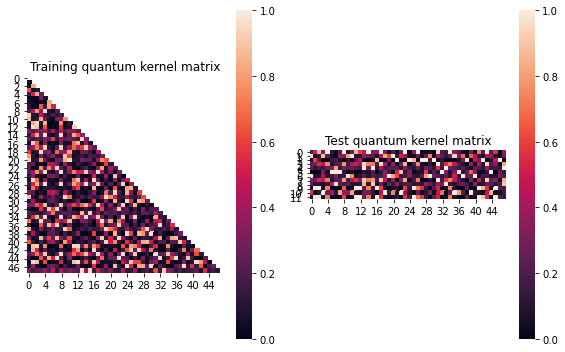


SVM with quantum kernel trained!


Test set performance:


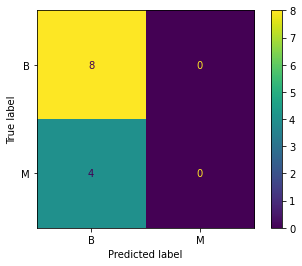

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.018901384139480115
metric(s) 2: (00, 10, 11) = (0.33259764761005856, 0.3109026299855174, 0.3270103806399364)
metric 3: -2.5827288256249085e-307


----> Kernel construction duration: 00:03:02


Combination 146/200
(Current range: 6/20)
			 reps : 2
			 paulis : ['XY']
			 entanglement : linear

Feature map:


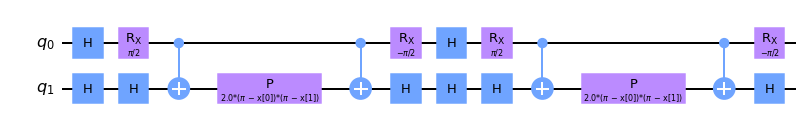


Quantum kernel matrices:



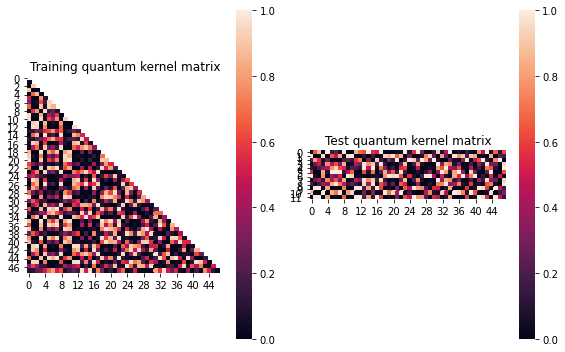


SVM with quantum kernel trained!


Test set performance:


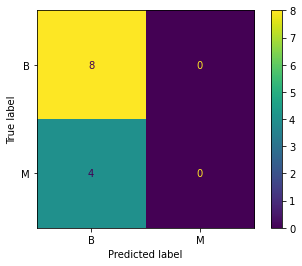

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:12


Combination 147/200
(Current range: 7/20)
			 reps : 1
			 paulis : ['YX', 'XZ']
			 entanglement : linear

Feature map:


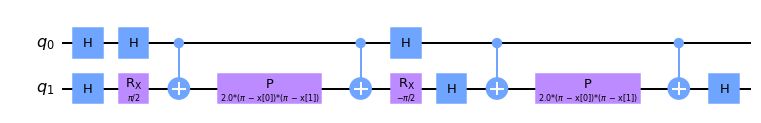


Quantum kernel matrices:



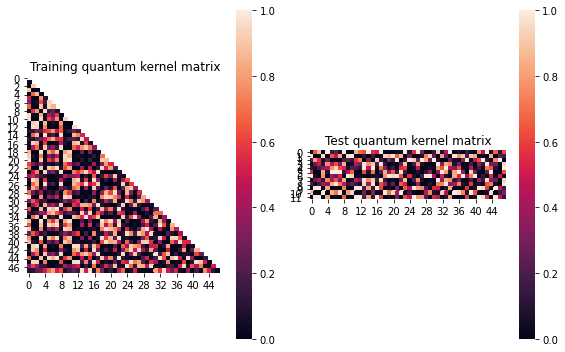


SVM with quantum kernel trained!


Test set performance:


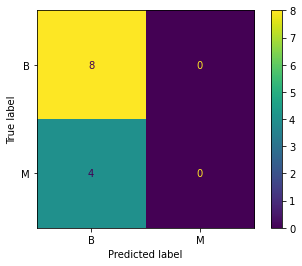

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 148/200
(Current range: 8/20)
			 reps : 2
			 paulis : ['ZZ', 'ZY']
			 entanglement : linear

Feature map:


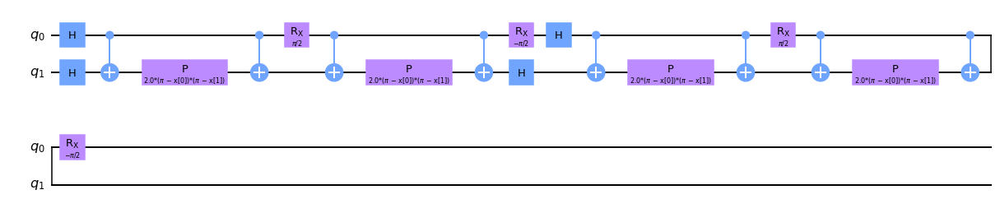


Quantum kernel matrices:



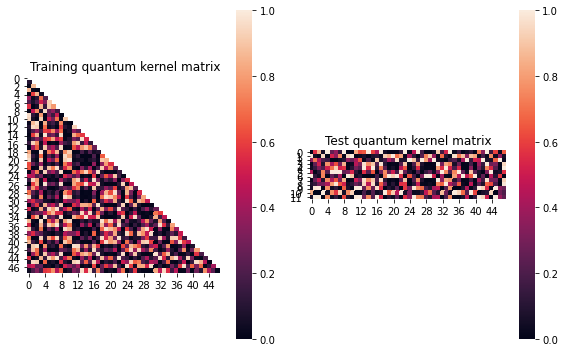


SVM with quantum kernel trained!


Test set performance:


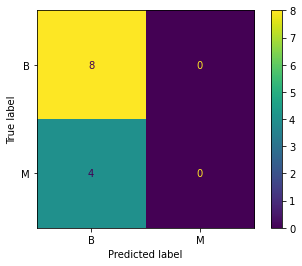

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013047293402184912
metric(s) 2: (00, 10, 11) = (0.3781336952705938, 0.36648333857335724, 0.3809275686804905)
metric 3: 0.0


----> Kernel construction duration: 00:02:05


Combination 149/200
(Current range: 9/20)
			 reps : 2
			 paulis : ['YZ', 'YX']
			 entanglement : linear

Feature map:


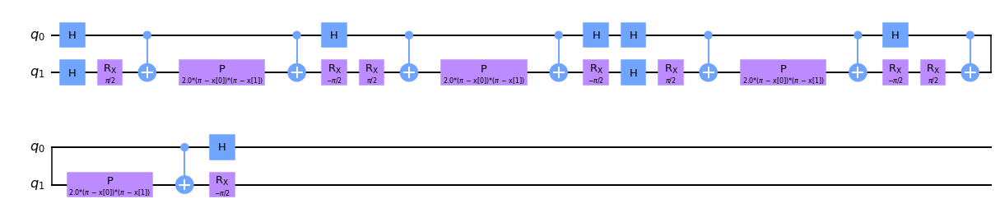


Quantum kernel matrices:



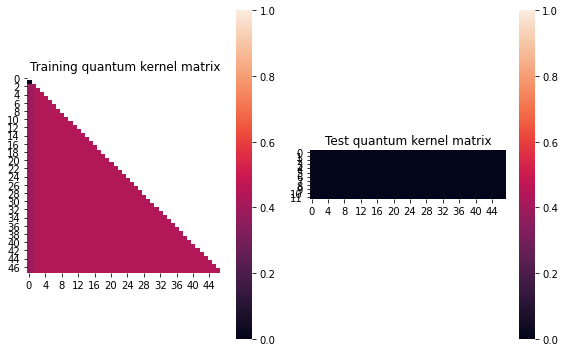


SVM with quantum kernel trained!


Test set performance:


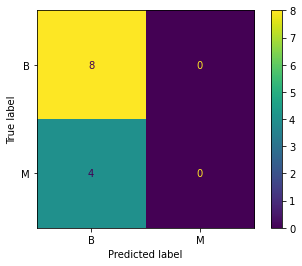

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.0037499999999999756
metric(s) 2: (00, 10, 11) = (0.43875, 0.434375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:01:59


Combination 150/200
(Current range: 10/20)
			 reps : 2
			 paulis : ['ZX', 'YZ']
			 entanglement : linear

Feature map:


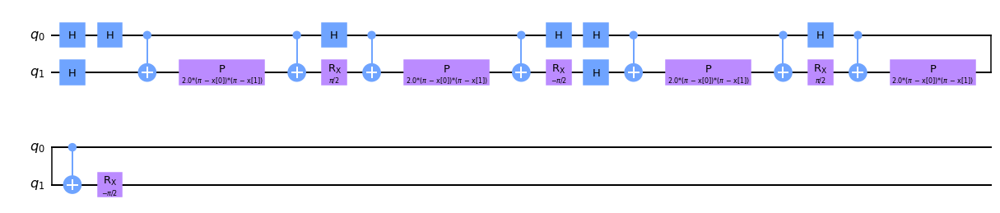


Quantum kernel matrices:



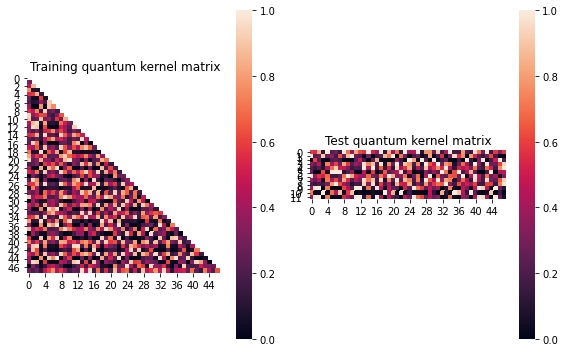


SVM with quantum kernel trained!


Test set performance:


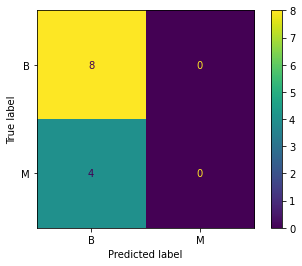

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.023602554074856952
metric(s) 2: (00, 10, 11) = (0.4302845776651415, 0.39300137782713696, 0.4029232861388463)
metric 3: 0.0


----> Kernel construction duration: 00:02:06


Combination 151/200
(Current range: 11/20)
			 reps : 3
			 paulis : ['Z', 'YZ']
			 entanglement : linear

Feature map:


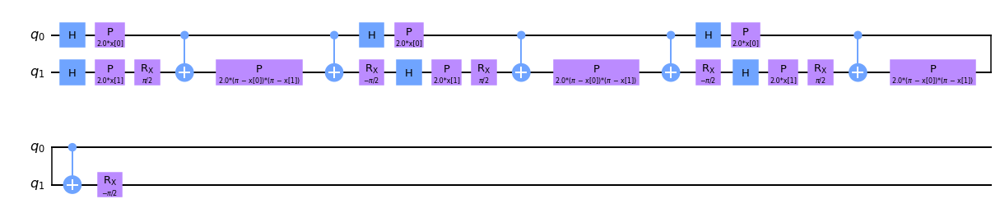


Quantum kernel matrices:



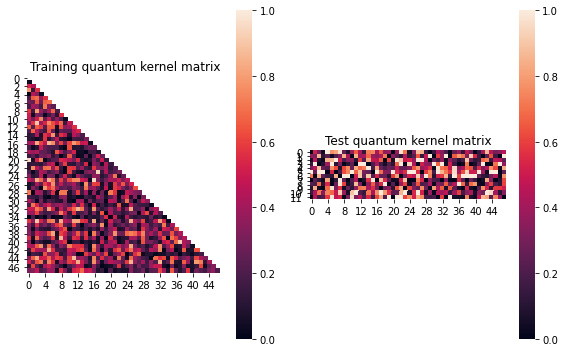


SVM with quantum kernel trained!


Test set performance:


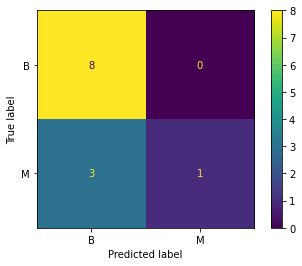

              precision    recall  f1-score   support

           B       0.73      1.00      0.84         8
           M       1.00      0.25      0.40         4

    accuracy                           0.75        12
   macro avg       0.86      0.62      0.62        12
weighted avg       0.82      0.75      0.69        12


metric 1: 0.014515532208703719
metric(s) 2: (00, 10, 11) = (0.34995994267735125, 0.32216278372217944, 0.32339668918441505)
metric 3: 8.980948176446503e-268


----> Kernel construction duration: 00:02:13


Combination 152/200
(Current range: 12/20)
			 reps : 1
			 paulis : ['XZ', 'YX']
			 entanglement : linear

Feature map:


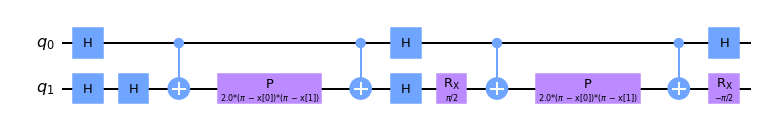


Quantum kernel matrices:



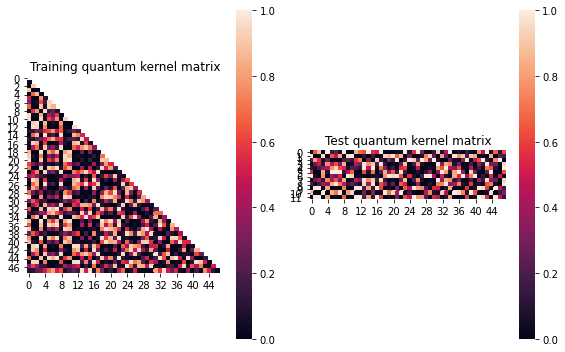


SVM with quantum kernel trained!


Test set performance:


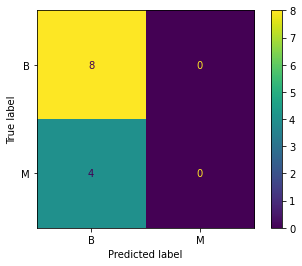

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:08


Combination 153/200
(Current range: 13/20)
			 reps : 1
			 paulis : ['YZ', 'YX']
			 entanglement : linear

Feature map:


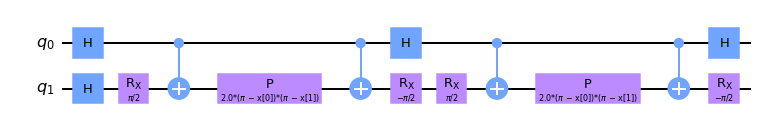


Quantum kernel matrices:



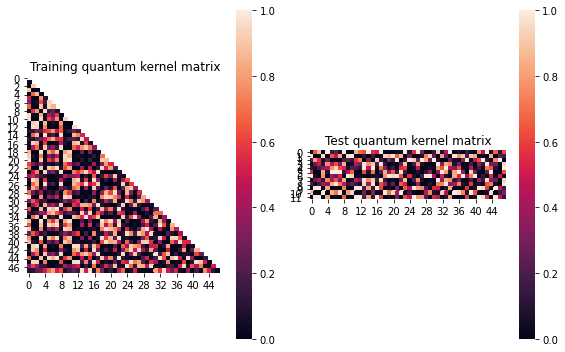


SVM with quantum kernel trained!


Test set performance:


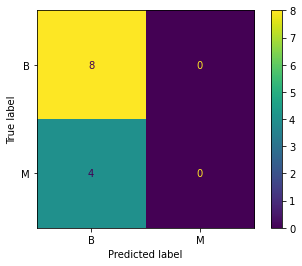

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:08


Combination 154/200
(Current range: 14/20)
			 reps : 2
			 paulis : ['XX']
			 entanglement : linear

Feature map:


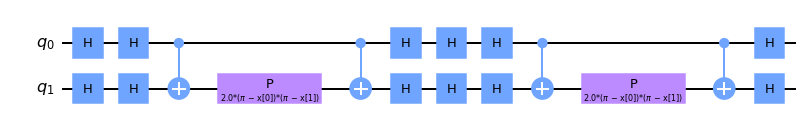


Quantum kernel matrices:



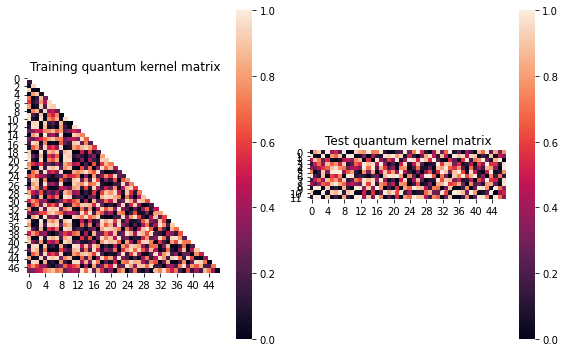


SVM with quantum kernel trained!


Test set performance:


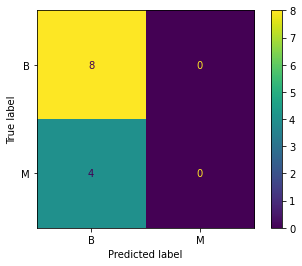

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:57


Combination 155/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['ZX', 'X']
			 entanglement : linear

Feature map:


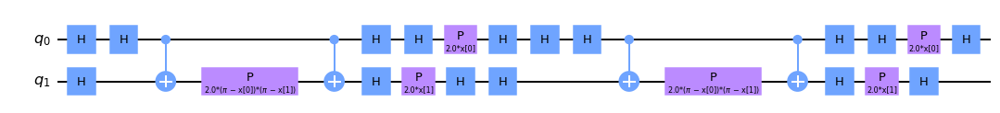


Quantum kernel matrices:



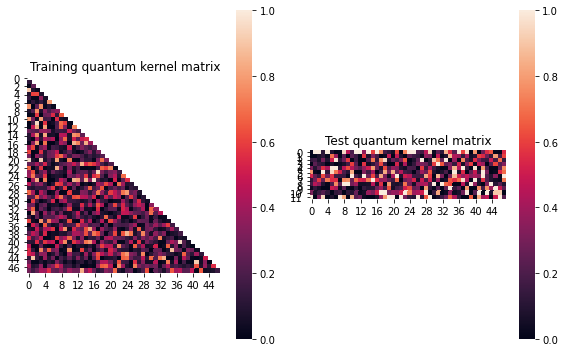


SVM with quantum kernel trained!


Test set performance:


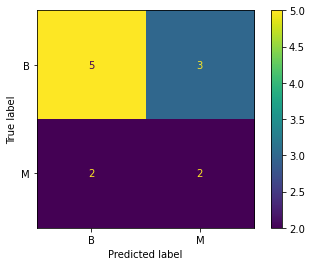

              precision    recall  f1-score   support

           B       0.71      0.62      0.67         8
           M       0.40      0.50      0.44         4

    accuracy                           0.58        12
   macro avg       0.56      0.56      0.56        12
weighted avg       0.61      0.58      0.59        12


metric 1: 0.044264414420131515
metric(s) 2: (00, 10, 11) = (0.3097563175450913, 0.2509650807397336, 0.28070267277463895)
metric 3: -5.091054154701182e-270


----> Kernel construction duration: 00:01:31


Combination 156/200
(Current range: 16/20)
			 reps : 1
			 paulis : ['ZY', 'X']
			 entanglement : linear

Feature map:


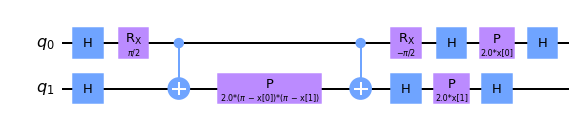


Quantum kernel matrices:



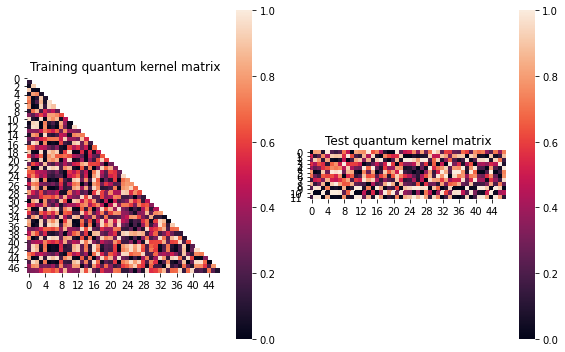


SVM with quantum kernel trained!


Test set performance:


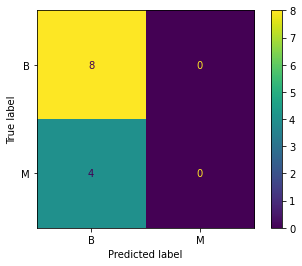

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.007097003157847559
metric(s) 2: (00, 10, 11) = (0.4746397801522789, 0.4750345271028863, 0.48962328036918873)
metric 3: 0.0


----> Kernel construction duration: 00:01:05


Combination 157/200
(Current range: 17/20)
			 reps : 1
			 paulis : ['ZX', 'Y']
			 entanglement : linear

Feature map:


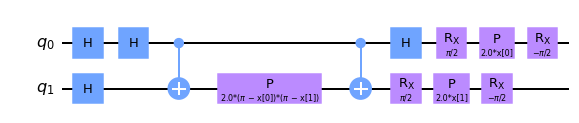


Quantum kernel matrices:



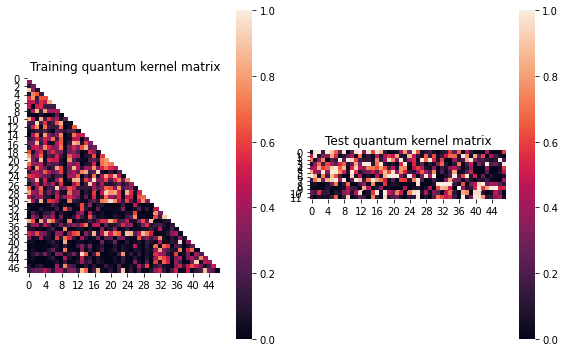


SVM with quantum kernel trained!


Test set performance:


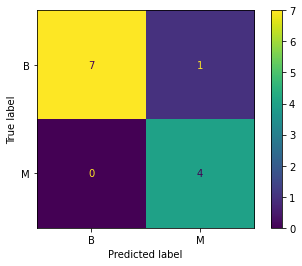

              precision    recall  f1-score   support

           B       1.00      0.88      0.93         8
           M       0.80      1.00      0.89         4

    accuracy                           0.92        12
   macro avg       0.90      0.94      0.91        12
weighted avg       0.93      0.92      0.92        12


metric 1: 0.14189402599779147
metric(s) 2: (00, 10, 11) = (0.3695345287350798, 0.1770426292417613, 0.26833878174402576)
metric 3: 6.065659095925149e-291


----> Kernel construction duration: 00:00:54


Combination 158/200
(Current range: 18/20)
			 reps : 1
			 paulis : ['Z', 'YY']
			 entanglement : linear

Feature map:


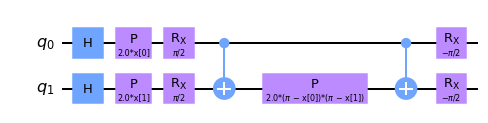


Quantum kernel matrices:



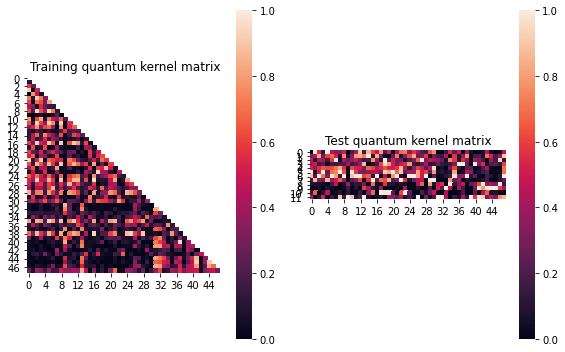


SVM with quantum kernel trained!


Test set performance:


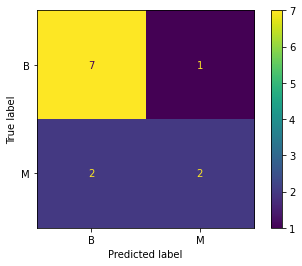

              precision    recall  f1-score   support

           B       0.78      0.88      0.82         8
           M       0.67      0.50      0.57         4

    accuracy                           0.75        12
   macro avg       0.72      0.69      0.70        12
weighted avg       0.74      0.75      0.74        12


metric 1: 0.13025630167870697
metric(s) 2: (00, 10, 11) = (0.37580278569064207, 0.19274200672795702, 0.27019383112268586)
metric 3: -6.531601427942518e-261


----> Kernel construction duration: 00:00:51


Combination 159/200
(Current range: 19/20)
			 reps : 2
			 paulis : ['Y']
			 entanglement : linear

Feature map:


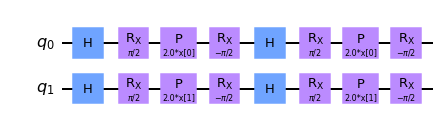


Quantum kernel matrices:



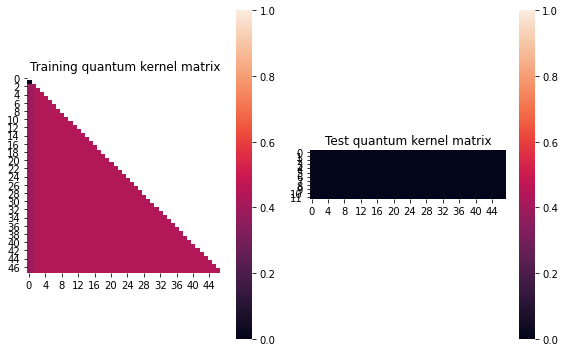


SVM with quantum kernel trained!


Test set performance:


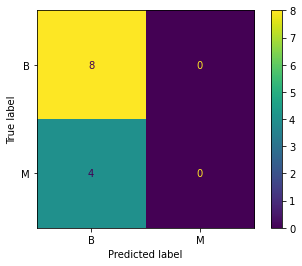

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.0037499999999999756
metric(s) 2: (00, 10, 11) = (0.43875, 0.434375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:20


Combination 160/200
(Current range: 20/20)
			 reps : 3
			 paulis : ['YY', 'ZY']
			 entanglement : linear

Feature map:


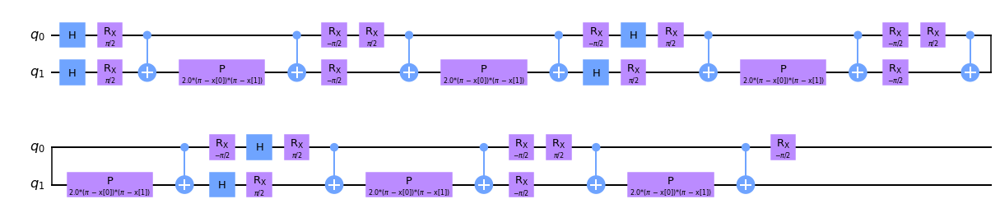


Quantum kernel matrices:



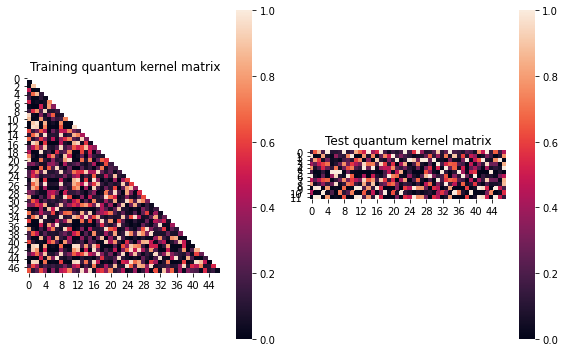


SVM with quantum kernel trained!


Test set performance:


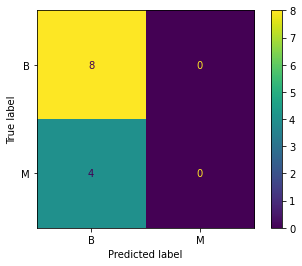

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013679743141357725
metric(s) 2: (00, 10, 11) = (0.3420060762299622, 0.3233970596502625, 0.33214752935327824)
metric 3: -2.604e-321


----> Kernel construction duration: 00:03:09


In [18]:
j=7
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 161/200
(Current range: 1/20)
			 reps : 2
			 paulis : ['Z', 'XY']
			 entanglement : linear

Feature map:


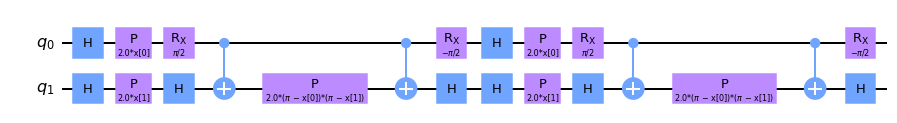


Quantum kernel matrices:



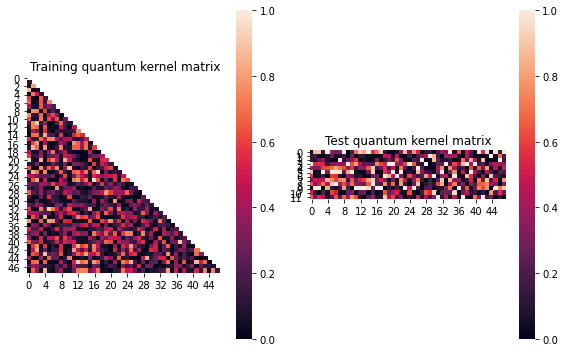


SVM with quantum kernel trained!


Test set performance:


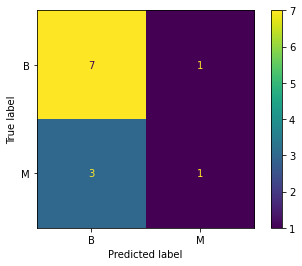

              precision    recall  f1-score   support

           B       0.70      0.88      0.78         8
           M       0.50      0.25      0.33         4

    accuracy                           0.67        12
   macro avg       0.60      0.56      0.56        12
weighted avg       0.63      0.67      0.63        12


metric 1: 0.018543748648197134
metric(s) 2: (00, 10, 11) = (0.31556322024901623, 0.27872732053323535, 0.27897891811384873)
metric 3: 8.80088302972652e-243


----> Kernel construction duration: 00:01:33


Combination 162/200
(Current range: 2/20)
			 reps : 3
			 paulis : ['ZX', 'ZZ']
			 entanglement : linear

Feature map:


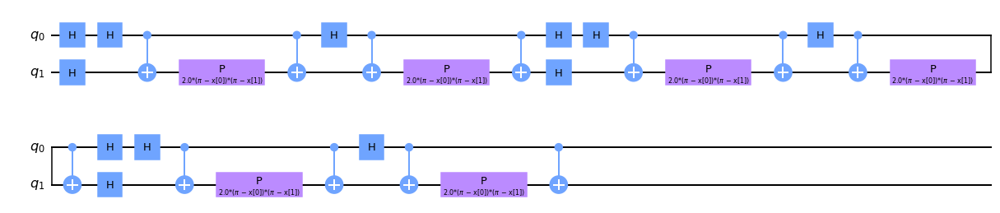


Quantum kernel matrices:



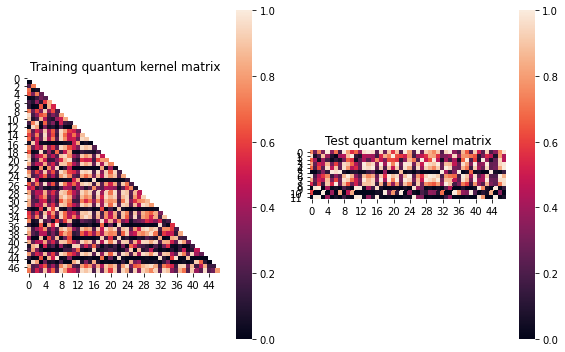


SVM with quantum kernel trained!


Test set performance:


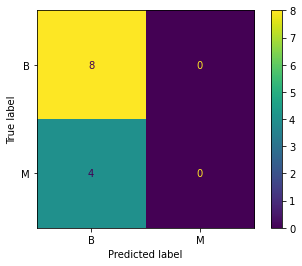

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.029458549484345065
metric(s) 2: (00, 10, 11) = (0.47165973773459263, 0.44748454926355014, 0.4822264597611978)
metric 3: 0.0


----> Kernel construction duration: 00:02:29


Combination 163/200
(Current range: 3/20)
			 reps : 2
			 paulis : ['ZZ', 'YZ']
			 entanglement : linear

Feature map:


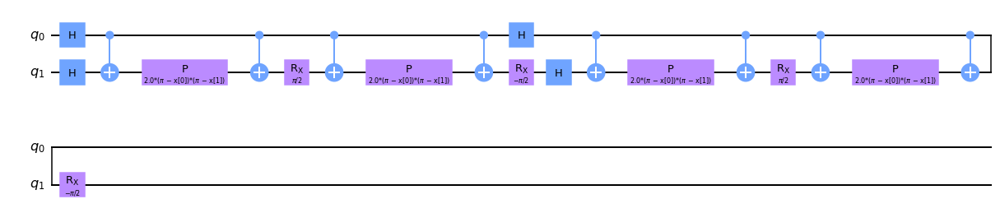


Quantum kernel matrices:



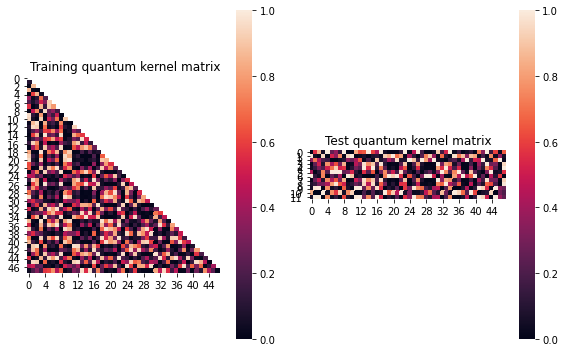


SVM with quantum kernel trained!


Test set performance:


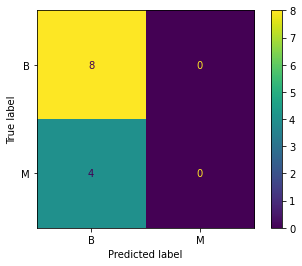

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013047293402184912
metric(s) 2: (00, 10, 11) = (0.3781336952705938, 0.36648333857335724, 0.3809275686804905)
metric 3: 0.0


----> Kernel construction duration: 00:02:04


Combination 164/200
(Current range: 4/20)
			 reps : 1
			 paulis : ['ZZ', 'Y']
			 entanglement : linear

Feature map:


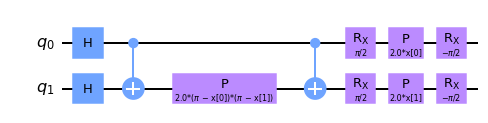


Quantum kernel matrices:



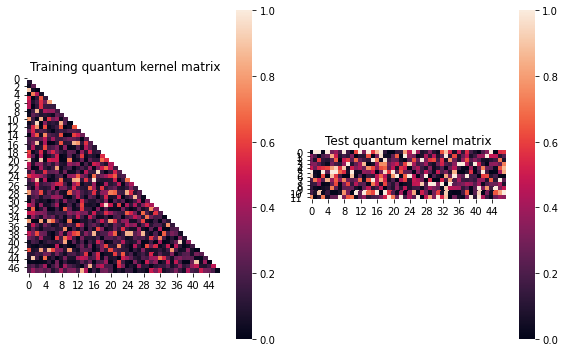


SVM with quantum kernel trained!


Test set performance:


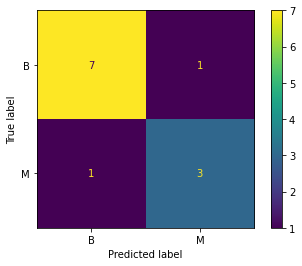

              precision    recall  f1-score   support

           B       0.88      0.88      0.88         8
           M       0.75      0.75      0.75         4

    accuracy                           0.83        12
   macro avg       0.81      0.81      0.81        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.056802919013524245
metric(s) 2: (00, 10, 11) = (0.290141965866011, 0.2190216036546117, 0.261507079470261)
metric 3: -6.337883261999194e-286


----> Kernel construction duration: 00:01:06


Combination 165/200
(Current range: 5/20)
			 reps : 3
			 paulis : ['ZY', 'X']
			 entanglement : linear

Feature map:


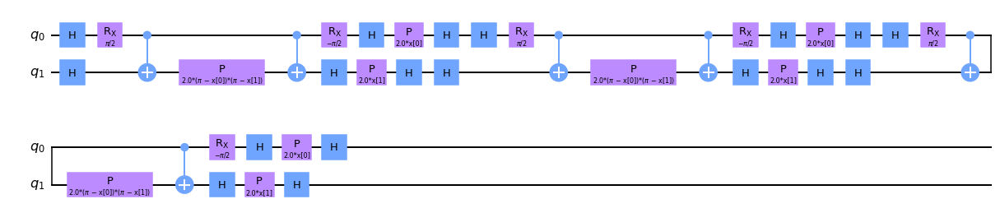


Quantum kernel matrices:



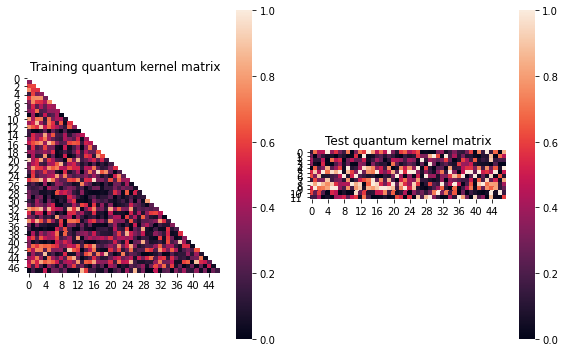


SVM with quantum kernel trained!


Test set performance:


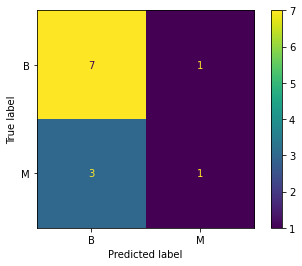

              precision    recall  f1-score   support

           B       0.70      0.88      0.78         8
           M       0.50      0.25      0.33         4

    accuracy                           0.67        12
   macro avg       0.60      0.56      0.56        12
weighted avg       0.63      0.67      0.63        12


metric 1: 0.022417413166898492
metric(s) 2: (00, 10, 11) = (0.3584328995012349, 0.3043388628050467, 0.29507965244265544)
metric 3: -3.1893071786466707e-268


----> Kernel construction duration: 00:02:28


Combination 166/200
(Current range: 6/20)
			 reps : 1
			 paulis : ['X', 'XZ']
			 entanglement : linear

Feature map:


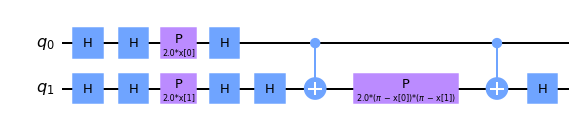


Quantum kernel matrices:



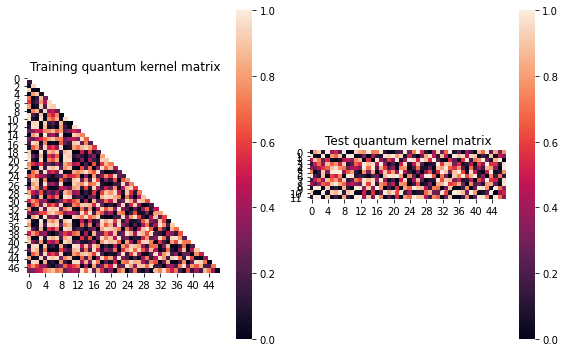


SVM with quantum kernel trained!


Test set performance:


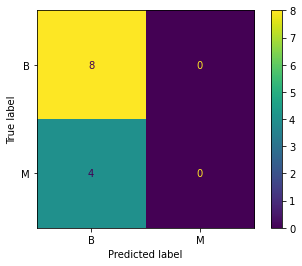

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:44


Combination 167/200
(Current range: 7/20)
			 reps : 1
			 paulis : ['X']
			 entanglement : linear

Feature map:


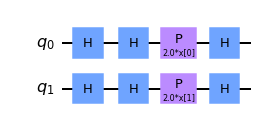


Quantum kernel matrices:



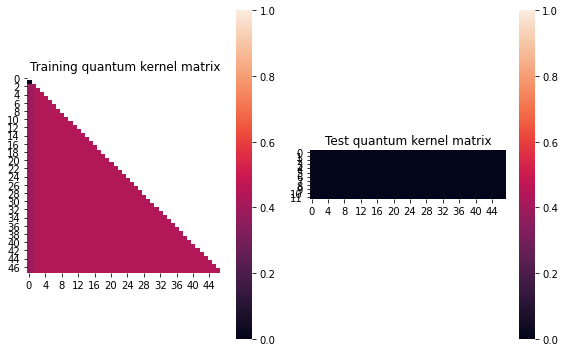


SVM with quantum kernel trained!


Test set performance:


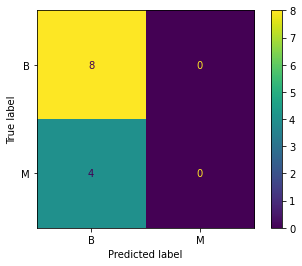

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.0037499999999999756
metric(s) 2: (00, 10, 11) = (0.43875, 0.434375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:24


Combination 168/200
(Current range: 8/20)
			 reps : 3
			 paulis : ['ZY', 'ZY']
			 entanglement : linear

Feature map:


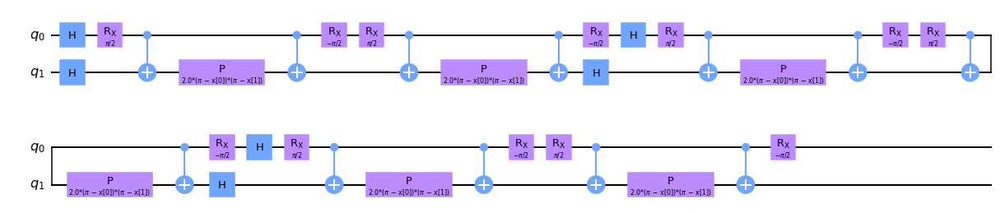


Quantum kernel matrices:



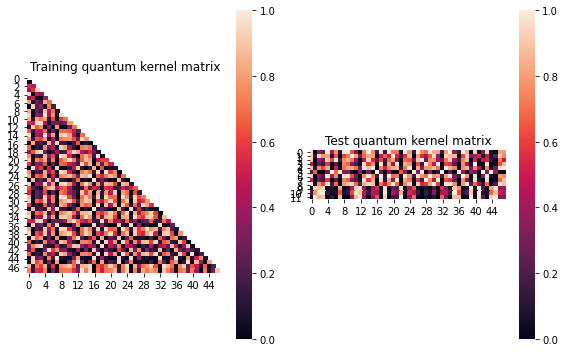


SVM with quantum kernel trained!


Test set performance:


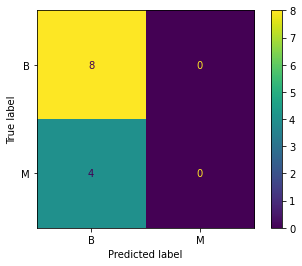

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.012190509825812046
metric(s) 2: (00, 10, 11) = (0.47733258533788553, 0.45971544426357136, 0.4664793228408812)
metric 3: -0.0


----> Kernel construction duration: 00:02:07


Combination 169/200
(Current range: 9/20)
			 reps : 3
			 paulis : ['XY', 'XX']
			 entanglement : linear

Feature map:


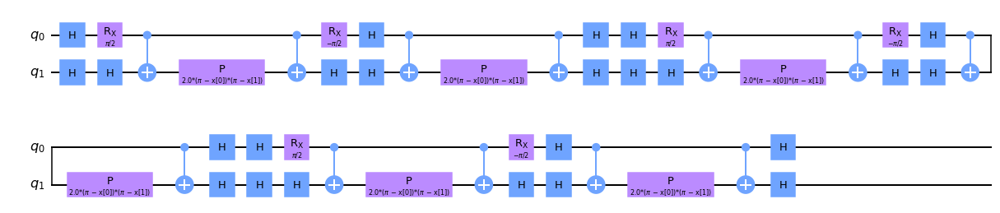


Quantum kernel matrices:



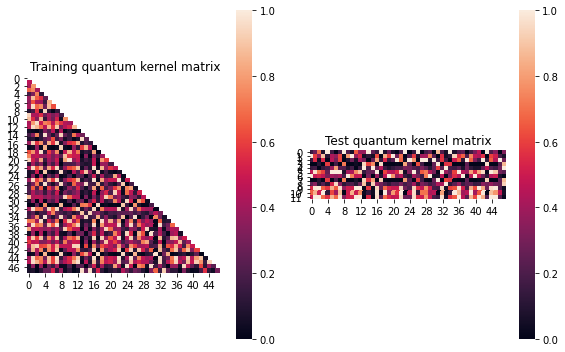


SVM with quantum kernel trained!


Test set performance:


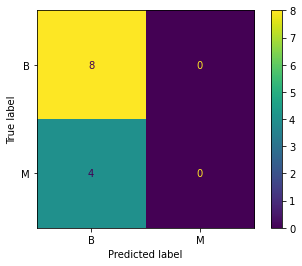

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013548059497797027
metric(s) 2: (00, 10, 11) = (0.41561852427879914, 0.40170342061205766, 0.4148844359409102)
metric 3: -1.1581915872108572e-306


----> Kernel construction duration: 00:02:52


Combination 170/200
(Current range: 10/20)
			 reps : 3
			 paulis : ['XZ', 'YZ']
			 entanglement : linear

Feature map:


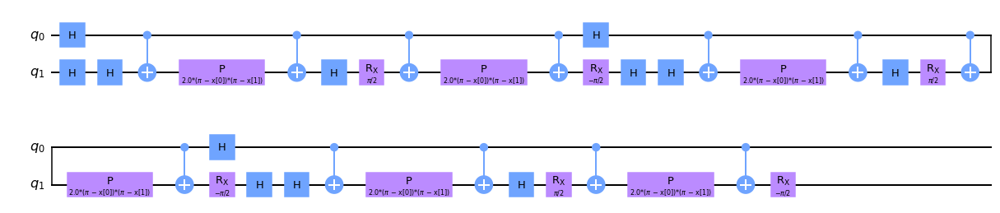


Quantum kernel matrices:



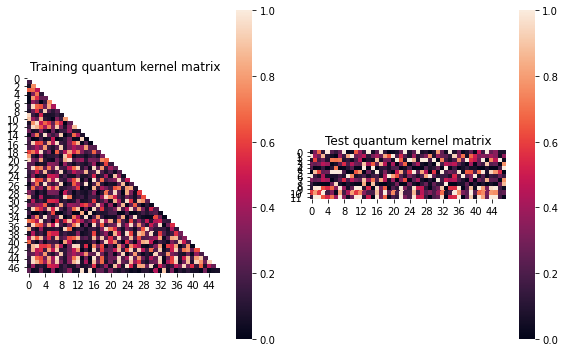


SVM with quantum kernel trained!


Test set performance:


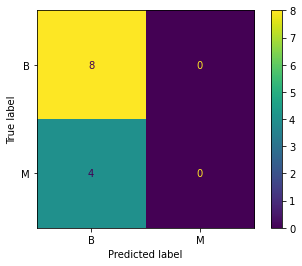

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011453245298826853
metric(s) 2: (00, 10, 11) = (0.3634057524277271, 0.3627323534644533, 0.3849654450988332)
metric 3: -6.271540455287794e-305


----> Kernel construction duration: 00:02:50


Combination 171/200
(Current range: 11/20)
			 reps : 1
			 paulis : ['XY', 'XZ']
			 entanglement : linear

Feature map:


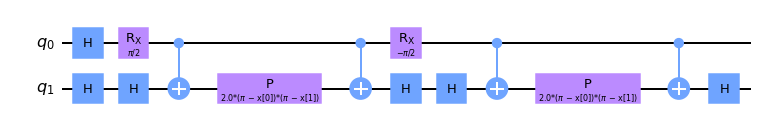


Quantum kernel matrices:



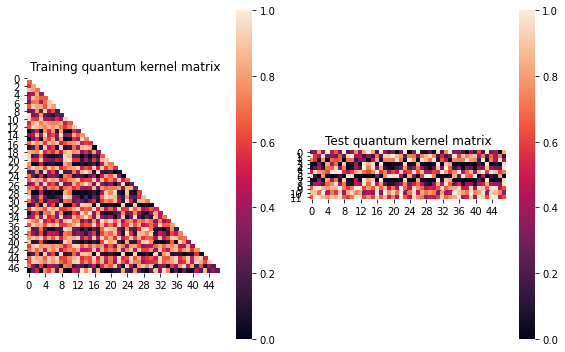


SVM with quantum kernel trained!


Test set performance:


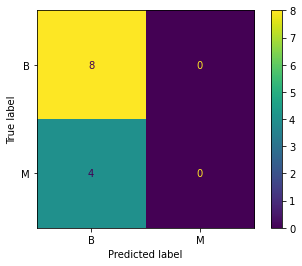

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.001725376281668356
metric(s) 2: (00, 10, 11) = (0.55769599865227, 0.5534831386964368, 0.545819526177267)
metric 3: 0.0


----> Kernel construction duration: 00:00:57


Combination 172/200
(Current range: 12/20)
			 reps : 3
			 paulis : ['X', 'XY']
			 entanglement : linear

Feature map:


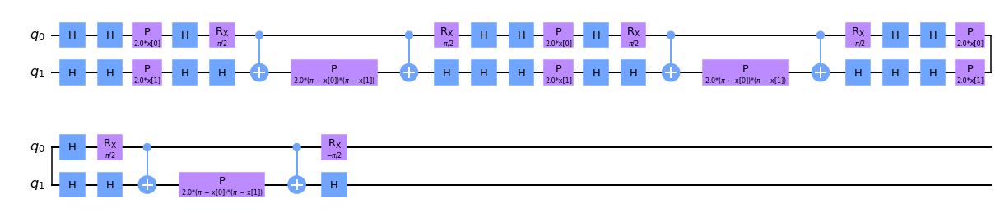


Quantum kernel matrices:



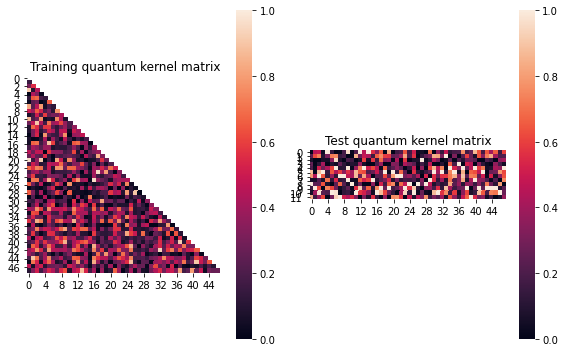


SVM with quantum kernel trained!


Test set performance:


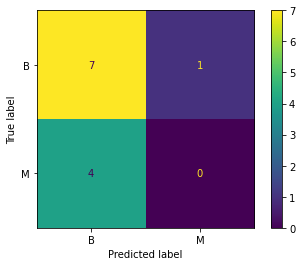

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: -0.0008595936923443959
metric(s) 2: (00, 10, 11) = (0.3201488200450415, 0.31865002416340876, 0.31543204089708715)
metric 3: -4.0794804683807894e-254


----> Kernel construction duration: 00:02:07


Combination 173/200
(Current range: 13/20)
			 reps : 3
			 paulis : ['Z', 'YY']
			 entanglement : linear

Feature map:


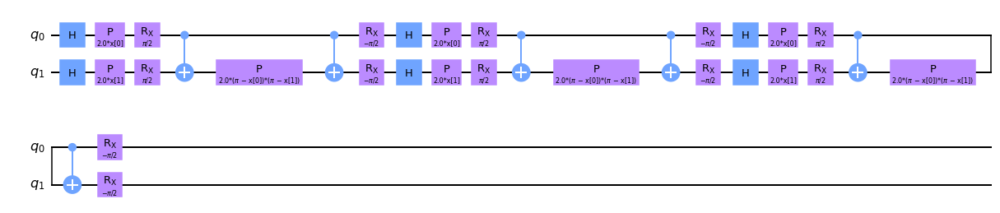


Quantum kernel matrices:



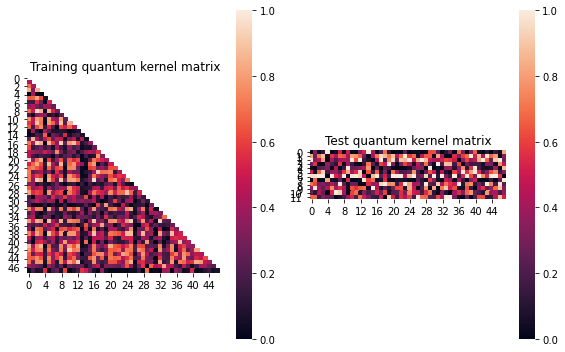


SVM with quantum kernel trained!


Test set performance:


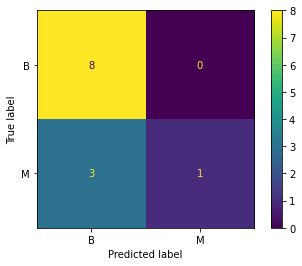

              precision    recall  f1-score   support

           B       0.73      1.00      0.84         8
           M       1.00      0.25      0.40         4

    accuracy                           0.75        12
   macro avg       0.86      0.62      0.62        12
weighted avg       0.82      0.75      0.69        12


metric 1: 0.031252655959943865
metric(s) 2: (00, 10, 11) = (0.4016158307400628, 0.36364144968789236, 0.3881723805556097)
metric 3: -3.5152565525546793e-268


----> Kernel construction duration: 00:02:19


Combination 174/200
(Current range: 14/20)
			 reps : 3
			 paulis : ['ZZ']
			 entanglement : linear

Feature map:


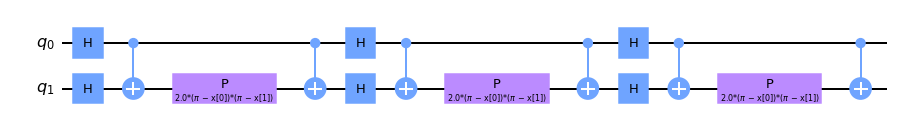


Quantum kernel matrices:



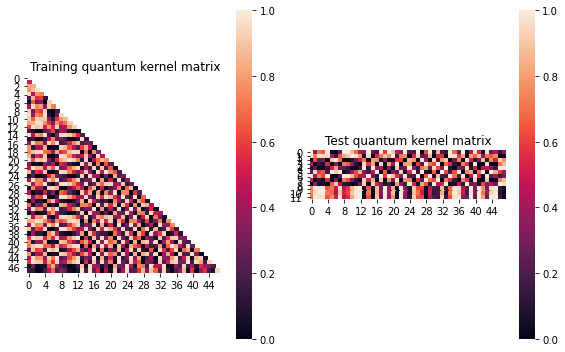


SVM with quantum kernel trained!


Test set performance:


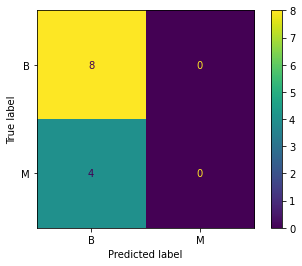

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:01:53


Combination 175/200
(Current range: 15/20)
			 reps : 2
			 paulis : ['XZ', 'YY']
			 entanglement : linear

Feature map:


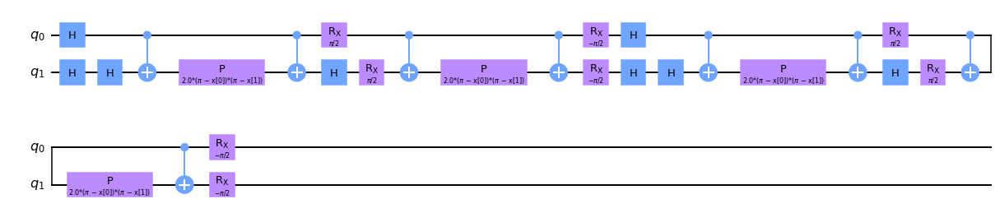


Quantum kernel matrices:



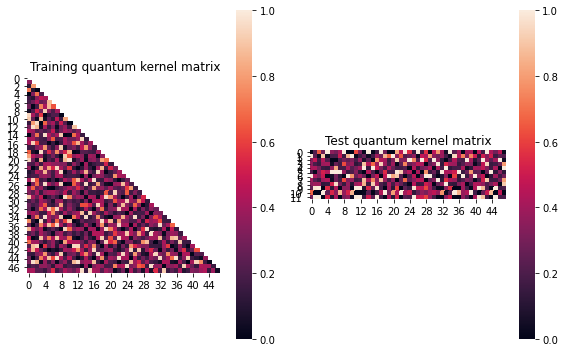


SVM with quantum kernel trained!


Test set performance:


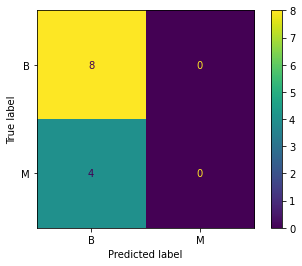

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.013070220061843607
metric(s) 2: (00, 10, 11) = (0.3705810321458343, 0.35959226304475056, 0.374743934067354)
metric 3: -0.0


----> Kernel construction duration: 00:02:18


Combination 176/200
(Current range: 16/20)
			 reps : 2
			 paulis : ['XX', 'Z']
			 entanglement : linear

Feature map:


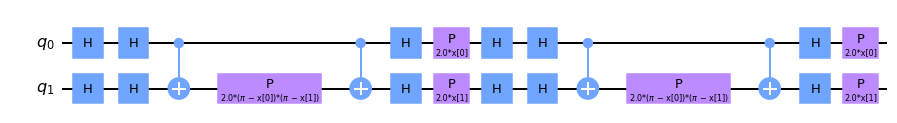


Quantum kernel matrices:



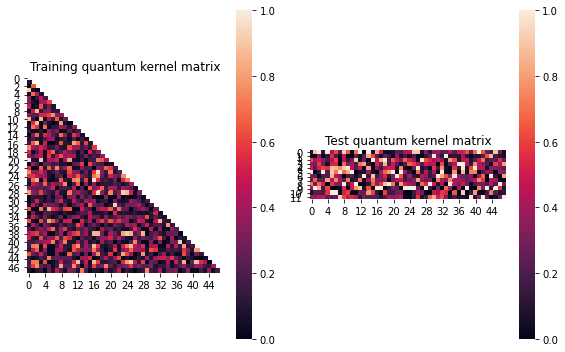


SVM with quantum kernel trained!


Test set performance:


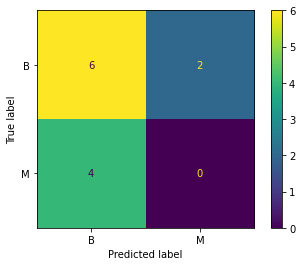

              precision    recall  f1-score   support

           B       0.60      0.75      0.67         8
           M       0.00      0.00      0.00         4

    accuracy                           0.50        12
   macro avg       0.30      0.38      0.33        12
weighted avg       0.40      0.50      0.44        12


metric 1: 0.02578377584316699
metric(s) 2: (00, 10, 11) = (0.31697973722727574, 0.27499620704967986, 0.28458022855841797)
metric 3: -2.457616086986517e-256


----> Kernel construction duration: 00:01:22


Combination 177/200
(Current range: 17/20)
			 reps : 1
			 paulis : ['YX', 'ZY']
			 entanglement : linear

Feature map:


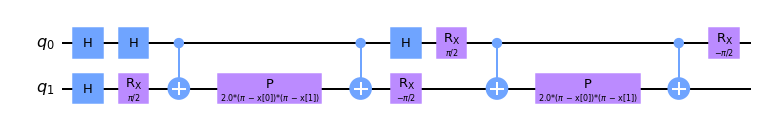


Quantum kernel matrices:



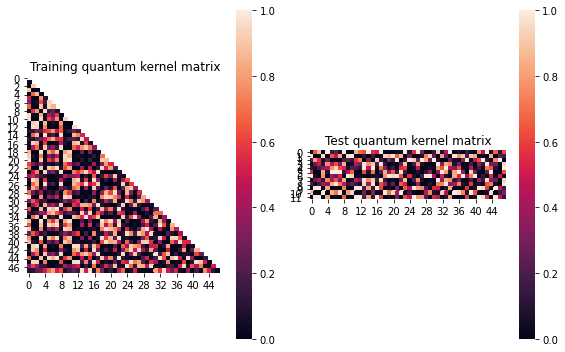


SVM with quantum kernel trained!


Test set performance:


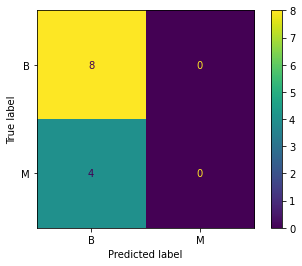

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:07


Combination 178/200
(Current range: 18/20)
			 reps : 2
			 paulis : ['XY', 'XX']
			 entanglement : linear

Feature map:


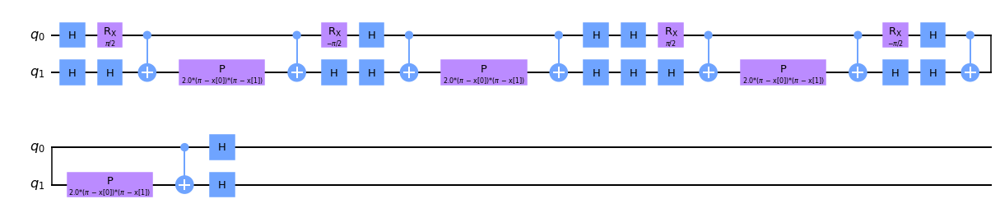


Quantum kernel matrices:



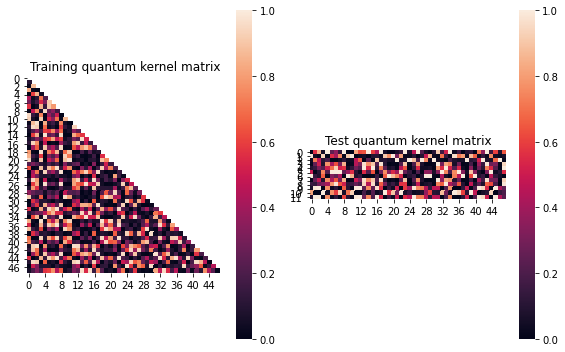


SVM with quantum kernel trained!


Test set performance:


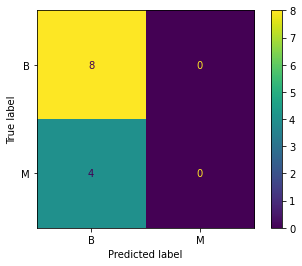

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006295586381343754
metric(s) 2: (00, 10, 11) = (0.3596554662653935, 0.34465982440861354, 0.3422553553145211)
metric 3: -9.4e-323


----> Kernel construction duration: 00:01:55


Combination 179/200
(Current range: 19/20)
			 reps : 3
			 paulis : ['ZX', 'XZ']
			 entanglement : linear

Feature map:


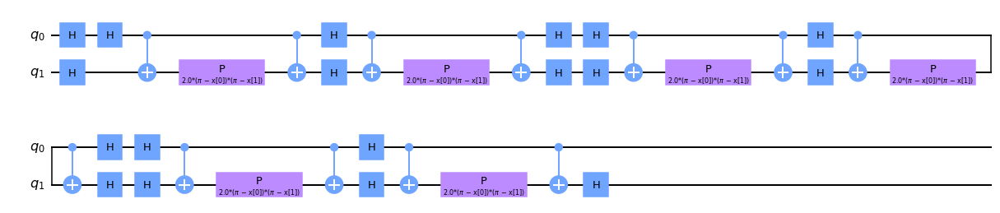


Quantum kernel matrices:



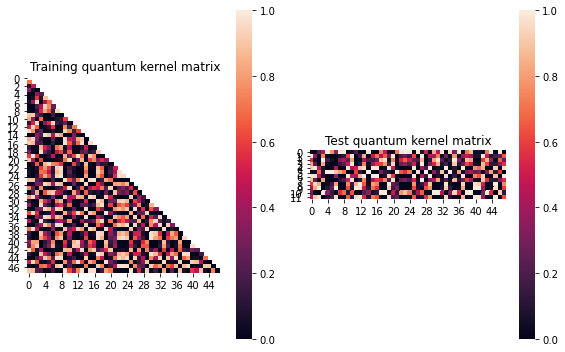


SVM with quantum kernel trained!


Test set performance:


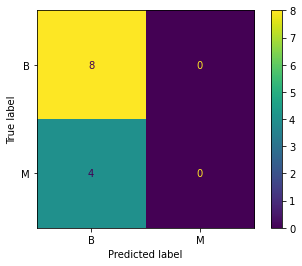

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.01522734682482002
metric(s) 2: (00, 10, 11) = (0.3762892232401834, 0.37306941302639013, 0.40030429646223686)
metric 3: 0.0


----> Kernel construction duration: 00:02:21


Combination 180/200
(Current range: 20/20)
			 reps : 1
			 paulis : ['XY', 'ZZ']
			 entanglement : linear

Feature map:


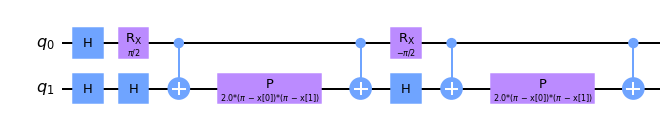


Quantum kernel matrices:



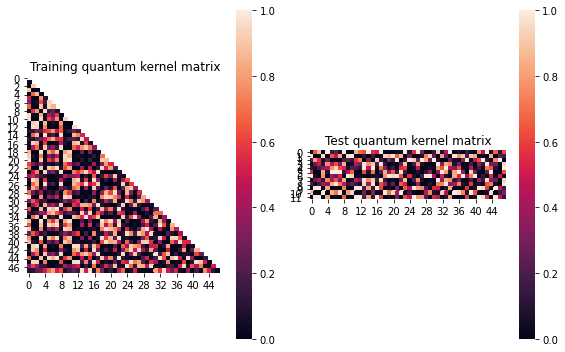


SVM with quantum kernel trained!


Test set performance:


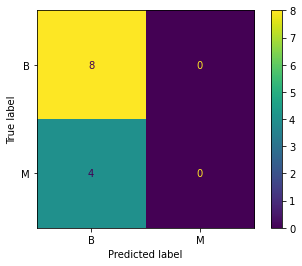

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:01:08


In [19]:
j=8
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 181/200
(Current range: 1/20)
			 reps : 1
			 paulis : ['ZX', 'XX']
			 entanglement : linear

Feature map:


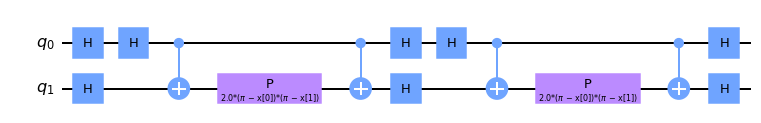


Quantum kernel matrices:



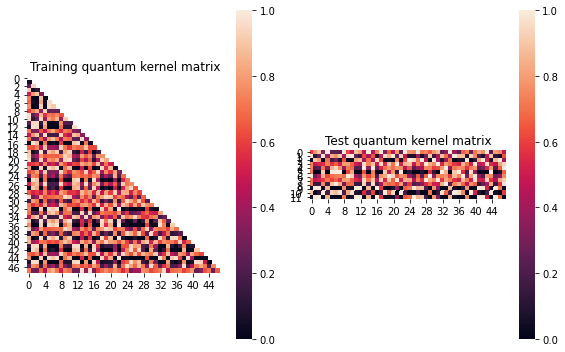


SVM with quantum kernel trained!


Test set performance:


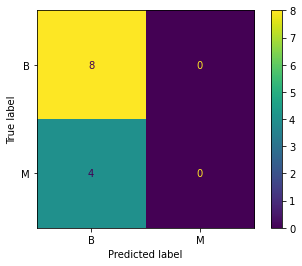

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.016900292320401578
metric(s) 2: (00, 10, 11) = (0.5334870881962694, 0.5144723992411098, 0.5292582949267531)
metric 3: 0.0


----> Kernel construction duration: 00:00:56


Combination 182/200
(Current range: 2/20)
			 reps : 3
			 paulis : ['X', 'ZX']
			 entanglement : linear

Feature map:


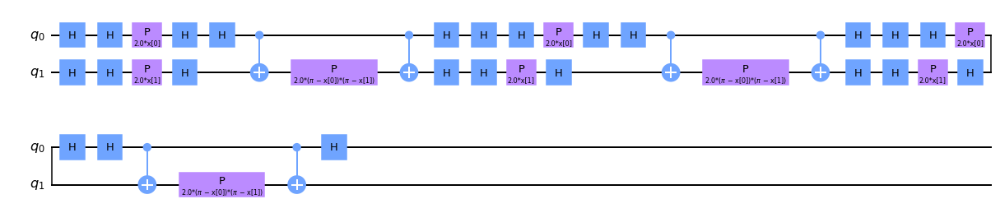


Quantum kernel matrices:



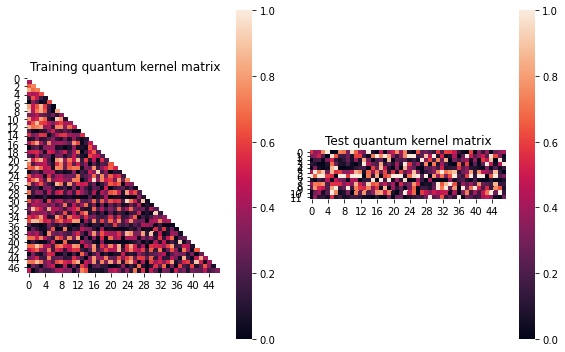


SVM with quantum kernel trained!


Test set performance:


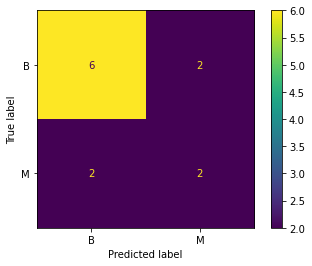

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.030360468799360052
metric(s) 2: (00, 10, 11) = (0.375143577730428, 0.32667347084378306, 0.3389243015558582)
metric 3: 2.5457997416823397e-267


----> Kernel construction duration: 00:02:02


Combination 183/200
(Current range: 3/20)
			 reps : 2
			 paulis : ['YX', 'Z']
			 entanglement : linear

Feature map:


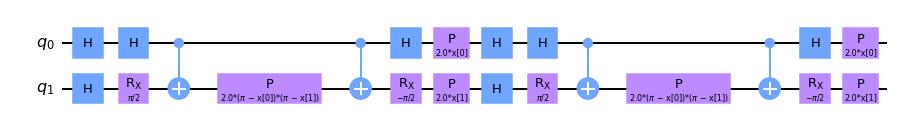


Quantum kernel matrices:



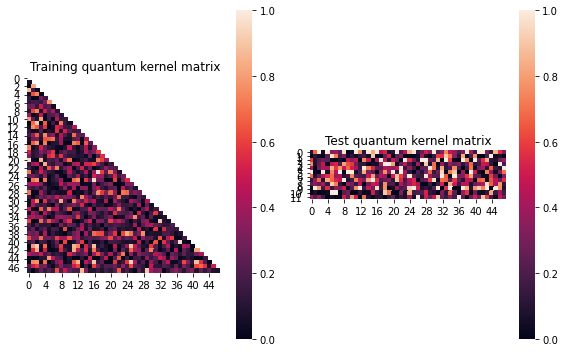


SVM with quantum kernel trained!


Test set performance:


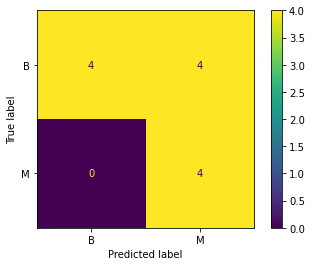

              precision    recall  f1-score   support

           B       1.00      0.50      0.67         8
           M       0.50      1.00      0.67         4

    accuracy                           0.67        12
   macro avg       0.75      0.75      0.67        12
weighted avg       0.83      0.67      0.67        12


metric 1: 0.02512278508740773
metric(s) 2: (00, 10, 11) = (0.2883158715901334, 0.25018061317099527, 0.26229092492667255)
metric 3: -2.521314718000666e-256


----> Kernel construction duration: 00:01:37


Combination 184/200
(Current range: 4/20)
			 reps : 3
			 paulis : ['X', 'YX']
			 entanglement : linear

Feature map:


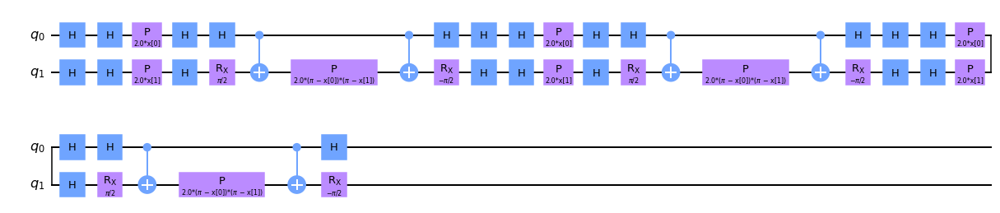


Quantum kernel matrices:



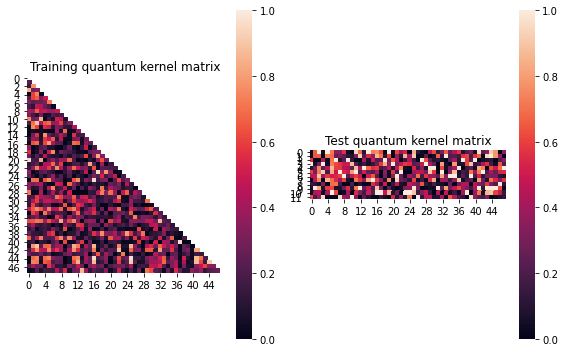


SVM with quantum kernel trained!


Test set performance:


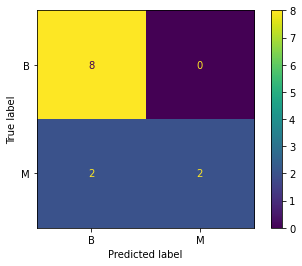

              precision    recall  f1-score   support

           B       0.80      1.00      0.89         8
           M       1.00      0.50      0.67         4

    accuracy                           0.83        12
   macro avg       0.90      0.75      0.78        12
weighted avg       0.87      0.83      0.81        12


metric 1: 0.015114812262381705
metric(s) 2: (00, 10, 11) = (0.3042764509138251, 0.2799499665962432, 0.2858531068034247)
metric 3: 9.993095210659307e-258


----> Kernel construction duration: 00:02:10


Combination 185/200
(Current range: 5/20)
			 reps : 3
			 paulis : ['YZ', 'ZX']
			 entanglement : linear

Feature map:


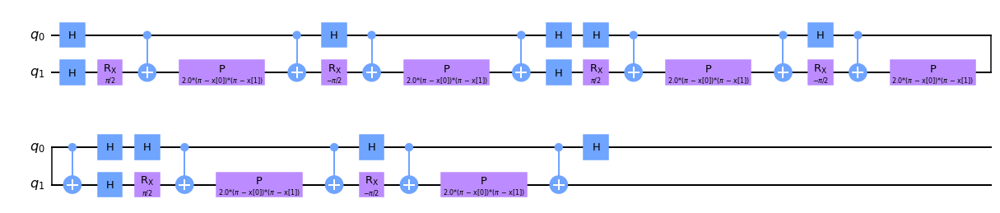


Quantum kernel matrices:



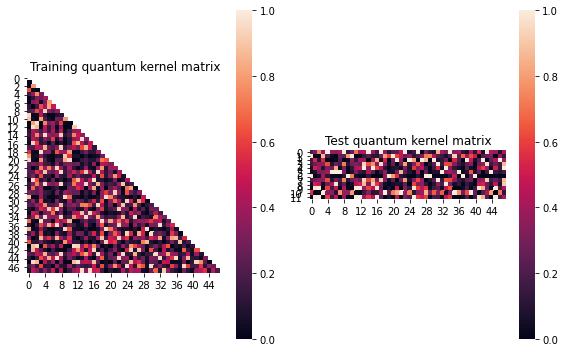


SVM with quantum kernel trained!


Test set performance:


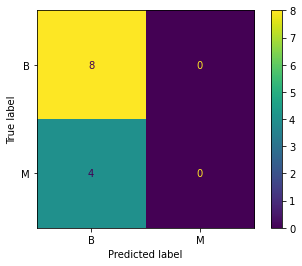

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.014889789168416434
metric(s) 2: (00, 10, 11) = (0.3351314612523292, 0.32464857714071294, 0.34394527136592956)
metric 3: 8.4488e-319


----> Kernel construction duration: 00:03:15


Combination 186/200
(Current range: 6/20)
			 reps : 3
			 paulis : ['XX', 'XX']
			 entanglement : linear

Feature map:


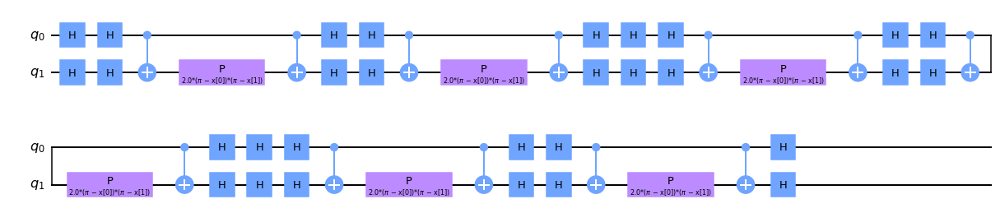


Quantum kernel matrices:



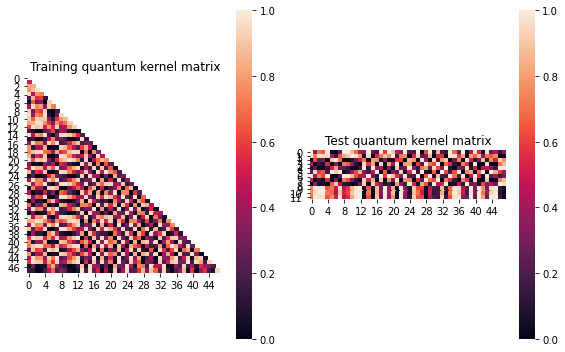


SVM with quantum kernel trained!


Test set performance:


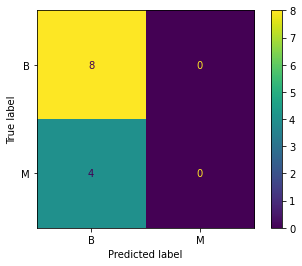

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.02014577279526164
metric(s) 2: (00, 10, 11) = (0.527931204104607, 0.48807396004515613, 0.48850826157622845)
metric 3: -0.0


----> Kernel construction duration: 00:01:45


Combination 187/200
(Current range: 7/20)
			 reps : 2
			 paulis : ['Y', 'XZ']
			 entanglement : linear

Feature map:


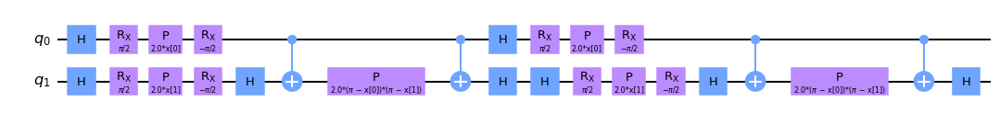


Quantum kernel matrices:



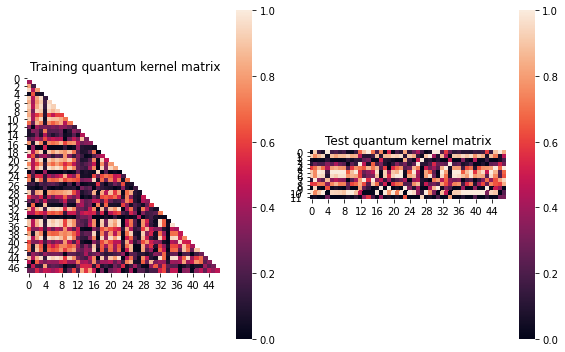


SVM with quantum kernel trained!


Test set performance:


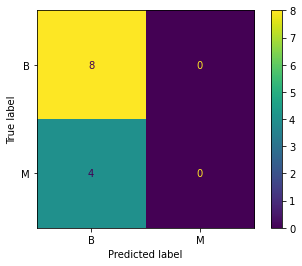

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.005111089638415389
metric(s) 2: (00, 10, 11) = (0.4347456268655012, 0.4186688423198514, 0.41281423705103243)
metric 3: -2.1717892127982e-259


----> Kernel construction duration: 00:01:38


Combination 188/200
(Current range: 8/20)
			 reps : 1
			 paulis : ['XX', 'YX']
			 entanglement : linear

Feature map:


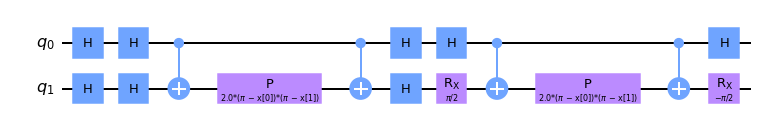


Quantum kernel matrices:



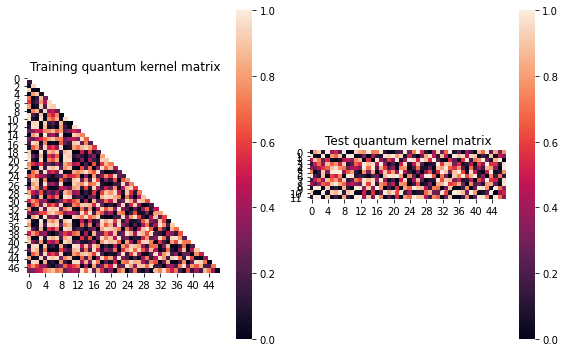


SVM with quantum kernel trained!


Test set performance:


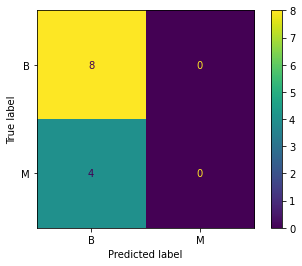

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:48


Combination 189/200
(Current range: 9/20)
			 reps : 3
			 paulis : ['Y', 'X']
			 entanglement : linear

Feature map:


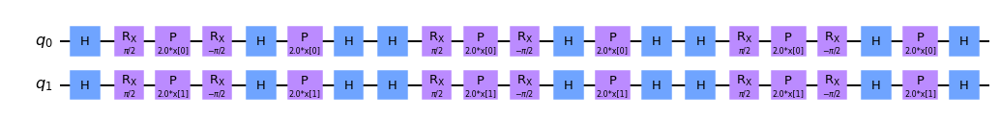


Quantum kernel matrices:



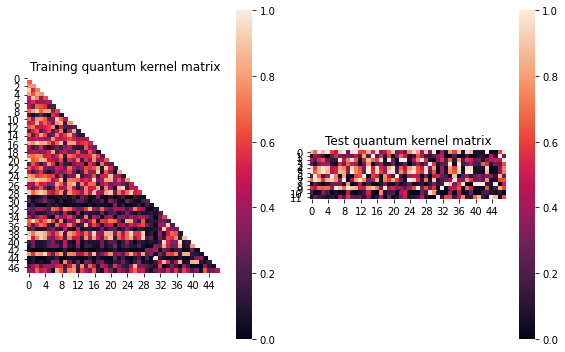


SVM with quantum kernel trained!


Test set performance:


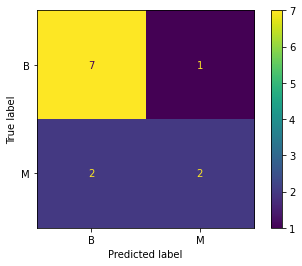

              precision    recall  f1-score   support

           B       0.78      0.88      0.82         8
           M       0.67      0.50      0.57         4

    accuracy                           0.75        12
   macro avg       0.72      0.69      0.70        12
weighted avg       0.74      0.75      0.74        12


metric 1: 0.10894669229966142
metric(s) 2: (00, 10, 11) = (0.4863285476600387, 0.29738458051568933, 0.3263339979706628)
metric 3: 3.558913974140201e-273


----> Kernel construction duration: 00:00:45


Combination 190/200
(Current range: 10/20)
			 reps : 1
			 paulis : ['ZX', 'ZY']
			 entanglement : linear

Feature map:


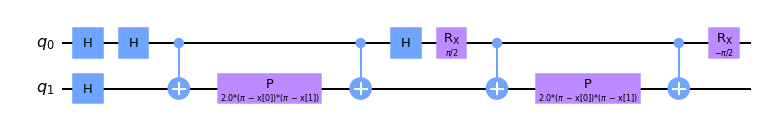


Quantum kernel matrices:



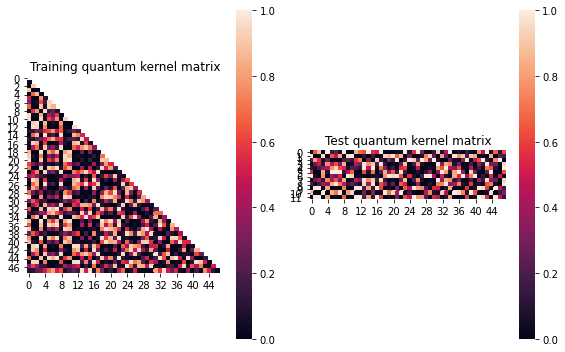


SVM with quantum kernel trained!


Test set performance:


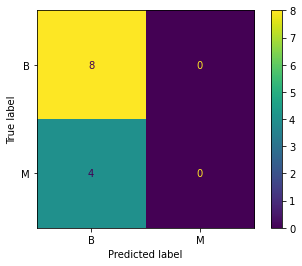

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.011149781973157358
metric(s) 2: (00, 10, 11) = (0.37983392030539015, 0.3687740355208002, 0.3800137146825249)
metric 3: -0.0


----> Kernel construction duration: 00:00:57


Combination 191/200
(Current range: 11/20)
			 reps : 2
			 paulis : ['Y', 'Y']
			 entanglement : linear

Feature map:


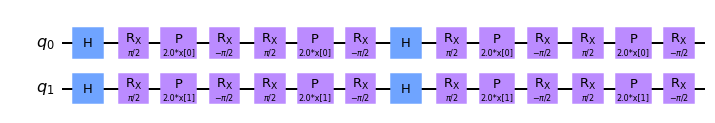


Quantum kernel matrices:



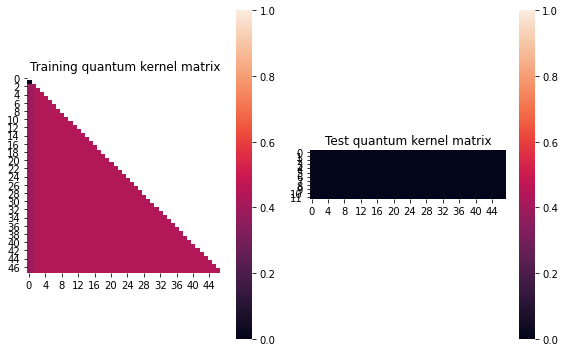


SVM with quantum kernel trained!


Test set performance:


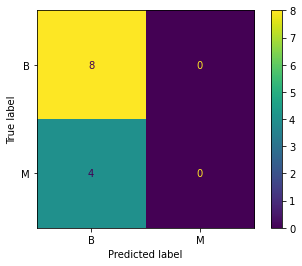

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.0037499999999999756
metric(s) 2: (00, 10, 11) = (0.43875, 0.434375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:22


Combination 192/200
(Current range: 12/20)
			 reps : 3
			 paulis : ['ZY', 'YX']
			 entanglement : linear

Feature map:


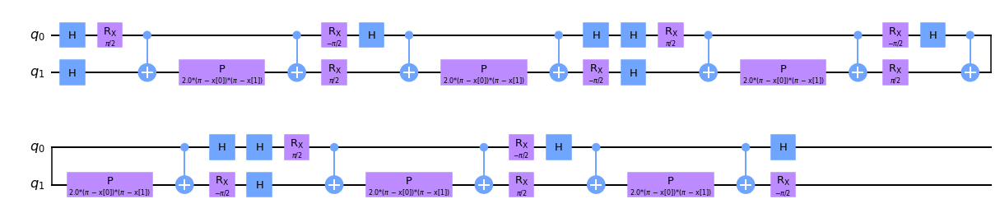


Quantum kernel matrices:



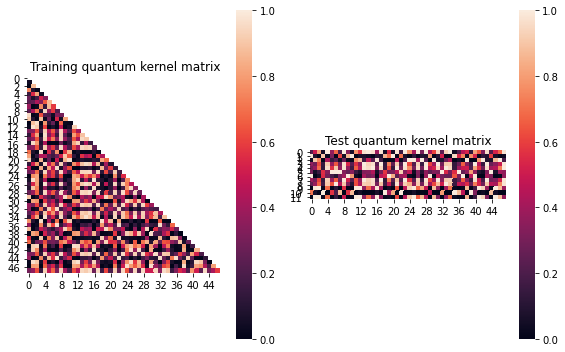


SVM with quantum kernel trained!


Test set performance:


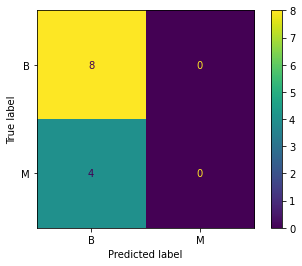

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006434831745365577
metric(s) 2: (00, 10, 11) = (0.4348652235380964, 0.4225354965752613, 0.4230754331031573)
metric 3: -0.0


----> Kernel construction duration: 00:03:35


Combination 193/200
(Current range: 13/20)
			 reps : 1
			 paulis : ['YY', 'YZ']
			 entanglement : linear

Feature map:


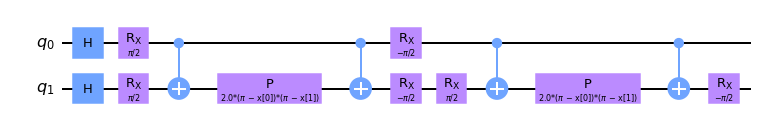


Quantum kernel matrices:



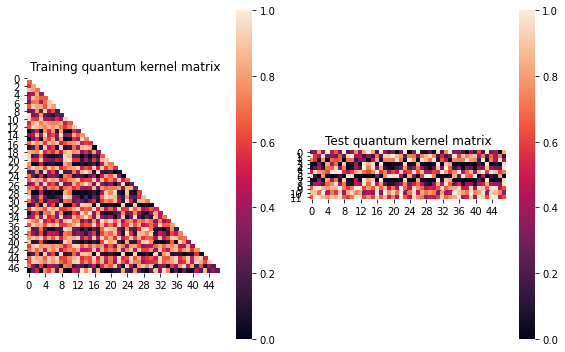


SVM with quantum kernel trained!


Test set performance:


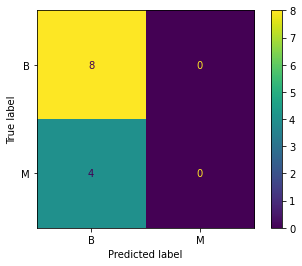

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: -0.001725376281668356
metric(s) 2: (00, 10, 11) = (0.55769599865227, 0.5534831386964368, 0.545819526177267)
metric 3: 0.0


----> Kernel construction duration: 00:01:08


Combination 194/200
(Current range: 14/20)
			 reps : 1
			 paulis : ['Y', 'XY']
			 entanglement : linear

Feature map:


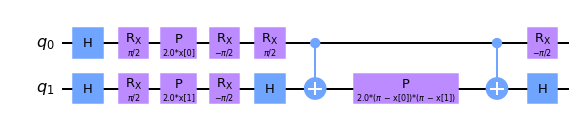


Quantum kernel matrices:



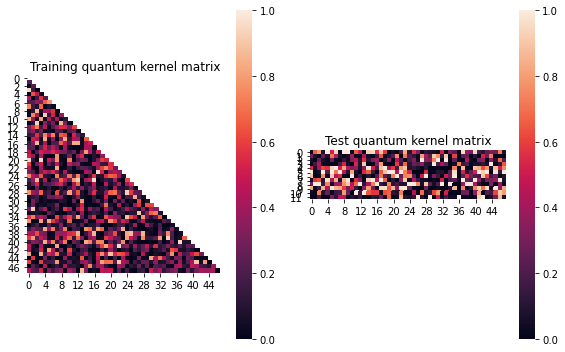


SVM with quantum kernel trained!


Test set performance:


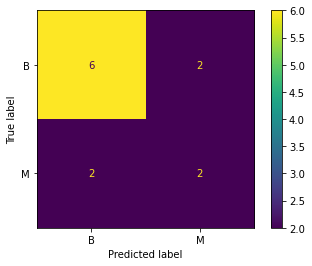

              precision    recall  f1-score   support

           B       0.75      0.75      0.75         8
           M       0.50      0.50      0.50         4

    accuracy                           0.67        12
   macro avg       0.62      0.62      0.62        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.04652759004208121
metric(s) 2: (00, 10, 11) = (0.3109532021123373, 0.2493324516790366, 0.28076688132989824)
metric 3: 1.1941036603909666e-304


----> Kernel construction duration: 00:00:49


Combination 195/200
(Current range: 15/20)
			 reps : 1
			 paulis : ['Z', 'ZZ']
			 entanglement : linear

Feature map:


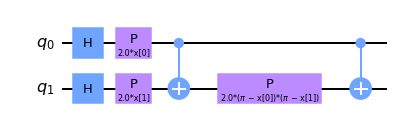


Quantum kernel matrices:



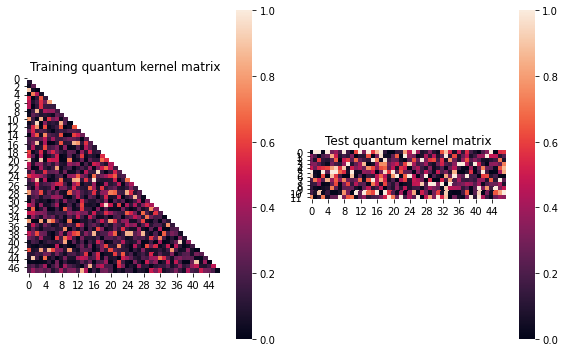


SVM with quantum kernel trained!


Test set performance:


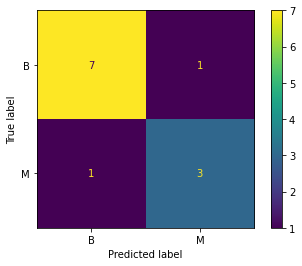

              precision    recall  f1-score   support

           B       0.88      0.88      0.88         8
           M       0.75      0.75      0.75         4

    accuracy                           0.83        12
   macro avg       0.81      0.81      0.81        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.056802919013524245
metric(s) 2: (00, 10, 11) = (0.290141965866011, 0.2190216036546117, 0.261507079470261)
metric 3: -6.337883261999194e-286


----> Kernel construction duration: 00:00:46


Combination 196/200
(Current range: 16/20)
			 reps : 2
			 paulis : ['XZ', 'ZY']
			 entanglement : linear

Feature map:


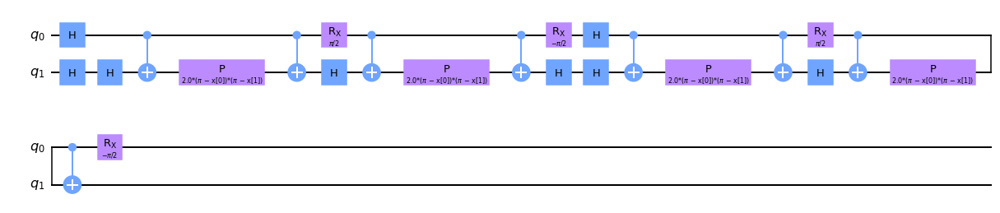


Quantum kernel matrices:



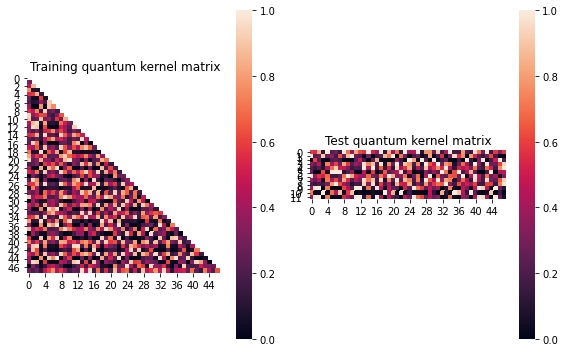


SVM with quantum kernel trained!


Test set performance:


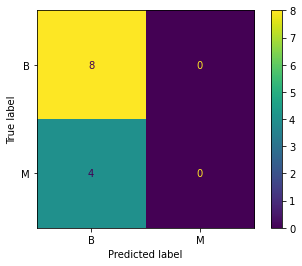

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.023602554074856952
metric(s) 2: (00, 10, 11) = (0.4302845776651415, 0.39300137782713696, 0.4029232861388463)
metric 3: 0.0


----> Kernel construction duration: 00:02:06


Combination 197/200
(Current range: 17/20)
			 reps : 3
			 paulis : ['YZ']
			 entanglement : linear

Feature map:


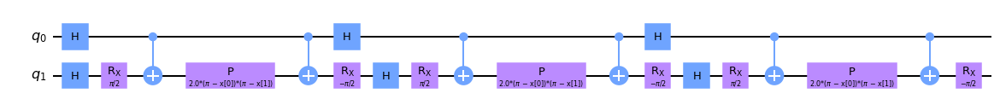


Quantum kernel matrices:



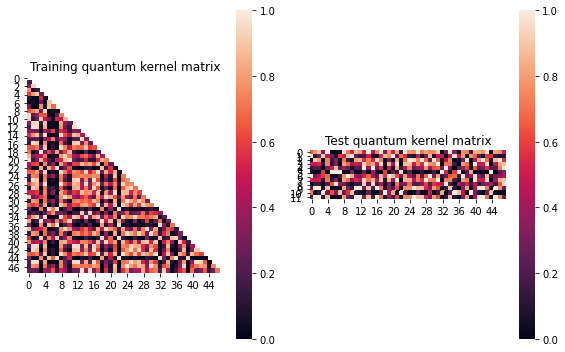


SVM with quantum kernel trained!


Test set performance:


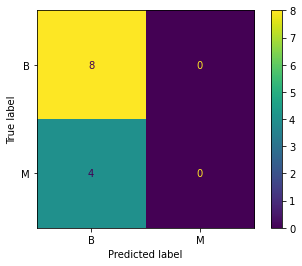

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.024489478801512088
metric(s) 2: (00, 10, 11) = (0.4852152845043629, 0.4567593398195045, 0.4772823527376703)
metric 3: -0.0


----> Kernel construction duration: 00:02:04


Combination 198/200
(Current range: 18/20)
			 reps : 1
			 paulis : ['YY', 'X']
			 entanglement : linear

Feature map:


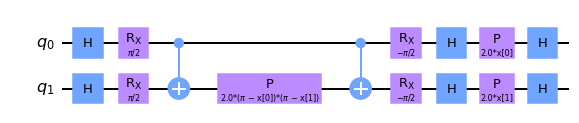


Quantum kernel matrices:



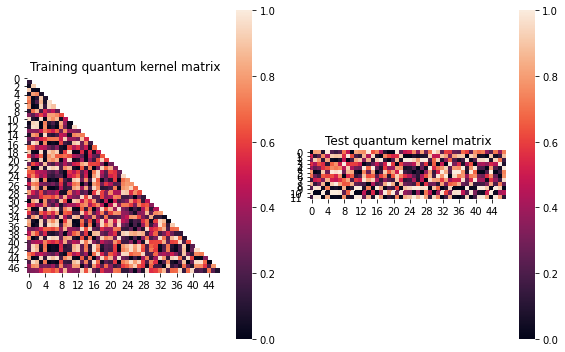


SVM with quantum kernel trained!


Test set performance:


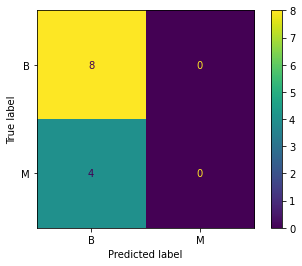

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.007097003157847559
metric(s) 2: (00, 10, 11) = (0.4746397801522789, 0.4750345271028863, 0.48962328036918873)
metric 3: 0.0


----> Kernel construction duration: 00:01:07


Combination 199/200
(Current range: 19/20)
			 reps : 1
			 paulis : ['X', 'ZZ']
			 entanglement : linear

Feature map:


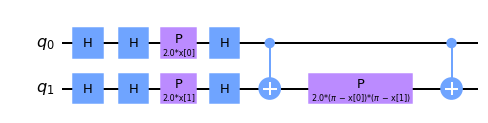


Quantum kernel matrices:



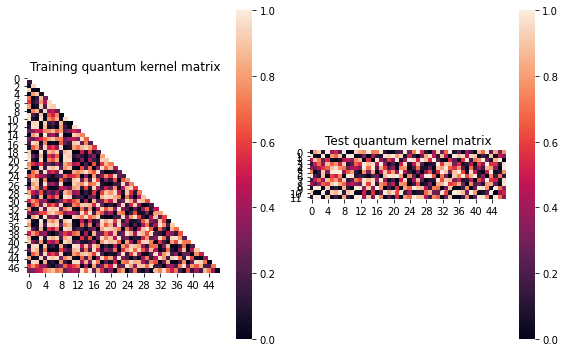


SVM with quantum kernel trained!


Test set performance:


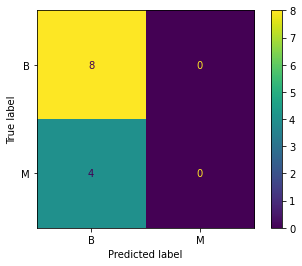

              precision    recall  f1-score   support

           B       0.67      1.00      0.80         8
           M       0.00      0.00      0.00         4

    accuracy                           0.67        12
   macro avg       0.33      0.50      0.40        12
weighted avg       0.44      0.67      0.53        12


metric 1: 0.006867095463511275
metric(s) 2: (00, 10, 11) = (0.48575103947895865, 0.48404128879736297, 0.49606572904278984)
metric 3: -0.0


----> Kernel construction duration: 00:00:46


Combination 200/200
(Current range: 20/20)
			 reps : 3
			 paulis : ['YY', 'X']
			 entanglement : linear

Feature map:


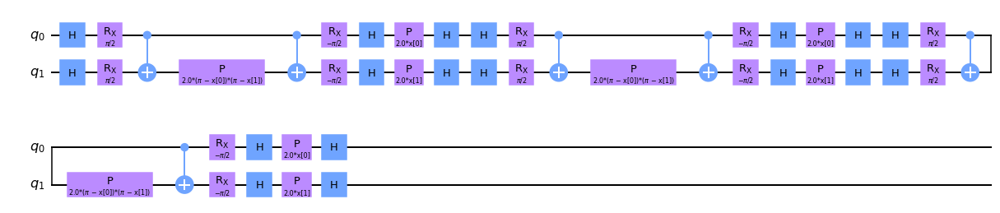


Quantum kernel matrices:



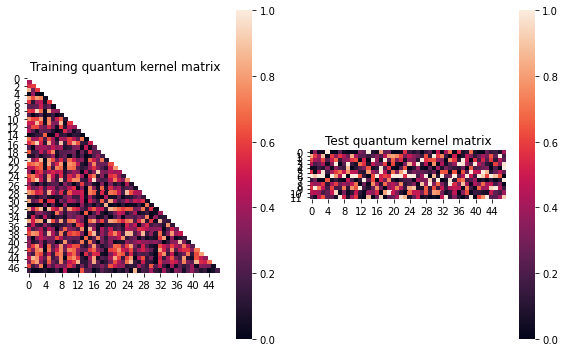


SVM with quantum kernel trained!


Test set performance:


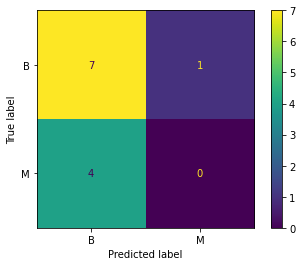

              precision    recall  f1-score   support

           B       0.64      0.88      0.74         8
           M       0.00      0.00      0.00         4

    accuracy                           0.58        12
   macro avg       0.32      0.44      0.37        12
weighted avg       0.42      0.58      0.49        12


metric 1: 0.01909572170233398
metric(s) 2: (00, 10, 11) = (0.3773870181634941, 0.3465892420566841, 0.3539829093545421)
metric 3: -7.503787304292788e-256


----> Kernel construction duration: 00:02:35


In [20]:
j=9
results.append(run_kernel_evaluation(X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))

### Final analysis

In [21]:
df_results = pd.concat(results).sort_values("density_diff", ascending=False)

df_results.shape

(200, 10)

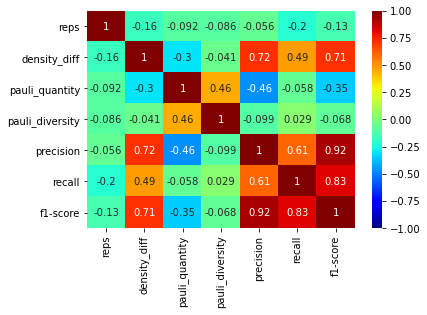

In [22]:
sns.heatmap(df_results.corr(), vmin=-1, vmax=1, annot=True, cmap="jet")

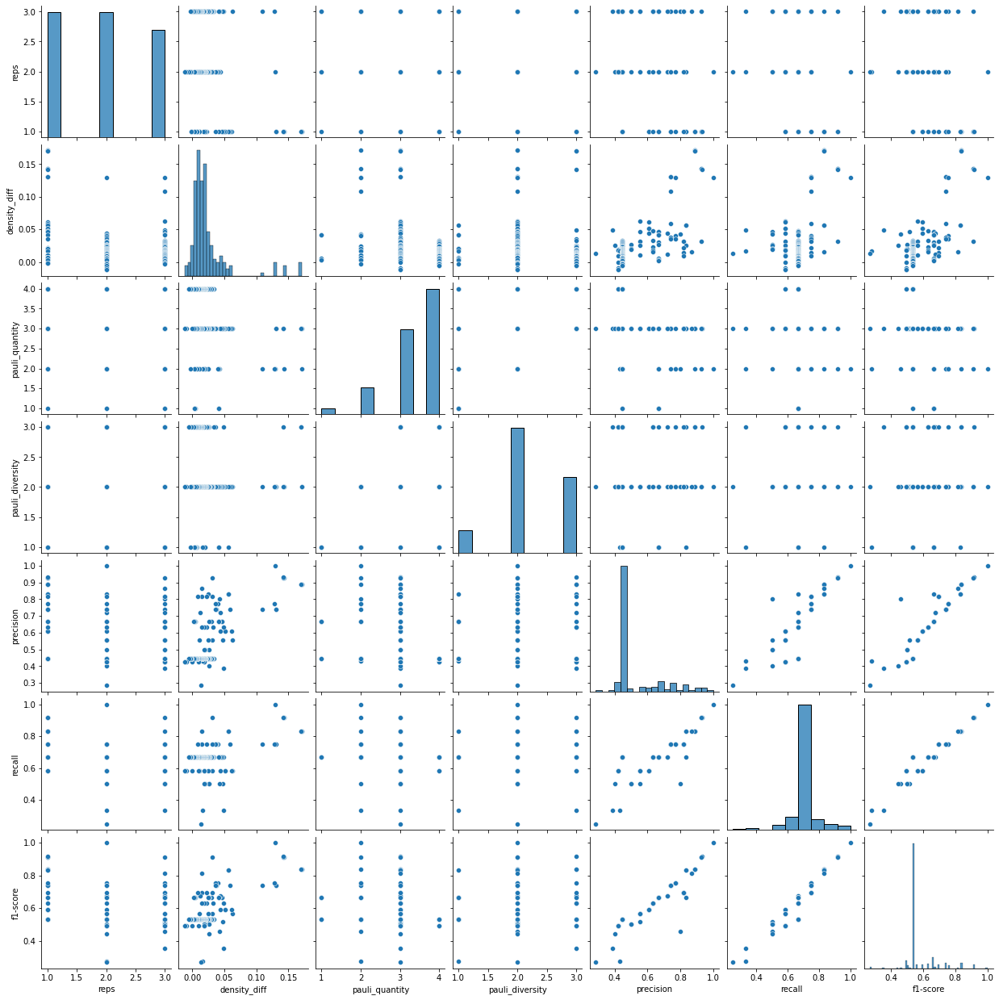

In [23]:
sns.pairplot(df_results)

In [24]:
df_results.to_csv("./results/results_breast_cancer.csv")

In [25]:
df_results

,reps,paulis,entanglement,density_diff,densities,pauli_quantity,pauli_diversity,precision,recall,f1-score
3,1,"[X, Y]",linear,0.171414,"(0.46610972478155727, 0.20369470838303871, 0.2...",2,2,0.888889,0.833333,0.838095
9,1,"[XX, Y]",linear,0.171414,"(0.46610972478155727, 0.20369470838303871, 0.2...",3,2,0.888889,0.833333,0.838095
10,1,"[Y, XZ]",linear,0.170414,"(0.44067324193045426, 0.1840589967608287, 0.26...",3,3,0.888889,0.833333,0.838095
6,1,"[Z, XY]",linear,0.170414,"(0.44067324193045426, 0.1840589967608287, 0.26...",3,3,0.888889,0.833333,0.838095
5,1,"[Y, Z]",linear,0.142837,"(0.46113915593376736, 0.2641700072979352, 0.35...",2,2,0.925926,0.916667,0.913165
...,...,...,...,...,...,...,...,...,...,...
4,2,"[YZ, XY]",linear,-0.004942,"(0.3882678447405788, 0.38528458886425504, 0.37...",4,3,0.444444,0.666667,0.533333
0,2,"[XY, YZ]",linear,-0.004942,"(0.3882678447405788, 0.38528458886425504, 0.37...",4,3,0.444444,0.666667,0.533333
14,2,"[Y, ZY]",linear,-0.009355,"(0.5044980677482835, 0.5178256473058047, 0.512...",3,2,0.424242,0.583333,0.491228
13,2,"[YZ, Y]",linear,-0.012094,"(0.40790929309218094, 0.43151709232838603, 0.4...",3,2,0.424242,0.583333,0.491228


From the results dataframe, we can get the parameters yielding the best results (notice that it was sorted by the `density_diff`, which is the quality metric):

In [26]:
best_params = df_results.iloc[0][["reps", "paulis", "entanglement"]].tolist()

best_params

[1, ['X', 'Y'], 'linear']

We can then visualize the resulting decision boundary:


Feature map:


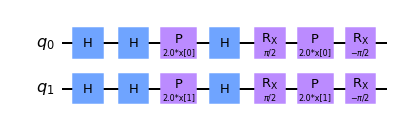


Quantum kernel matrices:



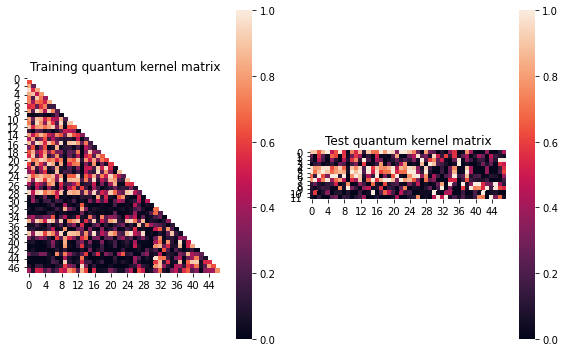


SVM with quantum kernel trained!


Test set performance:


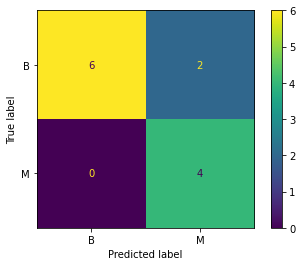

              precision    recall  f1-score   support

           B       1.00      0.75      0.86         8
           M       0.67      1.00      0.80         4

    accuracy                           0.83        12
   macro avg       0.83      0.88      0.83        12
weighted avg       0.89      0.83      0.84        12



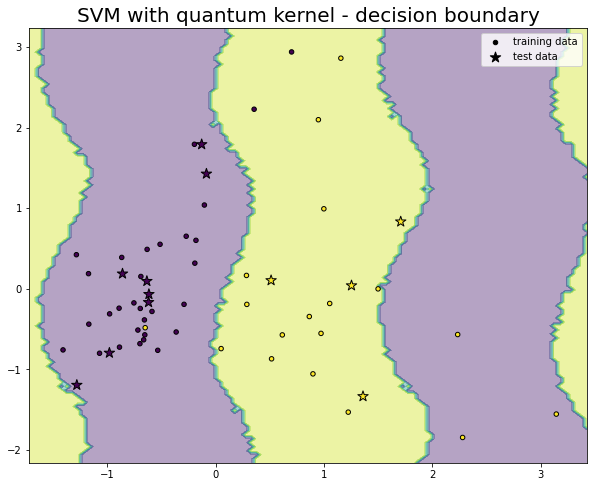

In [51]:
_ = qsvm(X_train, y_train, X_test, y_test, *best_params, shots=1024, plot_stuff=True,
         plot_boundary = True, spacing=0.05, quantum_kernel=True)

We can also visualize the action of the feature map on individual observations:


Feature mapping of 0-th observation:

Datapoint: [-0.694 -0.245]


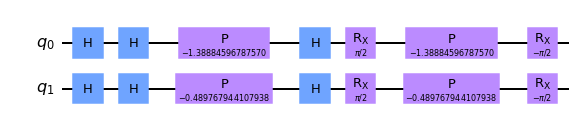


State:	[0.504-0.689j 0.046-0.063j 0.303-0.414j 0.028-0.038j]



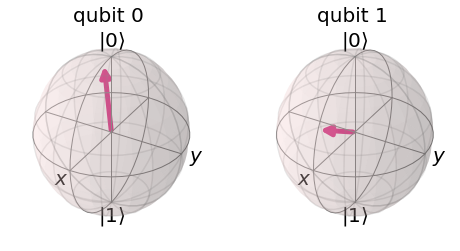

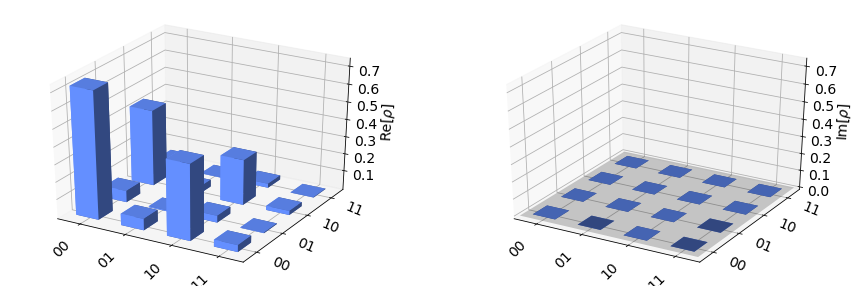

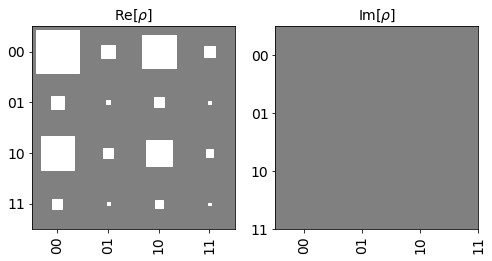

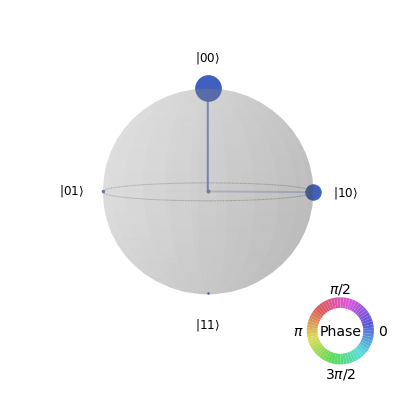






Feature mapping of 1-th observation:

Datapoint: [-0.865  0.388]


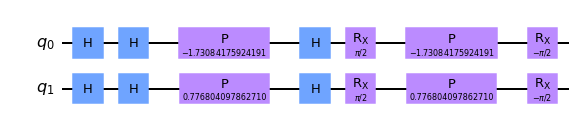


State:	[ 0.342-0.177j -0.027+0.014j  0.817-0.422j -0.065+0.034j]



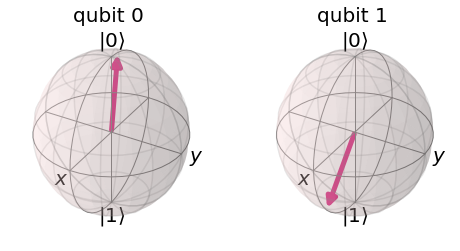

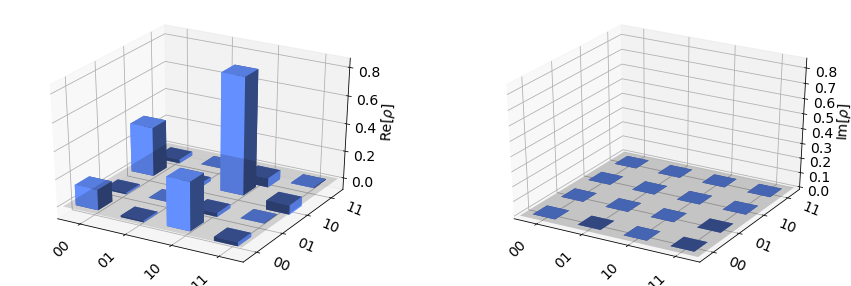

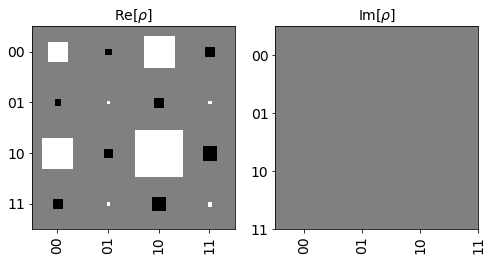

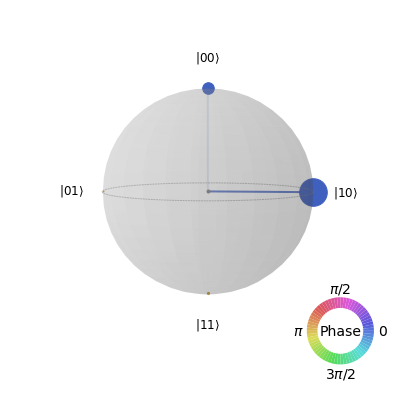






Feature mapping of 2-th observation:

Datapoint: [-0.663 -0.635]


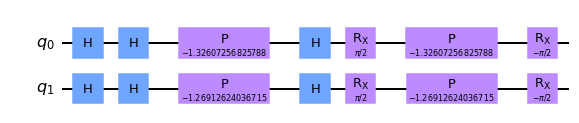


State:	[0.265-0.945j 0.033-0.116j 0.04 -0.144j 0.005-0.018j]



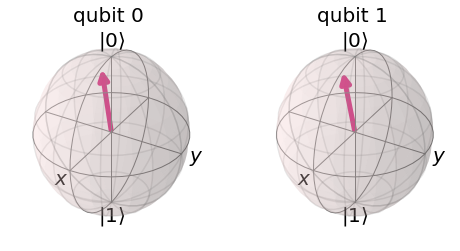

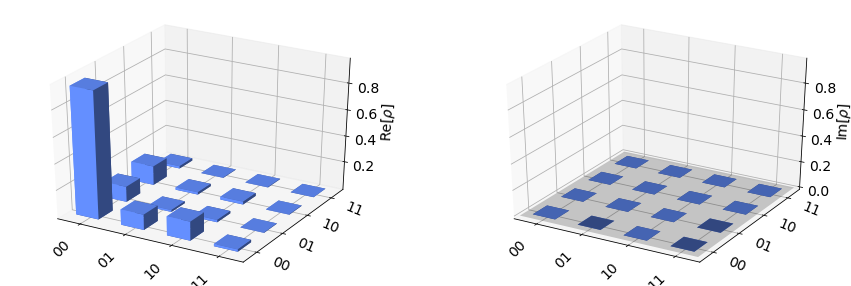

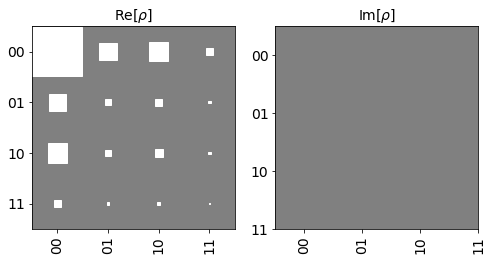

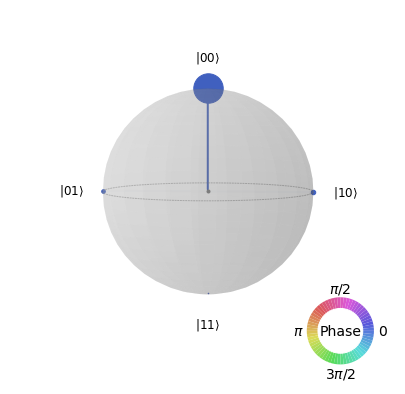






Feature mapping of 3-th observation:

Datapoint: [-0.586 -0.282]


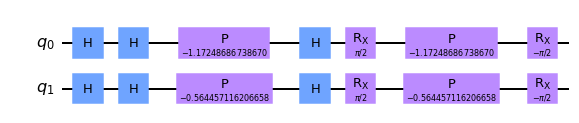


State:	[0.555-0.656j 0.112-0.132j 0.305-0.361j 0.062-0.073j]



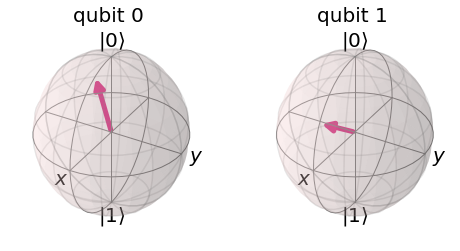

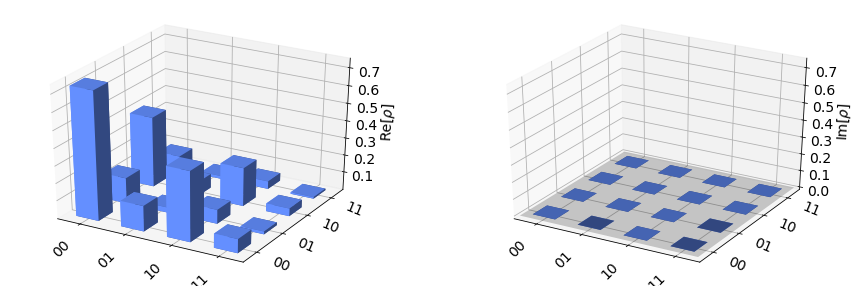

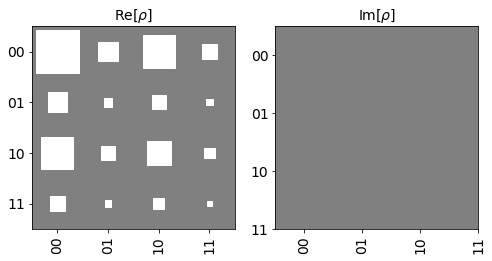

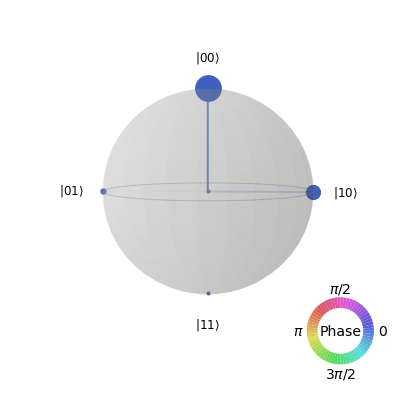






Feature mapping of 4-th observation:

Datapoint: [-0.689  0.152]


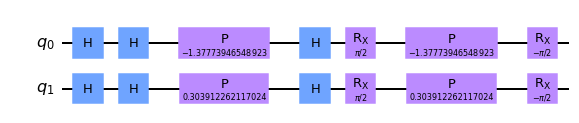


State:	[0.506-0.301j 0.049-0.029j 0.689-0.41j  0.067-0.04j ]



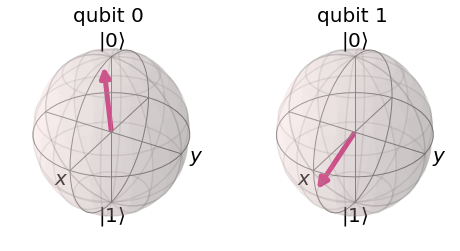

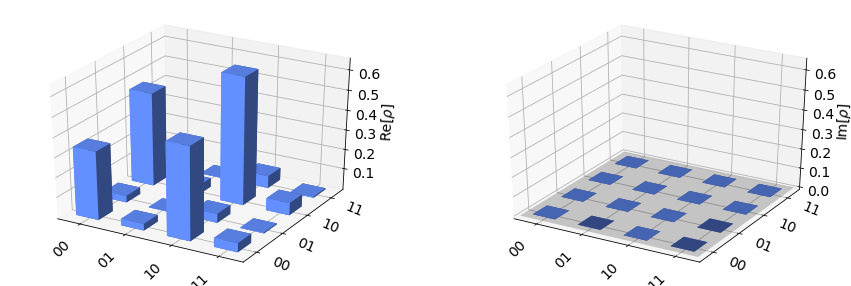

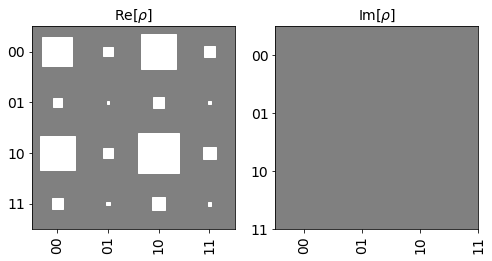

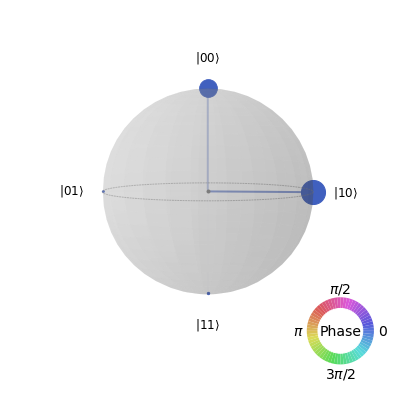

In [28]:
for i in range(5):
    
    visualize_feature_mapping(*best_params, X=X_train, idx=i)
    
    print("\n")
    print("="*80)
    print("="*80)
    print("="*80)
    print("\n")

________________
________________
________________
________________
________________